# **0. Intro (ambiente)**

In [ ]:
!pip install kaleido
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

#now this works:
import plotly.graph_objects as go

fig = go.Figure()
fig.write_image('prova_do_not_consider.png')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats
from sklearn.metrics import *
from sklearn import linear_model

#Plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# **1. Caricamento dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#data_ricercatore = pd.read_csv("/content/drive/MyDrive/Tesi/Dataset_partenza - Dataset_partenza.csv", sep=",")
#data= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_dummy.csv", sep=",")
#data_originale= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_originale.csv", sep=",")

data_ricercatore = pd.read_csv("/content/drive/MyDrive/Tesi/Dataset/Dataset_partenza - Dataset_partenza.csv", sep=",")
data= pd.read_csv("/content/drive/MyDrive/Tesi/Dataset/dataset_dummy.csv", sep=",")
data2= pd.read_csv("/content/drive/MyDrive/Tesi/Dataset/dataset_dummy_v2.csv", sep=",")
data_originale= pd.read_csv("/content/drive/MyDrive/Tesi/Dataset/dataset_originale.csv", sep=",")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
"""
def classificare_reddito(reddito):
    if reddito < 23431.5:
        return 'Estremamente Bassa'
    elif 23431.5 <= reddito < 39052.5:
        return 'Molto Bassa'
    elif 39052.5 <= reddito < 58578.75:
        return 'Bassa'
    elif 58578.75 <= reddito < 156210:
        return 'Media'
    elif 156210 <= reddito < 234315:
        return 'Alta'
    elif 234315 <= reddito < 390525:
        return 'Molto Alta'
    else:
        return 'Estremamente Alta'
data_originale['Classe Reddito Familiare' ] = data_originale['Reddito familiare'].apply(classificare_reddito)
"""

"\ndef classificare_reddito(reddito):\n    if reddito < 23431.5:\n        return 'Estremamente Bassa'\n    elif 23431.5 <= reddito < 39052.5:\n        return 'Molto Bassa'\n    elif 39052.5 <= reddito < 58578.75:\n        return 'Bassa'\n    elif 58578.75 <= reddito < 156210:\n        return 'Media'\n    elif 156210 <= reddito < 234315:\n        return 'Alta'\n    elif 234315 <= reddito < 390525:\n        return 'Molto Alta'\n    else:\n        return 'Estremamente Alta'\ndata_originale['Classe Reddito Familiare' ] = data_originale['Reddito familiare'].apply(classificare_reddito)\n"

In [ ]:
data_originale.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 18 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Reddito familiare                                             10688 non-null  int64  
 3   Classe Reddito Familiare                                      10688 non-null  object 
 4   Livello di istruzione                                         10688 non-null  object 
 5   Casa di proprietà                                             10688 non-null  object 
 6   Casa Indipendente                                             10688 non-null  object 
 7   Numero persone in famiglia                                    10688

In [ ]:
n_variabili= len(data_originale.columns)
print("Il numero di variabili nel dataset è di:", n_variabili)

n_casi= len(data)
print(f"\nIl numero di casi nel dataset è di: {n_casi}")
print(f"\nLe variabili nel dataset: {data_originale.columns.values}")

Il numero di variabili nel dataset è di: 18

Il numero di casi nel dataset è di: 10688

Le variabili nel dataset: ['Genere' "Classe d'età" 'Reddito familiare' 'Classe Reddito Familiare'
 'Livello di istruzione' 'Casa di proprietà' 'Casa Indipendente'
 'Numero persone in famiglia' 'Numero di auto in famiglia'
 'Importanza di ridurre le emissioni di gas serra'
 'Tipologia di auto precedente' 'Auto attuale' 'Tipologia di auto attuale'
 'BEV dummy' 'Viaggio più lungo negli ultimi 12 mesi'
 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'
 'Distanza casa-lavoro' 'VMT annuo']


# **2. Analisi Univariata (distribuzione)**

## 2.1. Variabili socio-demografiche

In [ ]:
genere_counts = data_originale['Genere'].value_counts()
labels = genere_counts.index
sizes = genere_counts.values

fig_var_gen = px.pie(
    names=labels,
    values=sizes,
    color=labels,
    color_discrete_map={'Femmina': 'mediumslateblue', 'Maschio': 'deepskyblue'},
    title='Distribuzione della variabile Genere',
    template='plotly',)

fig_var_gen.update_traces(textinfo='percent+label') #pull=[0.1, 0]
fig_var_gen.update_layout(title =
                 {'text': "Distribuzione della variabile Genere",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=600,
                  width=600,
)
fig_var_gen.show()

In [ ]:
order_età = ['<25', '25-34', '35-44', '45-54', '55-64', '65-74', '75-79', '>80']
classe_eta_counts = data_originale['Classe d\'età'].value_counts().reindex(order_età)

fig_var_eta = px.bar(
    x=classe_eta_counts.index,
    y=classe_eta_counts.values,
    labels={'x': "Classe d'età", 'y': 'Conteggi'},
    title="Distribuzione della variabile Classe d'età",
    color=classe_eta_counts.index,
    color_discrete_map={"<25": "royalblue", "25-34": "dodgerblue", "35-44": "mediumslateblue",
                        "45-54": "cornflowerblue", "55-64": "lightsteelblue", "65-74": "lightskyblue",
                        "75-79": "deepskyblue", ">80": "skyblue"},
)

#percentuali sopra le barre
total = len(data_originale["Classe d'età"])
for i, p in enumerate(classe_eta_counts.values):
    percentage = f'{100 * p / total:.1f}%'
    fig_var_eta.add_annotation(
        x=classe_eta_counts.index[i],
        y=p + 100,  # Posizione dell'annotazione sopra la barra
        text=percentage,
        showarrow=False,
        font=dict(size=12))

fig_var_eta.update_layout(
    xaxis_tickangle=45,
    xaxis_title="Classe d'età",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Classe d'età",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
      },
    height=600,
    width=1200,)

fig_var_eta.show()

In [ ]:
fig_var_red = px.histogram(
    data_originale,
    x="Reddito familiare",
    nbins=30,
    color_discrete_sequence=["mediumblue"],
    title="Distribuzione della variabile Reddito Familiare",
    labels={"Reddito familiare": "Reddito Familiare"},)
#etichette sull'asse x con intervallo di 50000
fig_var_red.update_xaxes(tickmode='array',tickvals=list(range(0, int(data_originale["Reddito familiare"].max()) + 1, 50000)),)
fig_var_red.update_layout(
    xaxis_tickangle=45,
    yaxis_tickformat='.0f',  # Formato numerico per l'asse y
    xaxis_title="Reddito Familiare",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Reddito Familiare",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200)
fig_var_red.show()

In [ ]:
order_red = ["Bassa", "Media", "Alta", "Molto alta", "Estremamente alta"]
classe_reddito_counts = data_originale['Classe Reddito Familiare'].value_counts().reindex(order_red)


fig_var_classred = px.bar(
    x=classe_reddito_counts.index,
    y=classe_reddito_counts.values,
    labels={'x': "Classe Reddito Familiare", 'y': 'Conteggi'},
    title="Distribuzione della variabile Classe di reddito",
    color=classe_reddito_counts.index,
    color_discrete_map={"Bassa":"royalblue", "Media":"dodgerblue", "Alta": "mediumslateblue",
                             "Molto alta":"cornflowerblue", "Estremamente alta": "lightsteelblue"})

total = len(data_originale["Classe Reddito Familiare"])
for i, p in enumerate(classe_reddito_counts.values):
    percentage = f'{100 * p / total:.1f}%'
    fig_var_classred.add_annotation(
        x=classe_reddito_counts.index[i],
        y=p + 100,  # Posizione dell'annotazione sopra la barra
        text=percentage,
        showarrow=False,
        font=dict(size=12))

fig_var_classred.update_layout(
    xaxis_tickangle=45,
    yaxis_tickformat='.0f',  # Formato numerico per l'asse y
    xaxis_title="Classe Reddito Familiare",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Classe Reddito Familiare",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
      },
    height=600,
    width=1200)
fig_var_classred.show()

In [ ]:
order_ist = ['Licenza Media', 'Diploma o Qualifica professionale', 'Laurea 1L', 'Laurea 2L o Dottorato']
livello_istruzione_counts = data_originale['Livello di istruzione'].value_counts().reindex(order_ist)

fig_var_ist = px.bar(
    x=livello_istruzione_counts.index,
    y=livello_istruzione_counts.values,
    labels={'x': "Livello di istruzione", 'y': 'Conteggi'},
    title="Distribuzione della variabile Livello di istruzione",
    color=livello_istruzione_counts.index,
    color_discrete_map={"Licenza Media":"lightsteelblue", "Diploma o Qualifica professionale":"dodgerblue",
                        "Laurea 1L": "royalblue", "Laurea 2L o Dottorato":"mediumslateblue"})

total = len(data_originale["Livello di istruzione"]) # le percentuali sopra le barre
for i, p in enumerate(livello_istruzione_counts.values):
    percentage = f'{100 * p / total:.1f}%'
    fig_var_ist.add_annotation(x=livello_istruzione_counts.index[i],y=p + 100, text=percentage,showarrow=False,font=dict(size=12))

fig_var_ist.update_layout(
    xaxis_tickangle=45,
    yaxis_tickformat='.0f',  # Formato numerico per l'asse y
    xaxis_title="Livello di istruzione",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Livello di istruzione",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200)
fig_var_ist.show()

#### Save Plots

In [ ]:
#fig_var_gen.write_image('Distribuzione_Genere.pdf')
#fig_var_eta.write_image('Distribuzione_Classe_età.pdf')
#fig_var_red.write_image('Distribuzione_Reddito_familiare.pdf')
#fig_var_classred.write_image('Distribuzione_Classe_reddito.pdf')
#fig_var_ist.write_image('Distribuzione_Livello_istruzione.pdf')

## 2.2. Variabili abitative

In [ ]:
casa_proprietà_counts = data_originale['Casa di proprietà'].value_counts()
labels = casa_proprietà_counts.index
sizes = casa_proprietà_counts.values
colors = ['mediumseagreen', 'mediumspringgreen']

fig_var_casprop = go.Figure(data=[go.Pie(
    labels=labels,
    values=sizes,
    textinfo='percent+label',
    hoverinfo='label+percent',
    marker=dict(colors=colors),
    direction='clockwise',
    textfont=dict(size=18, color='black', family='Arial'),)])

fig_var_casprop.update_layout(title =
                 {'text': "Distribuzione della variabile Casa di proprietà",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=600,width=600,)
fig_var_casprop.show()

In [ ]:
casa_indipednente_counts = data_originale['Casa Indipendente'].value_counts()
labels = casa_indipednente_counts.index
sizes = casa_indipednente_counts.values
colors = ['mediumseagreen', 'mediumspringgreen']

fig_var_casind = go.Figure(data=[go.Pie(
    labels=labels,
    values=sizes,
    textinfo='percent+label',
    hoverinfo='label+percent',
    marker=dict(colors=colors),
    direction='clockwise',
    textfont=dict(size=18, color='black', family='Arial'))])

fig_var_casind.update_layout(title =
                 {'text': "Distribuzione della variabile Casa Indipendente",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=600,width=600,)
fig_var_casind.show()

In [ ]:
numero_persone_counts = data_originale['Numero persone in famiglia'].value_counts()
fig_var_nfam = px.bar(
    x=numero_persone_counts.index,
    y=numero_persone_counts.values,
    labels={'x': "Numero persone in famiglia", 'y': 'Conteggi'},
    title="Distribuzione della variabile Classe d'età",
    color=numero_persone_counts.index,
    color_continuous_scale=list(px.colors.sequential.Greens)[::-1],  # Gradiente di verde invertito
    )

total = len(data_originale["Numero persone in famiglia"])
for i, p in enumerate(numero_persone_counts.values):
    percentage = f'{100 * p / total:.1f}%'
    fig_var_nfam.add_annotation(x=numero_persone_counts.index[i], y=p + 100, text=percentage, showarrow=False, font=dict(size=12))

fig_var_nfam.update_layout(
    xaxis_tickangle=0,
    xaxis_title="Numero persone in famiglia",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Numero persone in famiglia",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600, width=1200, xaxis=dict(tickmode='array',tickvals=[str(i) for i in range(1, 14)]))
fig_var_nfam.show()

In [ ]:
numero_auto_counts = data_originale['Numero di auto in famiglia'].value_counts()
fig_var_nauto = px.bar(
    x=numero_auto_counts.index,
    y=numero_auto_counts.values,
    labels={'x': "Numero di auto in famiglia", 'y': 'Conteggi'},
    title="Distribuzione della variabile Classe d'età",
    color=numero_auto_counts.index,
    color_continuous_scale=list(px.colors.sequential.Greens)[::-1])

total = len(data_originale["Numero di auto in famiglia"])
for i, p in enumerate(numero_persone_counts.values):
    percentage = f'{100 * p / total:.1f}%'
    fig_var_nauto.add_annotation(x=numero_persone_counts.index[i], y=p + 100, text=percentage, showarrow=False, font=dict(size=12))

fig_var_nauto.update_layout(
    xaxis_tickangle=0,
    xaxis_title="Numero di auto in famiglia",
    yaxis_title="Conteggi",
    title =
     {'text': "Distribuzione della variabile Numero di auto in famiglia",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600, width=1200, xaxis=dict(tickmode='array', tickvals=[str(i) for i in range(1, 6)]))
fig_var_nauto.show()

C'è una correlazione tra il numero delle auto e la grandezza del nucleo familaire?

In [ ]:
correlation_coefficient = data_originale['Numero di auto in famiglia'].corr(data_originale['Numero persone in famiglia'], method='pearson')
print(f"Il coefficiente di correlazione di Pearson tra 'Numero di auto in famiglia' e 'Numero di persone in famiglia' è: {correlation_coefficient:.4f}")

Il coefficiente di correlazione di Pearson tra 'Numero di auto in famiglia' e 'Numero di persone in famiglia' è: 0.3739


In [ ]:
cross_tab = pd.crosstab(data['Numero di auto in famiglia'], data['Numero persone in famiglia'], normalize='all')
fig_ctab = px.imshow(
    cross_tab.values,
    labels=dict(x="Numero persone in famiglia", y="Numero di auto in famiglia", color="Percentuale"),
    x=cross_tab.columns.astype(str),  # Etichette x (devono essere esplicitamente stringhe), perché se no vengono traslate
    y=cross_tab.index.astype(str),  # Etichette y (devono essere esplicitamente stringhe), perché se no vengono traslate
    color_continuous_scale="YlGnBu",
    color_continuous_midpoint=0.5, )

for i in range(len(cross_tab.index)):
    for j in range(len(cross_tab.columns)):
        text_color = 'white' if cross_tab.iloc[i, j] > 0.20 else 'black'
        fig_ctab.add_annotation(x=j, y=i, text=f'{cross_tab.iloc[i, j]:.2%}', showarrow=False, font=dict(size=10, color=text_color))

fig_ctab.update_coloraxes(cmin=0, cmax=0.30) #determinare il minimo e massimo della scala

fig_ctab.update_layout(
    title =
     {'text': "Relazione tra Numero di auto e Numero di persone in famiglia (Percentuali)",
      'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600, width=1200,
    xaxis_title='Numero persone in famiglia',
    yaxis_title='Numero di auto in famiglia',
    xaxis=dict(tickmode='array', tickvals=list(range(len(cross_tab.columns)))),  # Allineamento X
    yaxis=dict(tickmode='array', tickvals=list(range(len(cross_tab.index)))),  # Allineamento Y
)
fig_ctab.show()

#### Save plots

In [ ]:
#fig_var_casprop.write_image('Distribuzione_Casa_proprietà.pdf')
#fig_var_casind.write_image('Distribuzione_Casa_indipendente.pdf')
#fig_var_nfam.write_image('Distribuzione_Numero_persone_fam.pdf')
#fig_var_nauto.write_image('Distribuzione_Numero_auto_fam.pdf')
#fig_ctab.write_image('Relazione_Numero_auto_fam_Numero_persone_fam.png',scale=5)

## 2.3. Variabile Importanza di ridurre le emissioni di gas serra

In [ ]:
mean_emission_importance = data_originale['Importanza di ridurre le emissioni di gas serra'].mean()
median_emission_importance = data_originale['Importanza di ridurre le emissioni di gas serra'].median()

print(f"Media di 'Importanza di ridurre le emissioni di gas serra': {mean_emission_importance:.2f}")
print(f"Mediana di 'Importanza di ridurre le emissioni di gas serra': {median_emission_importance:.2f}")

Media di 'Importanza di ridurre le emissioni di gas serra': 1.62
Mediana di 'Importanza di ridurre le emissioni di gas serra': 2.51


In [ ]:
fig_var_sens_bp = px.box(data_originale, y='Importanza di ridurre le emissioni di gas serra',
                 labels={'Importanza di ridurre le emissioni di gas serra': 'Importanza di Ridurre le Emissioni di Gas Serra'}, points="all")
fig_var_sens_bp.update_layout(
    title ={'text': "Box plot della variabile Importanza di ridurre le emissioni di gas serra",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
            },    xaxis_title="Importanza di ridurre le emissioni di gas serra")
fig_var_sens_bp.update_traces(marker=dict(color='orange'))
fig_var_sens_bp.show()

In [ ]:
fig_var_sens_2 = px.histogram(
    data_frame=data_originale,
    x="Importanza di ridurre le emissioni di gas serra",
    color_discrete_sequence=["orange"],
    histnorm="percent",
    labels={"Importanza di ridurre le emissioni di gas serra": "Importanza di ridurre le emissioni di gas serra"},)

fig_var_sens_2.update_traces(marker=dict(line=dict(color="black", width=0.5))) #contorno ai bin

#padding visivo senza cambiare i bin
fig_var_sens_2.update_layout(
    title ={'text': "Distribuzione della variabile Importanza di ridurre le emissioni di gas serra",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
            },    xaxis_title="Importanza di ridurre le emissioni di gas serra",
    yaxis_title="Percentuale",
    font=dict(size=16),
    yaxis=dict(tickformat=".0f"),
    xaxis=dict(
        tickvals=[-3, -2, -1, 0, 1, 2, 3],  # Impostazione dei tick
        tickmode="array",
        range=[-3.3, 3.3],  #padding extra solo nella visualizzazione
    ),
    height=600,
    width=1200,)
fig_var_sens_2.show()

In [ ]:
fig_var_sens_1 = px.histogram(
    data_frame=data_originale,
    x="Importanza di ridurre le emissioni di gas serra",
    color_discrete_sequence=["orange"],
    histnorm="percent",
    labels={"Importanza di ridurre le emissioni di gas serra": "Importanza di ridurre le emissioni di gas serra"},)

fig_var_sens_1.update_traces(xbins=dict(start=-3, end=3, size=1.0),marker=dict( line=dict( color="black", width=0.5 )))
fig_var_sens_1.update_layout(
    title={'text': "Distribuzione della variabile Importanza di ridurre le emissioni di gas serra",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    yaxis_title="Percentuale",
    font=dict(size=16),
    yaxis=dict(tickformat=".1f"),
    xaxis=dict(range=[-3.3, 3.3],  tickvals=[-3, -2, -1, 0, 1, 2, 3],  tickmode="array"),
    height=600,
    width=1200,)
fig_var_sens_1.show()

#### Save plots

In [ ]:
#fig_var_sens_1.write_image('Distribuzione_Importanza_sensibilità_emissioni_1.pdf')
#fig_var_sens_2.write_image('Distribuzione_Importanza_sensibilità_emissioni_2.pdf')
#fig_var_sens_bp.write_image('Boxplot_Importanza_sensibilità_emissioni.pdf')

## 2.4. Variabili classe veicolare

In [ ]:
tipologia_auto_precedente_counts = data_originale['Tipologia di auto precedente'].value_counts()
labels_autoprec = tipologia_auto_precedente_counts.index
sizes_autoprec = tipologia_auto_precedente_counts.values

colors = ['navajowhite','tomato', 'sandybrown', 'khaki', 'lemonchiffon']

fig_var_autoprec = go.Figure(data=[go.Pie(labels=labels_autoprec, values=sizes_autoprec,
                                          marker=dict(colors=colors),
                                          textinfo='percent',
                                          textfont_size=17)])
fig_var_autoprec.update_traces(textinfo='percent+label') #pull=[0.1, 0]
fig_var_autoprec.update_layout(
    title ={'text': "Distribuzione della variabile Tipologia di auto precedente",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,width=600)
fig_var_autoprec.show()

In [ ]:
tipologia_auto_attuale_counts = data_originale['Tipologia di auto attuale'].value_counts()
labels_autoatt = tipologia_auto_attuale_counts.index
sizes_autoatt = tipologia_auto_attuale_counts.values

colors = ['navajowhite','tomato', 'sandybrown', 'khaki', 'lemonchiffon']

fig_var_autoatt = go.Figure(data=[go.Pie(labels=labels_autoatt, values=sizes_autoatt,
                                          marker=dict(colors=colors),
                                          textinfo='percent',
                                          textfont_size=17)])
fig_var_autoatt.update_traces(textinfo='percent+label') #pull=[0.1, 0]
fig_var_autoatt.update_layout(
    title ={'text': "Distribuzione della variabile Tipologia di auto attuale",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600, width=600)
fig_var_autoatt.show()

#### Save Plots

In [ ]:
#fig_var_autoprec.write_image('Distribuzione_Auto_precedente.pdf')
#fig_var_autoatt.write_image('Distribuzione_Auto_attuale.pdf')

## 2.5. Variabili di mobilità e percorrenza

### 2.5.1. Viaggio più lungo

In [ ]:
mean_longest_trip = data_originale['Viaggio più lungo negli ultimi 12 mesi'].mean()
median_longest_trip = data_originale['Viaggio più lungo negli ultimi 12 mesi'].median()

print(f"Media di 'Viaggio più lungo negli ultimi 12 mesi': {mean_longest_trip:.2f}")
print(f"Mediana di 'Viaggio più lungo negli ultimi 12 mesi': {median_longest_trip:.2f}")

Media di 'Viaggio più lungo negli ultimi 12 mesi': 376.74
Mediana di 'Viaggio più lungo negli ultimi 12 mesi': 317.82


In [ ]:
fig_var_viagg_bp = px.box(data_originale, y='Viaggio più lungo negli ultimi 12 mesi',
                 labels={'Viaggio più lungo negli ultimi 12 mesi': 'Viaggio più lungo negli ultimi 12 mesi'}, points="all")
fig_var_viagg_bp.update_layout(
    title ={'text': "Box plot della variabile Viaggio più lungo negli ultimi 12 mesi",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}})
fig_var_viagg_bp.update_traces(marker=dict(color='firebrick'))
fig_var_viagg_bp.show()

In [ ]:
fig_var_viagg = px.histogram(data_originale, x="Viaggio più lungo negli ultimi 12 mesi", color_discrete_sequence=['firebrick'])
fig_var_viagg.update_layout(
    xaxis_title="Viaggio più lungo negli ultimi 12 mesi",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(0, int(data_originale["Viaggio più lungo negli ultimi 12 mesi"].max()) + 1, 200)),
        ticktext=[str(i) for i in range(0, int(data_originale["Viaggio più lungo negli ultimi 12 mesi"].max()) + 1, 200)],
        tickangle=45),
    title ={'text': "Distribuzione della variabile Viaggio più lungo negli ultimi 12 mesi",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_viagg.show()

In [ ]:
total = data_originale["Viaggio più lungo negli ultimi 12 mesi"].dropna().shape[0]
data_filtered = data_originale[data_originale["Viaggio più lungo negli ultimi 12 mesi"] <= 1000]
#pd.cut per fare grafico focus solo su primi mille
bins = range(0, 1100, 100)
counts, bin_edges = pd.cut(data_filtered["Viaggio più lungo negli ultimi 12 mesi"], bins=bins, include_lowest=True, retbins=True)

count_per_bin = counts.value_counts().sort_index()
percentages = (count_per_bin / total) * 100

fig_var_viagg_focus = px.bar(
    x=[f'{int(i)} - {int(j)}' for i, j in zip(bin_edges[:-1], bin_edges[1:])],  #  gli intervalli come stringhe
    y=count_per_bin.values,
    text=[f'{percentage:.1f}%' for percentage in percentages],  # visualizzazione solo delle percentuali sui bins
    title="Distribuzione della variabile Viaggio più lungo negli ultimi 12 mesi (<1.000)",
    labels={'x': 'Viaggio più lungo negli ultimi 12 mesi', 'y': 'Conteggi'},
    color_discrete_sequence=['firebrick'])

fig_var_viagg_focus.update_traces(textposition='outside')
fig_var_viagg_focus.update_layout(
    xaxis_title="Viaggio più lungo negli ultimi 12 mesi",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=[f'{i} - {i + 100}' for i in range(0, 1000, 100)],  # Usa intervalli bin da 0 a 1000
        ticktext=[f'{i} - {i + 100}' for i in range(0, 1000, 100)],  # Usa intervalli bin da 0 a 1000
        tickangle=45),
    title ={'text': "Distribuzione della variabile Viaggio più lungo negli ultimi 12 mesi (<1.000)",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_viagg_focus.show()

### 2.5.2. Numero viaggi > 200 miglia

In [ ]:
mean_number_trip = data_originale['Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'].mean()
median_number_trip = data_originale['Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'].median()

print(f"Media di 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': {mean_number_trip:.2f}")
print(f"Mediana di 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': {median_number_trip:.2f}")

Media di 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': 2.46
Mediana di 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': 1.00


In [ ]:
fig_var_nviagg_bp = px.box(data_originale, y='Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi',
                 labels={'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'}, points="all")
fig_var_nviagg_bp.update_layout(
    title ={'text': "Box plot della variabile Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}})
fig_var_nviagg_bp.update_traces(marker=dict(color='firebrick'))
fig_var_nviagg_bp.show()

In [ ]:
fig_var_nviagg = px.histogram(data_originale, x="Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi", color_discrete_sequence=['firebrick'])

fig_var_nviagg.update_layout(
    xaxis_title="Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(0, int(data_originale["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"].max()) + 1, 1)),
        ticktext=[str(i) for i in range(0, int(data_originale["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"].max()) + 1, 1)],
        tickangle=90,),
    title ={'text': "Distribuzione della variabile Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_nviagg.show()

In [ ]:
total = data_originale["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"].dropna().shape[0]
data_filtered = data_originale[data_originale["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"] <= 16]
bins = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
counts, bin_edges = pd.cut(data_filtered["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"], bins=bins, include_lowest=True, right=False, retbins=True)

count_per_bin = counts.value_counts().sort_index()
percentages = (count_per_bin / total) * 100

fig_var_nviagg_focus = px.bar(
    x=[f'{int(i)} - {int(i + 1)}' for i in bin_edges[:-1]],  # Intervalli bin come stringhe (0-1, 1-2, ...)
    y=count_per_bin.values,
    text=[f'{percentage:.1f}%' for percentage in percentages],
    title="Distribuzione della variabile Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi (<15)",
    labels={'x': 'Numero di viaggi superiori a 200 miglia', 'y': 'Conteggi'},
    color_discrete_sequence=['firebrick'])

fig_var_nviagg_focus.update_traces(textposition='outside')
fig_var_nviagg_focus.update_layout(
    xaxis_title="Numero di viaggi superiori a 200 miglia",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=[f'{i}' for i in range(0, 16, 1)],  # Usa i numeri da 0 a 16
        ticktext=[f'{i}' for i in range(0, 16, 1)],  # Usa i numeri da 0 a 16
),
    title={'text': "Distribuzione della variabile Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi (<15)",
           'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_nviagg_focus.show()

### 2.5.3. Distanza Casa-Lavoro

In [ ]:
mean_distance_work = data_originale['Distanza casa-lavoro'].mean()
median_distance_work = data_originale['Distanza casa-lavoro'].median()
print(f"Media di 'Distanza casa-lavoro': {mean_distance_work:.2f}")
print(f"Mediana di 'Distanza casa-lavoro': {median_distance_work:.2f}")

Media di 'Distanza casa-lavoro': 18.78
Mediana di 'Distanza casa-lavoro': 14.12


In [ ]:
fig_var_distcl_bp = px.box(data_originale, y='Distanza casa-lavoro',
                 labels={'Distanza casa-lavoro': 'Distanza casa-lavoro'}, points="all")
fig_var_distcl_bp.update_layout(
    title ={'text': "Box plot della variabile Distanza casa-lavoro",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}})
fig_var_distcl_bp.update_traces(marker=dict(color='firebrick'))
fig_var_distcl_bp.show()

In [ ]:
fig_var_distcl = px.histogram(data_originale,x="Distanza casa-lavoro",color_discrete_sequence=['firebrick'])
fig_var_distcl.update_layout(
    xaxis_title="Distanza casa-lavoro",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(0, int(data_originale["Distanza casa-lavoro"].max()) + 1, 50)),
        ticktext=[str(i) for i in range(0, int(data_originale["Distanza casa-lavoro"].max()) + 1, 50)],
        tickangle=0),
    title ={'text': "Distribuzione della variabile Distanza casa-lavoro",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_distcl.show()

In [ ]:
total = data_originale["Distanza casa-lavoro"].dropna().shape[0]
data_filtered = data_originale[data_originale["Distanza casa-lavoro"] <= 101]
bins = range(0, 101, 5)
counts, bin_edges = pd.cut(data_filtered["Distanza casa-lavoro"], bins=bins, include_lowest=True, right=False, retbins=True)

count_per_bin = counts.value_counts().sort_index()
percentages = (count_per_bin / total) * 100

fig_var_distcl_focus = px.bar(
    x=[f'{int(i)} - {int(j)}' for i, j in zip(bin_edges[:-1], bin_edges[1:])],  #  gli intervalli come stringhe
    y=count_per_bin.values,
    text=[f'{percentage:.1f}%' for percentage in percentages],  # visualizzazione solo delle percentuali sui bins
    labels={'x': 'Distanza casa-lavoro', 'y': 'Conteggi'},
    color_discrete_sequence=['firebrick'])

fig_var_distcl_focus.update_traces(textposition='outside')
fig_var_distcl_focus.update_layout(
    xaxis_title="Distanza casa-lavoro",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=[f'{i} - {i + 5}' for i in range(0, 100, 5)],
        ticktext=[f'{i} - {i + 5}' for i in range(0, 100, 5)],
        tickangle=45),
    title ={'text': "Distribuzione della variabile Distanza casa-lavoro (<100)",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_distcl_focus.show()

In [ ]:
total = data_originale["Distanza casa-lavoro"].dropna().shape[0]
data_filtered = data_originale[data_originale["Distanza casa-lavoro"] <= 51]
bins = range(0, 51, 10)
counts, bin_edges = pd.cut(data_filtered["Distanza casa-lavoro"], bins=bins, include_lowest=True, right=False, retbins=True)

count_per_bin = counts.value_counts().sort_index()
percentages = (count_per_bin / total) * 100

fig_var_distcl_focus2 = px.bar(
    x=[f'{int(i)} - {int(j)}' for i, j in zip(bin_edges[:-1], bin_edges[1:])],  #  gli intervalli come stringhe
    y=count_per_bin.values,
    text=[f'{percentage:.1f}%' for percentage in percentages],  # visualizzazione solo delle percentuali sui bins
    labels={'x': 'Distanza casa-lavoro', 'y': 'Conteggi'},
    color_discrete_sequence=['firebrick'])

fig_var_distcl_focus2.update_traces(textposition='outside')
fig_var_distcl_focus2.update_layout(
    xaxis_title="Distanza casa-lavoro",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=[f'{i} - {i + 10}' for i in range(0, 50, 10)],
        ticktext=[f'{i} - {i + 10}' for i in range(0, 50, 10)],
        tickangle=45),
    title ={'text': "Distribuzione della variabile Distanza casa-lavoro (<50)",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_distcl_focus2.show()

### 2.5.4. VMT

In [ ]:
mean_vmt_annuo = data_originale['VMT annuo'].mean()
median_vmt_annuo = data_originale['VMT annuo'].median()

print(f"Media di 'VMT annuo': {mean_vmt_annuo:.2f}")
print(f"Mediana di 'VMT annuo': {median_vmt_annuo:.2f}")

Media di 'VMT annuo': 14279.59
Mediana di 'VMT annuo': 11557.00


In [ ]:
fig_var_vmt_bp = px.box(data_originale, y='VMT annuo',
                 labels={'VMT annuo': 'VMT annuo'}, points="all")
fig_var_vmt_bp.update_layout(
    title ={'text': "Box plot della variabile VMT annuo",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}})
fig_var_vmt_bp.update_traces(marker=dict(color='firebrick'))
fig_var_vmt_bp.show()



```
fig_var_vmt = px.histogram(data_originale,x="VMT annuo",color_discrete_sequence=['firebrick'])
fig_var_vmt.update_layout(
    xaxis_title="VMT annuo",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(0, int(data_originale["VMT annuo"].max()) + 1, 50)),
        ticktext=[str(i) for i in range(0, int(data_originale["VMT annuo"].max()) + 1, 50)],
        tickangle=0),
    title ={'text': "Distribuzione della variabile VMT annuo",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_vmt.show()
```



In [ ]:
total = data_originale["VMT annuo"].dropna().shape[0]
data_filtered = data_originale[data_originale["VMT annuo"] <= 50001]
bins = range(0, 50001, 2500)
counts, bin_edges = pd.cut(data_filtered["VMT annuo"], bins=bins, include_lowest=True, right=False, retbins=True)

count_per_bin = counts.value_counts().sort_index()
percentages = (count_per_bin / total) * 100

fig_var_vmt_focus = px.bar(
    x=[f'{int(i)} - {int(j)}' for i, j in zip(bin_edges[:-1], bin_edges[1:])],  #  gli intervalli come stringhe
    y=count_per_bin.values,
    text=[f'{percentage:.1f}%' for percentage in percentages],  # visualizzazione solo delle percentuali sui bins
    labels={'x': 'VMT annuo', 'y': 'Conteggi'},
    color_discrete_sequence=['firebrick'])

fig_var_vmt_focus.update_traces(textposition='outside')
fig_var_vmt_focus.update_layout(
    xaxis_title="VMT annuo",
    yaxis_title="Conteggi",
    xaxis=dict(
        tickmode='array',
        tickvals=[f'{i} - {i + 2500}' for i in range(0, 50000, 2500)],
        ticktext=[f'{i} - {i + 2500}' for i in range(0, 50000, 2500)],
        tickangle=45),
    title ={'text': "Distribuzione della variabile VMT annuo (<50000)",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=600,
    width=1200,)
fig_var_vmt_focus.show()

### Save Plots

In [ ]:
#fig_var_viagg.write_image('Distribuzione_Viaggio.pdf')
#fig_var_viagg_focus.write_image('Distribuzione_Viaggio_focus.pdf')
#fig_var_viagg_bp.write_image('Boxplot_Viaggio_focus.pdf')
#fig_var_nviagg.write_image('Distribuzione_Numero_viaggi.pdf')
#fig_var_nviagg_focus.write_image('Distribuzione_Numero_viaggi_focus.pdf')
#fig_var_nviagg_bp.write_image('Boxplot_Numero_viaggi.pdf')
#fig_var_distcl.write_image('Distribuzione_Distanza_casa_lavoro.pdf')
#fig_var_distcl_focus.write_image('Distribuzione_Distanza_casa_lavoro_focus.pdf')
#fig_var_distcl_focus2.write_image('Distribuzione_Distanza_casa_lavoro_focus2.pdf')
#fig_var_distcl_bp.write_image('Boxplot_Distanza_casa_lavoro.pdf')
#####fig_var_vmt.write_image('Distribuzione_VMT_annuo.pdf')
#fig_var_vmt_focus.write_image('Distribuzione_VMT_annuo_focus.pdf')
#fig_var_vmt_bp.write_image('Boxplot_VMT_annuo.pdf')

In [ ]:
#fig_var_vmt.write_image('Distribuzione_VMT_annuo.pdf')

# **3. Analisi Bivariata con variabile dipendente: TARGET**

## 3.1. Creazione var. dipendente

In [ ]:
data_biva = data_originale.drop(columns=['Auto attuale', 'Tipologia di auto attuale', 'Reddito familiare' ])

In [ ]:
data_biva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 15 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Classe Reddito Familiare                                      10688 non-null  object 
 3   Livello di istruzione                                         10688 non-null  object 
 4   Casa di proprietà                                             10688 non-null  object 
 5   Casa Indipendente                                             10688 non-null  object 
 6   Numero persone in famiglia                                    10688 non-null  float64
 7   Numero di auto in famiglia                                    10688

In [ ]:
y = data_biva['BEV dummy']
X = data_biva.drop(columns=['BEV dummy'])

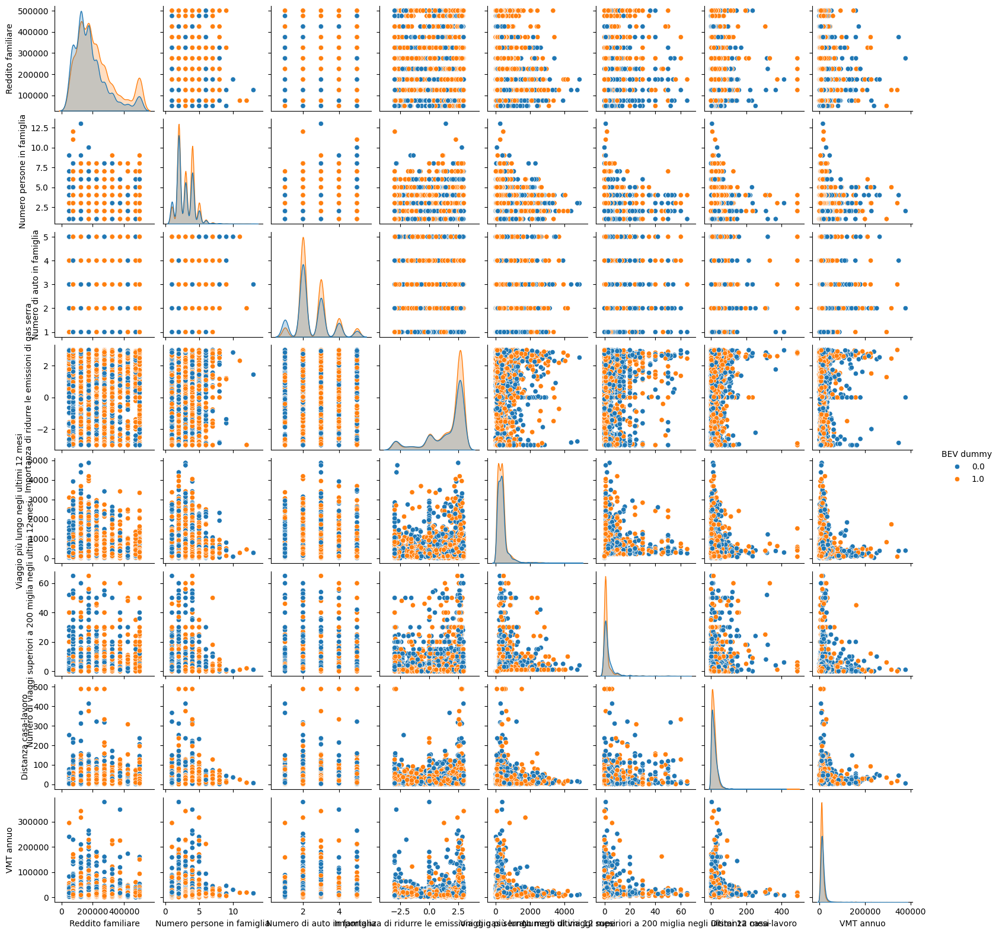

In [ ]:
sns.pairplot(data_originale, hue='BEV dummy', height=2)
plt.show()

In [ ]:
bev_counts = y.value_counts()
labels = bev_counts.index
sizes = bev_counts.values

fig_target = px.pie(
    names=labels,
    values=sizes,
    color=labels,
    color_discrete_map={0: 'lightgreen', 1: 'lightcoral'},
    title='Distribuzione della variabile dipendente (TARGET)',
    template='plotly',hole=0.2)

fig_target.update_traces(textinfo='percent+label') #pull=[0.1, 0]
fig_target.update_layout(title =
                 {'text': "Distribuzione della variabile dipendente (TARGET)",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=600,
                  width=600,
)
fig_target.show()
print(f"\nDistribuzione relativa della variabile BEV dummy: {data_originale ['BEV dummy'].value_counts (normalize=True)}" )


Distribuzione relativa della variabile BEV dummy: BEV dummy
1.0    0.54229
0.0    0.45771
Name: proportion, dtype: float64


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 15 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Reddito familiare                                             10688 non-null  int64  
 3   Classe Reddito Familiare                                      10688 non-null  object 
 4   Livello di istruzione                                         10688 non-null  object 
 5   Casa di proprietà                                             10688 non-null  object 
 6   Casa Indipendente                                             10688 non-null  object 
 7   Numero persone in famiglia                                    10688

In [ ]:
X_quali = ['Genere', "Classe d'età", 'Classe Reddito Familiare', 'Livello di istruzione', 'Casa di proprietà', 'Casa Indipendente','Tipologia di auto precedente'] #7
X_quant = ['Numero persone in famiglia', 'Numero di auto in famiglia','Importanza di ridurre le emissioni di gas serra','Viaggio più lungo negli ultimi 12 mesi',
           'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi','Distanza casa-lavoro', 'VMT annuo'] #8

## 3.2. Plot Qualitativi

In [ ]:
fig_quali1=  px.histogram(data_frame=data_biva, x="Genere", color="BEV dummy")
fig_quali1.update_layout(barmode='group', height=600, width=600)

fig_quali2 = px.histogram(data_frame=data_biva, x="Classe d'età", color="BEV dummy",category_orders={"Classe d'età": order_età})
fig_quali2.update_layout(barmode='group', height=600, width=600)

fig_quali3 = px.histogram(data_frame=data_biva, x="Classe Reddito Familiare", color="BEV dummy",category_orders={"Classe Reddito Familiare": order_red})
fig_quali3.update_layout(barmode='group', height=600, width=600)

fig_quali4 = px.histogram(data_frame=data_biva, x="Livello di istruzione", color="BEV dummy",category_orders={"Livello di istruzione": order_ist})
fig_quali4.update_layout(barmode='group', height=600, width=600)

fig_quali5 = px.histogram(data_frame=data_biva, x="Casa di proprietà", color="BEV dummy")
fig_quali5.update_layout(barmode='group', height=600, width=600)

fig_quali6 = px.histogram(data_frame=data_biva, x="Casa Indipendente", color="BEV dummy")
fig_quali6.update_layout(barmode='group', height=600, width=600)

fig_quali7 = px.histogram(data_frame=data_biva, x="Tipologia di auto precedente", color="BEV dummy")
fig_quali7.update_layout(barmode='group', height=600, width=600)

In [ ]:
fig_quali = make_subplots(rows=2, cols=4, shared_yaxes=False,
                          subplot_titles=X_quali,
                          vertical_spacing=0.2,
                          horizontal_spacing=0.1)

# Variabile per tenere traccia se "BEV dummy = 0" e "BEV dummy = 1" sono già stati aggiunti
added_bev_0 = False
added_bev_1 = False

#Istogramma per ogni variabile
for i, var in enumerate(X_quali):
    row = i // 4 + 1
    col = i % 4 + 1
    for bev_value, color in {0: '#EF553B', 1: '#636EFA'}.items():
        filtered_data = data_biva[data_biva["BEV dummy"] == bev_value]

        if bev_value == 0 and not added_bev_0:         # legenda per "BEV dummy = 0" e una per "BEV dummy = 1"
            show_legend = True
            added_bev_0 = True  # Traccia aggiunta per "BEV dummy = 0"
        elif bev_value == 1 and not added_bev_1:
            show_legend = True
            added_bev_1 = True  # Traccia aggiunta per "BEV dummy = 1"
        else:
            show_legend = False  # Le tracce successive non mostreranno la legenda

        fig_quali.add_trace(
            go.Histogram(
                x=filtered_data[var],
                marker=dict(color=color),
                name=f"BEV = {bev_value}",  # Nome per la legenda
                showlegend=show_legend  # Imposta showlegend solo per la prima traccia di ciascun valore di BEV dummy
            ),row=row, col=col)

fig_quali.update_layout(
    height=800,
    width=1400,
    title_text="Distribuzione delle Variabili Colorate per 'BEV dummy'",
    showlegend=True,
    title_font=dict(size=18),
    margin=dict(t=150),)

for i in range(len(X_quali)):
    fig_quali.layout.annotations[i].update(y=fig_quali.layout.annotations[i].y + 0.02)  # Sposta verso l'alto i titoli

fig_quali.show()

In [ ]:
result_list = []
for var in X_quali:
    categories = data_biva[var].unique()
    for category in categories:
        for bev in [0, 1]:
            count = len(data_biva[(data_biva[var] == category) & (data_biva['BEV dummy'] == bev)])
            result_list.append({
                'Variabile': var,
                'BEV dummy': bev,
                'Categoria': category,
                'Conteggio': count
            })

stats_quali_df = pd.DataFrame(result_list)
stats_quali_df

,Variabile,BEV dummy,Categoria,Conteggio
0,Genere,0,Maschio,3574
1,Genere,1,Maschio,4445
2,Genere,0,Femmina,1318
3,Genere,1,Femmina,1351
4,Classe d'età,0,65-74,934
5,Classe d'età,1,65-74,911
6,Classe d'età,0,55-64,1311
7,Classe d'età,1,55-64,1467
8,Classe d'età,0,75-79,296
9,Classe d'età,1,75-79,350


1.   **Genere**: La distribuzione tra uomini e donne è abbastanza bilanciata, con una leggera prevalenza di maschi che possiedono un BEV.

2.   **Classe d'età**: I gruppi di **età più anziani** (65-74 anni, 75-79 anni, >80 anni) **sembrano avere una minore adesione alla tecnologia BEV**. Le fasce di età centrali (45-64 anni) presentano il numero maggiore di persone che possiedono un BEV. Anche i gruppi più giovani (25-34 anni, <25 anni) mostrano una bassa adozione di BEV.

3. **Classe Reddito Familiare**: Le persone con un **reddito più elevato** (molto alta, alta, estremamente alta) **tendono ad avere più probabilità di possedere un BEV**. Le persone con reddito basso hanno una percentuale inferiore di adozione del BEV.

4. **Livello di istruzione**: Le persone con **un livello di istruzione più alto (Laurea 1L, Laurea 2L o Dottorato) sono più propense a possedere un BEV**, rispetto a chi ha un diploma o licenza media, che mostra una bassa percentuale di possesso di BEV.

5. **Casa di proprietà e Casa Indipendente**: Le persone che possiedono la casa e la casa indipendente sono più propense a possedere un BEV. Le persone che non possiedono la casa o la casa indipendente hanno una minore adozione di BEV.

6. **Tipologia di auto precedente:** Chi possedeva precedentemente un BEV o un'auto ibrida (PHEV, HEV) ha una probabilità maggiore di passare a un altro BEV rispetto a chi possedeva un'auto con motore a combustione interna (ICE) o a GNC. Anche se, la categoria con il maggiore numero di persone che possiedono un BEV è quella che ha avuto un'auto ICE in passato, seguita da coloro che avevano un BEV. **Chi ha avuto un'auto elettrica difficilmente cambierà tecnologia**


## 3.3. Plot Quantitativi

In [ ]:
X_quant_abbr = ["Num. persone famiglia", "Num. auto famiglia", "Imp. riduzione emissioni", "Viaggio più lungo", "N. viaggi > 200 miglia", "Distanza casa-lavoro","VMT annuo"]
colors = {0: "#EF553B", 1: "#636EFA"}

fig_quant_bp = make_subplots(rows=2, cols=4, shared_xaxes=True, vertical_spacing=0.15, horizontal_spacing=0.05, subplot_titles=X_quant_abbr)

for i, var in enumerate(X_quant): # Loop per aggiungere i box plot per ogni variabile di X_quant
    row = i // 4 + 1
    col = i % 4 + 1
    box_0 = go.Box(
        y=data_biva[data_biva['BEV dummy'] == 0][var],
        name='BEV = 0',
        marker_color=colors[0],
        showlegend=(i == 0))
    box_1 = go.Box(
        y=data_biva[data_biva['BEV dummy'] == 1][var],
        name='BEV = 1',
        marker_color=colors[1],
        showlegend=(i == 0))
    fig_quant_bp.add_trace(box_0, row=row, col=col)
    fig_quant_bp.add_trace(box_1, row=row, col=col)

fig_quant_bp.update_layout(title =
                 {'text': "Box Plots: Var. quantitative in relazione a BEV dummy",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,
    #legend=dict( title="BEV dummy", x=1.05, xanchor='left', yanchor='middle', orientation='v',itemsizing='constant'),
    height=800, width=1400,)
fig_quant_bp.show()

In [ ]:
x_limits = {
    'Numero persone in famiglia': (1, 10),
    'Numero di auto in famiglia': (1, 5),
    'Importanza di ridurre le emissioni di gas serra': (-3, 3),
    'Viaggio più lungo negli ultimi 12 mesi': (0, 1000),
    'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi': (0, 10),
    'Distanza casa-lavoro': (0, 50),
    'VMT annuo': (0, 50000)
}

fig_quant = make_subplots(rows=4, cols=2, subplot_titles=X_quant_abbr, shared_xaxes=False, shared_yaxes=False,vertical_spacing=0.1, horizontal_spacing=0.1)

for i, var in enumerate(X_quant):# una riga per ogni variabile in X_quant_abbr
    row = (i // 2) + 1  # Righe (1-based index)
    col = (i % 2) + 1   # Colonne (1-based index)
    # Estrazione dei dati per la variabile e BEV dummy
    x_data = data_biva[var]
    y_data = data_biva["BEV dummy"]
    # Raggruppamento dei dati per valore di BEV dummy
    counts = data_biva.groupby([var, "BEV dummy"]).size().unstack(fill_value=0)

    for bev_value in [0, 1]:     # linee separate per i valori di BEV dummy (0 e 1)
        x_filtered = counts.index  # I valori della variabile X_quant
        y_filtered = counts[bev_value]  # Conteggio per BEV dummy
        fig_quant.add_trace(
            go.Scatter(
                x=x_filtered, y=y_filtered,
                mode='lines+markers',
                line=dict(shape='spline', smoothing=1.0, width=1, color=colors[bev_value]),
                fill='tozeroy',  # Riempi l'area sotto la curva
                fillcolor=f'rgba({int(colors[bev_value][1:3], 16)}, {int(colors[bev_value][3:5], 16)}, {int(colors[bev_value][5:], 16)}, 0.1)',  # Aggiungi trasparenza
                name=f"BEV dummy = {bev_value}",
                showlegend=(row == 1 and col == 1),),row=row, col=col)

    # Impostazione del limite dell'asse x per la variabile corrente
    fig_quant.update_xaxes(
        range=x_limits[var],  # Applica il limite specificato
        row=row, col=col)

fig_quant.update_layout(title =
                 {'text': "Conteggi tra variabili quantitative e BEV dummy",
                  'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    height=1200, width=1400,showlegend=True,)

fig_quant.update_xaxes(title_text="Valore variabile", row=4, col=1)
fig_quant.update_yaxes(title_text="Conteggio", row=4, col=1)
fig_quant.show()

In [ ]:
results = []
for var in X_quant:
    stats = data_biva.groupby('BEV dummy')[var].describe(percentiles=[.25, .5, .75])
    stat_row = stats.loc[:, ['mean', '50%', '25%', '75%']]
    stat_row.columns = ['Media', 'Mediana', 'Primo Quartile', 'Terzo Quartile']
    stat_row['Variabile'] = var
    results.append(stat_row)
stats_quant_df = pd.concat(results)
stats_quant_df = stats_quant_df[['Variabile', 'Media', 'Mediana', 'Primo Quartile', 'Terzo Quartile']]
stats_quant_df

,Variabile,Media,Mediana,Primo Quartile,Terzo Quartile
BEV dummy,,,,,
0.0,Numero persone in famiglia,2.830948,3.000,2.0000,4.0000
1.0,Numero persone in famiglia,3.027088,3.000,2.0000,4.0000
0.0,Numero di auto in famiglia,2.453598,2.000,2.0000,3.0000
1.0,Numero di auto in famiglia,2.573499,2.000,2.0000,3.0000
0.0,Importanza di ridurre le emissioni di gas serra,1.497484,2.440,0.6400,2.7000
1.0,Importanza di ridurre le emissioni di gas serra,1.717024,2.550,1.2400,2.7325
0.0,Viaggio più lungo negli ultimi 12 mesi,381.256964,318.830,179.1075,431.9475
1.0,Viaggio più lungo negli ultimi 12 mesi,372.925619,317.075,170.5600,436.4825
0.0,Numero di viaggi superiori a 200 miglia negli ...,2.986713,1.000,0.0000,3.0000


1.   **Numero di persone in famiglia**: Non ci sono grandi differenze tra i due gruppi. Entrambi hanno una mediana di 3, suggerendo che la maggior parte delle famiglie ha 3 persone, e il numero di persone in famiglia è abbastanza simile tra i possessori e i non possessori di BEV. La differenza nella media è minima, indicando che **il numero di persone nelle famiglie non è un fattore discriminante** rilevante per la possidenza di un BEV.

2.   **Numero di auto in famiglia**: Anche in questo caso, **le differenze tra i due gruppi sono minime**. La media dei possessori di BEV è leggermente più alta, ma la mediana e i quartili sono gli stessi. Entrambi i gruppi hanno una distribuzione simile riguardo al numero di auto in famiglia, con la maggior parte delle famiglie che possiede due auto.

3. **Importanza di ridurre le emissioni di gas serra**: **I possessori di BEV tendono ad attribuire una maggiore importanza alla riduzione delle emissioni** di gas serra, come evidenziato dalla media e dalla mediana più alte rispetto a chi non possiede un BEV. Questo potrebbe riflettere un impegno più forte verso la sostenibilità ambientale tra i possessori di veicoli elettrici. Tuttavia, c'è una notevole variazione nelle risposte (ampio intervallo tra i quartili), suggerendo che non tutti i membri dei due gruppi sono allineati nella stessa misura su questo tema.

4. **Viaggio più lungo negli ultimi 12 mesi**: La differenza nelle medie è minima, con i possessori di BEV che registrano un viaggio medio leggermente più corto. Tuttavia, le mediane sono praticamente identiche, indicando che non ci sono differenze significative tra i gruppi per quanto riguarda la lunghezza dei viaggi annuali. **Entrambi i gruppi sembrano avere una distribuzione simile** in termini di viaggi più lunghi, ma con una certa variabilità nei quartili.

5. **Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi**: I possessori di BEV fanno in media meno viaggi superiori a 200 miglia rispetto ai non possessori, come indicato dalla differenza nelle medie. La mediana per entrambi i gruppi è 1, suggerendo che la maggior parte delle persone fa un solo viaggio lungo all'anno, ma **i possessori di BEV tendono a fare meno viaggi lunghi**. Questo potrebbe riflettere una maggiore concentrazione delle abitudini di viaggio dei possessori di BEV in contesti più locali o meno intensivi in termini di distanza.

6. **Distanza casa-lavoro**: **La distanza media casa-lavoro è leggermente inferiore per i possessori di BEV**, il che potrebbe riflettere una preferenza per vivere in zone con distanze medie più brevi, o una correlazione tra la propensione ad acquistare un BEV e la vicinanza al posto di lavoro. Tuttavia, le differenze non sono particolarmente ampie e la distribuzione dei quartili è simile.

7. **VMT annuo** (Veicolo Miles Travelled): **I possessori di BEV percorrono mediamente meno miglia ogni anno**, come evidenziato dalla differenza nelle medie e nelle mediane. Questo potrebbe essere legato a una maggiore disponibilità di stazioni di ricarica nelle vicinanze e a un uso più limitato del veicolo, con una preferenza per il trasporto pubblico o soluzioni alternative per i viaggi più lunghi.


## 3.4. Save Plots

In [ ]:
"""
fig_quali1.write_image('Distribuzione_Genere_BEV.pdf')
fig_quali2.write_image('Distribuzione_Classe_età_BEV.pdf')
fig_quali3.write_image('Distribuzione_Classe_reddito_familiare_BEV.pdf')
fig_quali4.write_image('Distribuzione_Livello_istruzione_BEV.pdf')
fig_quali5.write_image('Distribuzione_Casa_proprietaria_BEV.pdf')
fig_quali6.write_image('Distribuzione_Casa_indipendente_BEV.pdf')
fig_quali7.write_image('Distribuzione_Tipologia_auto_precedente_BEV.pdf')

fig_quant_bp.write_image('Distribuzione_VarQuant_BEV_bp.pdf')
fig_quant.write_image('Distribuzione_VarQuant_BEV.pdf')
"""

# **4. Ipotesi di Ricerca**

Dalle analisi precedenti,l'adozione dei veicoli BEV è influenzata da una combinazione di fattori socio-economici e comportamentali. I gruppi con un reddito più alto, un livello di istruzione superiore e una maggiore stabilità abitativa sono più propensi a scegliere un BEV, mentre le persone anziane, a basso reddito e con meno educazione sembrano meno inclini ad adottare questa tecnologia. Nonostante ciò, la crescente attenzione verso la sostenibilità ambientale, le politiche di incentivo governative e il miglioramento delle infrastrutture di ricarica potrebbero contribuire a ridurre queste disparità, favorendo una diffusione più ampia dei veicoli elettrici anche tra i gruppi meno favoriti. Il futuro della mobilità elettrica dipenderà quindi non solo dall'evoluzione della tecnologia, ma anche da una continua evoluzione dei fattori economici, sociali e culturali che influenzano le scelte dei consumatori.

**Ipotesi**

H1: Il reddito può influenzare l'acquisto di una vettura elettrica? Appartenere ad una classe sociale superiore può aumentare la probilità di acquistare una vettura BEV?

H2: Come influisce sull'acquisto di veicoli BEV la tipologia di auto posseduta

  + H2.1: Possedere, o aver posseduto in passato, un'veicoli PHEV (Plug-in Hybrid) può incentivare l'acquisto di veicoli BEV (elettrici), poiché sono considerate un primo passo verso l'elettrificazione completa.

  + H2.2: Di conseguenza, come cambia la probabilità di acquisto di una vettura BEV se si è possessori, o si è stati possessori in passato, di una vettura ICE (motore a combustione interna), HEV (ibridi, *considerati solo quelli full hybrid*), e GNC (gas naturale compresso)?

  + H2.3: Chi ha posseduto in passato, o possiede, un veicolo BEV ha una probabilità maggiore di acquistarne un ulteriore veicolo elettrico?

H3: Percorrere molta strada al giorno nel tragitto casa-lavoro o effettuare lunghi viaggi può ridurre la probabilità di acquistare veicoli BEV (elettrici).

H4: Le persone che ritengono importante ridurre le emissioni hanno una probabilità maggionre di acquistare una vettura BEV?

# **5. Analisi Regressione Logistica**
Analisi delle correlazioni e VIF per verificare se c'è la presenza di multicollinearità. Successivamente è stata fatta l'analisi di Regressione Logistica. In fine, sono state analizzate in dettaglio tutte le variabili singificative

## 5.1. Analisi Vif e delle correlazioni

### 5.1.1. Correlation Matrix

In [ ]:
all_columns = data.columns.tolist()
exclude_columns = ['Auto attuale', "Classe d'età", "Reddito familiare",
                   "Classe Reddito Familiare", "Livello di istruzione", "Tipologia di auto precedente",
                   "Tipologia di auto attuale",
                   #"Numero persone in famiglia", "Casa Indipendente"
                   ]

Xind_columns = [col for col in all_columns if col not in exclude_columns and col != 'BEV dummy']

Xind = data[Xind_columns]
y = data['BEV dummy']

In [ ]:
Xind_columns

['Genere',
 "Classe d'età: <25 vs 45-54",
 "Classe d'età: 25-34 vs 45-54",
 "Classe d'età: 35-44 vs 45-54",
 "Classe d'età: 55-64 vs 45-54",
 "Classe d'età: 65-74 vs 45-54",
 "Classe d'età: 75-79 vs 45-54",
 "Classe d'età: >80 vs 45-54",
 'Classe Reddito Familiare: Bassa vs Media',
 'Classe Reddito Familiare: Alta vs Media',
 'Classe Reddito Familiare: Molto alta vs Media',
 'Classe Reddito Familiare: Estremamente alta vs Media',
 'Livello di istruzione: Licenza media vs Laurea 2L o Dottorato',
 'Livello di istruzione: Diploma o Qualifica professionale vs Laurea 2L o Dottorato',
 'Livello di istruzione: Laurea 1L vs Laurea 2L o Dottorato',
 'Casa di proprietà',
 'Casa Indipendente',
 'Numero persone in famiglia',
 'Numero di auto in famiglia',
 'Importanza di ridurre le emissioni di gas serra',
 'Tipologia di auto precedente: BEV vs PHEV',
 'Tipologia di auto precedente: HEV vs PHEV',
 'Tipologia di auto precedente: GNC vs PHEV',
 'Tipologia di auto precedente: ICE vs PHEV',
 'Viaggio 

In [ ]:
print(Xind.var())
#X = Xind.loc[:, Xind.var() > 0]

Genere                                                                               1.873771e-01
Classe d'età: <25 vs 45-54                                                           1.681453e-03
Classe d'età: 25-34 vs 45-54                                                         3.272566e-02
Classe d'età: 35-44 vs 45-54                                                         1.554905e-01
Classe d'età: 55-64 vs 45-54                                                         1.923785e-01
Classe d'età: 65-74 vs 45-54                                                         1.428380e-01
Classe d'età: 75-79 vs 45-54                                                         5.679374e-02
Classe d'età: >80 vs 45-54                                                           6.876359e-03
Classe Reddito Familiare: Bassa vs Media                                             2.604538e-02
Classe Reddito Familiare: Alta vs Media                                              2.271888e-01
Classe Reddito Famil

In [ ]:
correlation_matrix = Xind.corr()
original_columns = list(correlation_matrix.columns)

abbreviated_columns = [
    'Genere', '<25 vs 45-54','25-34 vs 45-54', '35-44 vs 45-54', '55-64 vs 45-54', '65-74 vs 45-54', '75-79 vs 45-54', '>80 vs 45-54', 'C.Red. Bassa vs Media', 'C.Red Alta vs Media',
    'C.Red Molto alta vs Media', 'C.Red Estrem.alta vs Media', 'Media vs Laurea 2L', 'Diploma vs Laurea 2L', 'Laurea 1L vs Laurea 2L', 'Casa prop.', 'Casa Indip.',
    'N. persone in fam.', 'N. auto in fam.', 'Sensibilità Ambiente','prec: BEV vs PHEV', 'prec: HEV vs PHEV','prec: GNC vs PHEV', 'prec: ICE vs PHEV',
    'Viaggio più lungo', 'N. viaggi lunghi', 'Distanza Casa-Lav.', 'VMT',
]

fig_cm = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=abbreviated_columns,
    y=abbreviated_columns,
    annotation_text=np.around(correlation_matrix.values, decimals=2),
    showscale=True
)

fig_cm.update_layout(
    title={
        'text': "Correlation Matrix",
        'x': 0.5,
        'xanchor': 'center',  # Ancoraggio al centro
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'},
        #'pad': {'t': 20}
    },margin=dict(t=210, b=0, l=0, r=0),height=700,width=1200,)
fig_cm.show()

In [ ]:
#fig_cm.write_image("Matrice_di_correlazione_dummy.png",scale=5)

### 5.1.2. Analisi VIF

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = Xind.columns
vif_data["VIF"] = [variance_inflation_factor(Xind.values, i) for i in range(len(Xind.columns))]
print(vif_data)

                                              feature        VIF
0                                              Genere   3.925695
1                          Classe d'età: <25 vs 45-54   1.009588
2                        Classe d'età: 25-34 vs 45-54   1.156792
3                        Classe d'età: 35-44 vs 45-54   1.611612
4                        Classe d'età: 55-64 vs 45-54   2.029460
5                        Classe d'età: 65-74 vs 45-54   1.863970
6                        Classe d'età: 75-79 vs 45-54   1.342770
7                          Classe d'età: >80 vs 45-54   1.044981
8            Classe Reddito Familiare: Bassa vs Media   1.090411
9             Classe Reddito Familiare: Alta vs Media   2.023761
10      Classe Reddito Familiare: Molto alta vs Media   1.558618
11  Classe Reddito Familiare: Estremamente alta vs...   1.351787
12  Livello di istruzione: Licenza media vs Laurea...   1.010982
13  Livello di istruzione: Diploma o Qualifica pro...   1.308264
14  Livello di istruzione

In [ ]:
logit_model = sm.Logit(y, Xind)
result = logit_model.fit()
ll_null = logit_model.loglikeobs(np.zeros(logit_model.exog.shape[1])).sum()
ll_model = result.llf
mcfadden_rsquared = 1 - (ll_model / ll_null)
print(f"McFadden's R-squared: {mcfadden_rsquared}")

Optimization terminated successfully.
         Current function value: 0.646968
         Iterations 6
McFadden's R-squared: 0.06662273313683875


In [ ]:
Xind_ridotto = Xind.drop(["Numero persone in famiglia", "Casa di proprietà"], axis=1)

vif_data_ridotto = pd.DataFrame()
vif_data_ridotto["feature"] = Xind_ridotto.columns
vif_data_ridotto["VIF"] = [variance_inflation_factor(Xind_ridotto.values, i) for i in range(len(Xind_ridotto.columns))]
print(vif_data_ridotto)

                                              feature       VIF
0                                              Genere  3.754084
1                          Classe d'età: <25 vs 45-54  1.009395
2                        Classe d'età: 25-34 vs 45-54  1.147533
3                        Classe d'età: 35-44 vs 45-54  1.610920
4                        Classe d'età: 55-64 vs 45-54  1.951534
5                        Classe d'età: 65-74 vs 45-54  1.639546
6                        Classe d'età: 75-79 vs 45-54  1.235080
7                          Classe d'età: >80 vs 45-54  1.034150
8            Classe Reddito Familiare: Bassa vs Media  1.089340
9             Classe Reddito Familiare: Alta vs Media  1.984846
10      Classe Reddito Familiare: Molto alta vs Media  1.534704
11  Classe Reddito Familiare: Estremamente alta vs...  1.336281
12  Livello di istruzione: Licenza media vs Laurea...  1.010092
13  Livello di istruzione: Diploma o Qualifica pro...  1.308250
14  Livello di istruzione: Laurea 1L vs 

In [ ]:
def sono_simili(val1, val2, tolleranza=0.0001):
    return abs(val1 - val2) < tolleranza

# Modello completo
logit_model_vif = sm.Logit(y, Xind)
result_vif = logit_model_vif.fit()
ll_null_vif = logit_model_vif.loglikeobs(np.zeros(logit_model_vif.exog.shape[1])).sum()
ll_model_vif = result_vif.llf
mcfadden_rsquared_vif = 1 - (ll_model_vif / ll_null_vif)
print(f"R2 di McFadden per modello completo: {mcfadden_rsquared_vif:.4f}")

# Modello ridotto
logit_model_vif2 = sm.Logit(y, Xind_ridotto)
result_vif2 = logit_model_vif2.fit()
ll_null_vif2 = logit_model_vif2.loglikeobs(np.zeros(logit_model_vif2.exog.shape[1])).sum()
ll_model_vif2 = result_vif2.llf
mcfadden_rsquared_vif2 = 1 - (ll_model_vif2 / ll_null_vif2)
print(f"\nR2 di McFadden per modello ridotto: {mcfadden_rsquared_vif2:.4f}")
print("\n===============================================================")
# Confronto
if sono_simili(mcfadden_rsquared_vif, mcfadden_rsquared_vif2):
    print("|    Entrambi i modelli hanno un R2 simile (entro 4 decimali).")
    print("|    Si può procedere con il modello ridotto.")
elif mcfadden_rsquared_vif > mcfadden_rsquared_vif2:
    print("Il modello completo ha un R2 maggiore di quello ridotto.")
else:
    print("Il modello ridotto ha un R2 maggiore di quello completo.")
print("===============================================================")

Optimization terminated successfully.
         Current function value: 0.646968
         Iterations 6
R2 di McFadden per modello completo: 0.0666
Optimization terminated successfully.
         Current function value: 0.647005
         Iterations 6

R2 di McFadden per modello ridotto: 0.0666

|    Entrambi i modelli hanno un R2 simile (entro 4 decimali).
|    Si può procedere con il modello ridotto.


## 5.2. Regressione Logistica

In [ ]:
X = Xind_ridotto
X = sm.add_constant(X)
logit_model = sm.Logit(y, X)
result = logit_model.fit()
print(result.summary())

intercept = result.params['const']
#coefficients = result.params[X]
print("\nIntercept:", intercept)
"""
print("\nCoefficients:")
for variable, coefficient in coefficients.items():
  print(f"{variable}: {coefficient}")
"""

Optimization terminated successfully.
         Current function value: 0.645349
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              BEV dummy   No. Observations:                10688
Model:                          Logit   Df Residuals:                    10661
Method:                           MLE   Df Model:                           26
Date:                Sat, 18 Jan 2025   Pseudo R-squ.:                 0.06412
Time:                        12:46:46   Log-Likelihood:                -6897.5
converged:                       True   LL-Null:                       -7370.1
Covariance Type:            nonrobust   LLR p-value:                1.513e-182
                                                                                        coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------

'\nprint("\nCoefficients:")\nfor variable, coefficient in coefficients.items():\n  print(f"{variable}: {coefficient}")\n'

In [ ]:
coefficienti_b = round(result.params,3)
p_value = round(result.pvalues,3)
standard_errors =round(result.bse,3)

tabella_diz = {
    'Odds Ratio': np.exp(coefficienti_b),
    #'Odds Ratio': np.exp(-0.7443 + coefficienti_b2)/(1+(np.exp(-0.7443 + coefficienti_b2))),
    'Coefficienti': coefficienti_b,
    'P-value': p_value,
    'Standard Error': standard_errors
}
tabella_riass = pd.DataFrame(tabella_diz)
tabella_riass.index = result.params.index
tabella_sign = tabella_riass[tabella_riass['P-value'] < 0.05]

In [ ]:
tabella_sign['indice'] = range(len(tabella_sign))
tabella_sign

,Odds Ratio,Coefficienti,P-value,Standard Error,indice
const,0.497082,-0.699,0.000,0.118,0
Genere,1.244831,0.219,0.000,0.048,1
Classe d'età: 55-64 vs 45-54,0.800915,-0.222,0.000,0.057,2
Classe d'età: 65-74 vs 45-54,0.718205,-0.331,0.000,0.064,3
Classe d'età: >80 vs 45-54,0.514274,-0.665,0.009,0.253,4
Classe Reddito Familiare: Bassa vs Media,0.706805,-0.347,0.008,0.131,5
Classe Reddito Familiare: Alta vs Media,1.223848,0.202,0.000,0.049,6
Classe Reddito Familiare: Molto alta vs Media,1.617691,0.481,0.000,0.062,7
Classe Reddito Familiare: Estremamente alta vs Media,2.125485,0.754,0.000,0.081,8
Livello di istruzione: Diploma o Qualifica professionale vs Laurea 2L o Dottorato,0.692810,-0.367,0.000,0.066,9


## 5.3. Validazione Ipotesi: analisi delle variabili

### 5.3.1. Tipologia di veicoli

In [ ]:
#tipologia
tipologia = data['Tipologia di auto attuale'].value_counts()
print("Numero di veicoli ecologici, Elettrici, Ibridi Plug-in, a Idrogeno e Full Hybrid:", tipologia)
print()

#solo auto green: elettriche
auto_green = data['BEV dummy'].value_counts()
print("Numero di veicoli BEV è di:", round(data["BEV dummy"].mean()*100,2), "%", auto_green)

Numero di veicoli ecologici, Elettrici, Ibridi Plug-in, a Idrogeno e Full Hybrid: Tipologia di auto attuale
BEV     5796
PHEV    4568
FCEV     287
HEV       37
Name: count, dtype: int64

Numero di veicoli BEV è di: 54.23 % BEV dummy
1    5796
0    4892
Name: count, dtype: int64


### 5.3.2. **H1 - Reddito**

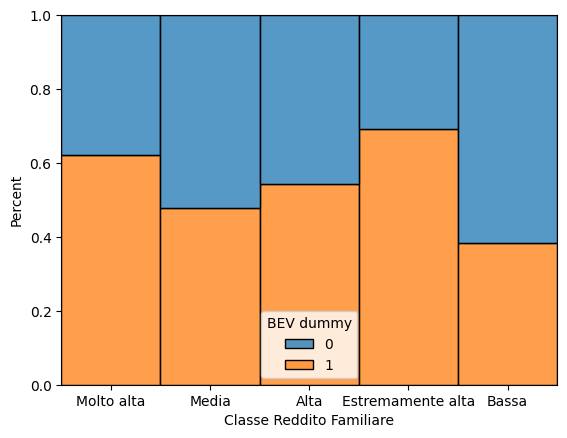


Classe Reddito Familiare
Alta                 54.44
Bassa                38.46
Estremamente alta    69.20
Media                47.71
Molto alta           62.18
Name: BEV dummy, dtype: float64


In [ ]:
sns.histplot(data=data, x="Classe Reddito Familiare", hue= "BEV dummy", stat="percent", multiple="fill")
plt.show()
print()
print(round(data.groupby(data['Classe Reddito Familiare'])["BEV dummy"].mean()*100,2))

In [ ]:
odds_reddito_bm= round(tabella_sign.loc[tabella_sign.index[5], 'Odds Ratio'],5)
odds_reddito_am= round(tabella_sign.loc[tabella_sign.index[6], 'Odds Ratio'],5)
odds_reddito_mam= round(tabella_sign.loc[tabella_sign.index[7], 'Odds Ratio'],5)
odds_reddito_eam= round(tabella_sign.loc[tabella_sign.index[8], 'Odds Ratio'],5)

print("La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Bassa rispetto ad una persona di classe Media ", odds_reddito_bm)
print("Per una persona di classe Reddito Familiare Bassa la probabilità rispetto ad una di classe media di acquistare un veicolo BEV è:",
      round(odds_reddito_bm-1,5), ",ovvero la probabilità diminuisce del",round(1-odds_reddito_bm,4)*100, "%")
print()
print("La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Alta rispetto ad una persona di classe Media ", odds_reddito_am)
print("Per una persona di classe Reddito Familiare Alta la probabilità rispetto ad una di classe media di acquistare un veicolo BEV è:",
      round(odds_reddito_am-1,5), ",ovvero la probabilità diminuisce del",round(1-odds_reddito_am,4)*100, "%")
print()
print("La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Molto Alta rispetto ad una persona di classe Media ", odds_reddito_mam)
print("Per una persona di classe Reddito Familiare Molto Alta la probabilità rispetto ad una di classe Media di acquistare un veicolo BEV è:",
      round(odds_reddito_mam-1,5), ",ovvero la probabilità diminuisce del",round(1-odds_reddito_mam,4)*100, "%")
print()
print("La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Estremamente alta rispetto ad una persona di classe Media ", odds_reddito_eam)
print("Per una persona di classe Reddito Familiare Estremamente alta la probabilità rispetto ad una di classe Media di acquistare un veicolo BEV è:",
      round(odds_reddito_eam-1,5), ",ovvero la probabilità aumenta del",round(odds_reddito_eam-1,4)*100, "%")

La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Bassa rispetto ad una persona di classe Media  0.70681
Per una persona di classe Reddito Familiare Bassa la probabilità rispetto ad una di classe media di acquistare un veicolo BEV è: -0.29319 ,ovvero la probabilità diminuisce del 29.32 %

La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Alta rispetto ad una persona di classe Media  1.22385
Per una persona di classe Reddito Familiare Alta la probabilità rispetto ad una di classe media di acquistare un veicolo BEV è: 0.22385 ,ovvero la probabilità diminuisce del -22.39 %

La probabilità di aquistare una vettura BEV per una persona di classe Reddito Familiare Molto Alta rispetto ad una persona di classe Media  1.61769
Per una persona di classe Reddito Familiare Molto Alta la probabilità rispetto ad una di classe Media di acquistare un veicolo BEV è: 0.61769 ,ovvero la probabilità diminuisce del -61.77 %

La proba

### 5.3.3. **H2 - Auto posseduta precedentemente**

In [ ]:
odds_prec_BEV= round(tabella_sign.loc[tabella_sign.index[14], 'Odds Ratio'],3)

odds_prec_ICE= round(tabella_sign.loc[tabella_sign.index[15], 'Odds Ratio'],3)

print("La probabilità di aquistare una vettura BEV, rispetto alle altre vetture green, per una persona che precedentemente ha avuto un vettura BEV", odds_prec_BEV)
print(" ", round(odds_prec_BEV-1,3), ",ovvero la probabilità aumenta del",round(odds_prec_BEV-1,4)*100, "%")

print("La probabilità di aquistare una vettura BEV, rispetto alle altre vetture green, per una persona che precedentemente ha avuto un vettura ICE", odds_prec_ICE)
print(" ", round(odds_prec_ICE-1,3), ",ovvero la probabilità aumenta del",round(odds_prec_ICE-1,4)*100, "%")


La probabilità di aquistare una vettura BEV, rispetto alle altre vetture green, per una persona che precedentemente ha avuto un vettura BEV 3.48
  2.48 ,ovvero la probabilità aumenta del 248.0 %
La probabilità di aquistare una vettura BEV, rispetto alle altre vetture green, per una persona che precedentemente ha avuto un vettura ICE 1.505
  0.505 ,ovvero la probabilità aumenta del 50.5 %


### 5.3.4. **H3 - Influenza delle lunghe distanze percorse sull’acquisto di veicoli BEV**


#### 5.3.4.1. Distanza casa lavoro

In [ ]:
odds_prec_casalav= round(tabella_sign.loc[tabella_sign.index[17], 'Odds Ratio'],3)

print("La probabilità di aquistare una vettura BEV, in base alla distanza casa-lavoro", odds_prec_casalav)
print(" ", round(odds_prec_casalav-1,3), ",ovvero la probabilità diminuisce del",round(1-odds_prec_casalav,4)*100, "%, ogni miglio percorso in più")
print()
mean_distance_bev_1 = data[data['BEV dummy'] == 1]['Distanza casa-lavoro'].mean()
mean_distance_bev_0 = data[data['BEV dummy'] == 0]['Distanza casa-lavoro'].mean()

print(f"Media della Distanza casa-lavoro per BEV dummy = Si: {mean_distance_bev_1}","miglia")
print(f"Media della Distanza casa-lavoro per BEV dummy = No: {mean_distance_bev_0}","miglia")

print()
print("ogni 2,5 miglia aggiuntive probabilità scende di:" ,round((1-odds_prec_casalav)*2.5,3), ", ovvero scende del:", round(1-odds_prec_casalav,4)*2.5*100, "%")
print("ogni 5 miglia aggiuntive probabilità scende di:" ,round((1-odds_prec_casalav)*5,3), ", ovvero scende del:", round(1-odds_prec_casalav,4)*5*100, "%")
print("ogni 10 miglia aggiuntive probabilità scende di:" ,round((1-odds_prec_casalav)*10,3), ", ovvero scende del:", round(1-odds_prec_casalav,4)*10*100, "%")



La probabilità di aquistare una vettura BEV, in base alla distanza casa-lavoro 0.998
  -0.002 ,ovvero la probabilità diminuisce del 0.2 %, ogni miglio percorso in più

Media della Distanza casa-lavoro per BEV dummy = Si: 17.90839199447895 miglia
Media della Distanza casa-lavoro per BEV dummy = No: 19.804969337694196 miglia

ogni 2,5 miglia aggiuntive probabilità scende di: 0.005 , ovvero scende del: 0.5 %
ogni 5 miglia aggiuntive probabilità scende di: 0.01 , ovvero scende del: 1.0 %
ogni 10 miglia aggiuntive probabilità scende di: 0.02 , ovvero scende del: 2.0 %


#### 5.3.4.2. N. Viaggi >200 miglia all'anno

In [ ]:
odds_prec_nviaggi= round(tabella_sign.loc[tabella_sign.index[16], 'Odds Ratio'],3)
print("La probabilità di aquistare una vettura BEV in base al numero di viaggi superiore a 200 miglia", odds_prec_nviaggi)
print(" ", round(odds_prec_nviaggi-1,3), ",ovvero la probabilità diminuisce del",round(1-odds_prec_nviaggi,4)*100, "%")
print()
print()
print("Come diminuisce la probabilità in base al n. dei viaggi rispetto a che non li effettua:")
print()
print("per chi effettua 1 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*1,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*1*100,4), "%")
print("per chi effettua 2 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*2,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*2*100,4), "%")
print("per chi effettua 3 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*3,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*3*100,4), "%")
print("per chi effettua 4 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*4,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*4*100,4), "%")
print("per chi effettua 5 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*5,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*5*100,4), "%")
print("per chi effettua 6 viaggio di 200 miglia all'anno la probabilità scende di:" ,round((1-odds_prec_nviaggi)*6,3), ", ovvero scende del:", round((1-odds_prec_nviaggi)*6*100,4), "%")

La probabilità di aquistare una vettura BEV in base al numero di viaggi superiore a 200 miglia 0.966
  -0.034 ,ovvero la probabilità diminuisce del 3.4000000000000004 %


Come diminuisce la probabilità in base al n. dei viaggi rispetto a che non li effettua:

per chi effettua 1 viaggio di 200 miglia all'anno la probabilità scende di: 0.034 , ovvero scende del: 3.4 %
per chi effettua 2 viaggio di 200 miglia all'anno la probabilità scende di: 0.068 , ovvero scende del: 6.8 %
per chi effettua 3 viaggio di 200 miglia all'anno la probabilità scende di: 0.102 , ovvero scende del: 10.2 %
per chi effettua 4 viaggio di 200 miglia all'anno la probabilità scende di: 0.136 , ovvero scende del: 13.6 %
per chi effettua 5 viaggio di 200 miglia all'anno la probabilità scende di: 0.17 , ovvero scende del: 17.0 %
per chi effettua 6 viaggio di 200 miglia all'anno la probabilità scende di: 0.204 , ovvero scende del: 20.4 %


#### 5.3.4.3. VMT

In [ ]:
odds_VMT = round(tabella_sign.loc[tabella_sign.index[18], 'Odds Ratio'],3)
print(odds_VMT)
print()
VMT_calcolato = (-(1 - odds_VMT)*100) * data['VMT annuo']


1.0



In [ ]:
print("ogni 5000 miglia percorse in più annualmente la probabilità scende di:" ,round((1-odds_VMT)*5000,3), ", ovvero scende del:", round((1-odds_VMT)*5000*100,2), "%")
print("ogni 10000 miglia percorse in più annualmente la probabilità scende di:" ,round((1-odds_VMT)*10000,3), ", ovvero scende del:", round((1-odds_VMT)*10000*100,2), "%")
print("ogni 15000 miglia percorse in più annualmente la probabilità scende di:" ,round((1-odds_VMT)*15000,3), ", ovvero scende del:", round((1-odds_VMT)*15000*100,2), "%")

ogni 5000 miglia percorse in più annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %
ogni 10000 miglia percorse in più annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %
ogni 15000 miglia percorse in più annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %


In [ ]:
print("ogni 14000 miglia percorsi annualmente la probabilità scende di:" ,round((1-odds_VMT)*14000,3), ", ovvero scende del:", round((1-odds_VMT)*14000*100,2), "%")
print("ogni 15000 miglia percorsi annualmente la probabilità scende di:" ,round((1-odds_VMT)*15000,3), ", ovvero scende del:", round((1-odds_VMT)*15000*100,2), "%")

print("ogni 17000 miglia percorsi annualmente la probabilità scende di:" ,round((1-odds_VMT)*17000,3), ", ovvero scende del:", round((1-odds_VMT)*17000*100,2), "%")

ogni 14000 miglia percorsi annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %
ogni 15000 miglia percorsi annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %
ogni 17000 miglia percorsi annualmente la probabilità scende di: 0.0 , ovvero scende del: 0.0 %


In [ ]:
vmt_annuo_mean_by_bev = data.groupby('BEV dummy')['VMT annuo'].mean()
print(vmt_annuo_mean_by_bev)
vmt_annuo_mean_bev = vmt_annuo_mean_by_bev.get(1, None)
if vmt_annuo_mean_bev is not None:
  print("Mean VMT annuo for BEV owners:", vmt_annuo_mean_bev)
else:
  print("No BEV owners found in the data.")

BEV dummy
0    16050.914146
1    12784.542961
Name: VMT annuo, dtype: float64
Mean VMT annuo for BEV owners: 12784.542960662526


#### 5.3.4.4. Correlation Matrix delle variabili di mobilità e percorrenza

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 36 columns):
 #   Column                                                                             Non-Null Count  Dtype  
---  ------                                                                             --------------  -----  
 0   Genere                                                                             10688 non-null  int64  
 1   Classe d'età                                                                       10688 non-null  object 
 2   Classe d'età: <25 vs 45-54                                                         10688 non-null  int64  
 3   Classe d'età: 25-34 vs 45-54                                                       10688 non-null  int64  
 4   Classe d'età: 35-44 vs 45-54                                                       10688 non-null  int64  
 5   Classe d'età: 55-64 vs 45-54                                                       10688 non-null  int

In [ ]:
data_mob= data[['VMT annuo', 'Distanza casa-lavoro', 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi', 'Viaggio più lungo negli ultimi 12 mesi']]
correlation_matrix = data_mob.corr()
original_columns = list(correlation_matrix.columns)

abbreviated_columns = ['VMT', 'Distanza Casa-Lav.','N. viaggi lunghi','Viaggio più lungo' ]

fig_cm_mob1 = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=abbreviated_columns,
    y=abbreviated_columns,
    annotation_text=np.around(correlation_matrix.values, decimals=2),
    showscale=True)

fig_cm_mob1.update_layout(
    title={
        'text': "Correlation Matrix: var mobilità e percorrenza",'x': 0.5,'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'},},
    margin=dict(t=100, b=0, l=0, r=0),height=700,width=1200,)
fig_cm_mob1.show()

In [ ]:
data_mob= data[['VMT annuo', 'Distanza casa-lavoro', 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi']]
correlation_matrix = data_mob.corr()
original_columns = list(correlation_matrix.columns)

abbreviated_columns = ['VMT', 'Distanza Casa-Lav.','N. viaggi lunghi']

fig_cm_mob2 = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=abbreviated_columns,
    y=abbreviated_columns,
    annotation_text=np.around(correlation_matrix.values, decimals=2),
    showscale=True)

fig_cm_mob2.update_layout(
    title={
        'text': "Correlation Matrix: var mobilità e percorrenza",'x': 0.5,'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'},},
    margin=dict(t=100, b=0, l=0, r=0),height=700,width=1200,)
fig_cm_mob2.show()

In [ ]:
#fig_cm_mob1.write_image('Matrice_di_correlazione_mobilità_percorrenza_BEV.png', scale=5)
#fig_cm_mob2.write_image('Matrice_di_correlazione_mobilità_percorrenza_BEV2.png', scale=5)

### 5.3.5. **H4 - Importanza della Riduzione delle Emissioni**

In [ ]:
print("punteggi medii dei possessori di auto green:",round(data.groupby('BEV dummy')["Importanza di ridurre le emissioni di gas serra"].mean(),2))
print()

punteggi medii dei possessori di auto green: BEV dummy
0    1.50
1    1.72
Name: Importanza di ridurre le emissioni di gas serra, dtype: float64



La sostenibile media di gas serra è di: 1.62 , il sostenibile mediano è di: 3.0



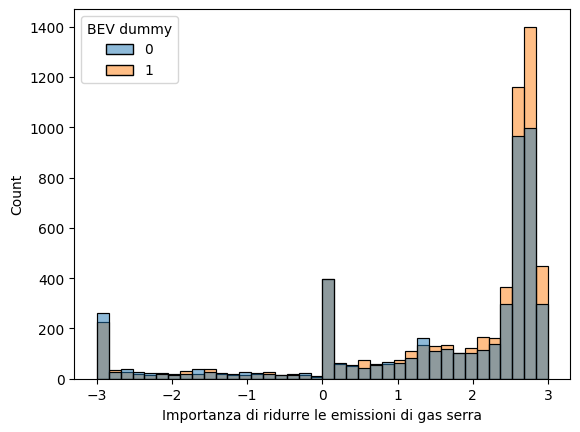

In [ ]:
sostenibile_mediano =round(data['Importanza di ridurre le emissioni di gas serra'].median(),0)
sostenibile_medio = round(data['Importanza di ridurre le emissioni di gas serra'].mean(),2)

print("La sostenibile media di gas serra è di:", sostenibile_medio, ", il sostenibile mediano è di:", sostenibile_mediano)
print()
sns.histplot(data=data, x="Importanza di ridurre le emissioni di gas serra", hue= "BEV dummy")
plt.show()

In [ ]:
preocc_elev = round(data[(data["Importanza di ridurre le emissioni di gas serra"]>2)]["BEV dummy"].mean()*100,2)
preocc_medio_alta = round(data[(data["Importanza di ridurre le emissioni di gas serra"]>0.5) & (data["Importanza di ridurre le emissioni di gas serra"]<=2)]["BEV dummy"].mean()*100,2)
preocc_media = round(data[(data["Importanza di ridurre le emissioni di gas serra"]>-0.5) & (data["Importanza di ridurre le emissioni di gas serra"]<=0.5)]["BEV dummy"].mean()*100,2)
preocc_medio_bassa = round(data[(data["Importanza di ridurre le emissioni di gas serra"]>-2) & (data["Importanza di ridurre le emissioni di gas serra"]<=-0.5)]["BEV dummy"].mean()*100,2)
preocc_bassa = round(data[(data["Importanza di ridurre le emissioni di gas serra"]<=-2)]["BEV dummy"].mean()*100,2)

print("Percentuale di chi possiede una vettura BEV e ha una preoccupazione elevata verso l'ambiente", preocc_elev)
print("Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio alta verso l'ambiente",preocc_medio_alta)
print("Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio bassa verso l'ambiente", preocc_media)
print("Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio bassa verso l'ambiente",preocc_medio_bassa)
print("Percentuale di chi possiede una vettura BEV e non nessuna ha una preoccupazione verso l'ambiente", preocc_bassa)


Percentuale di chi possiede una vettura BEV e ha una preoccupazione elevata verso l'ambiente 56.72
Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio alta verso l'ambiente 52.54
Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio bassa verso l'ambiente 48.98
Percentuale di chi possiede una vettura BEV e ha una preoccupazione medio bassa verso l'ambiente 49.88
Percentuale di chi possiede una vettura BEV e non nessuna ha una preoccupazione verso l'ambiente 46.8


In [ ]:
odds_amb = odds_prec_nviaggi= round(tabella_sign.loc[tabella_sign.index[13], 'Odds Ratio'],4)
print(odds_amb)
print()
print("La probabilità per chi ha una preoccupazione elevata verso l'ambiente, la probabilità varia da:" ,round((odds_amb-1)*2*100,2), "%, a", round((odds_amb-1)*3*100,2), "%")
print("La probabilità per chi ha una preoccupazione medio alta verso l'ambiente, la probabilità varia da:" ,round((odds_amb-1)*0.5*100,2), "%, a", round((odds_amb-1)*2*100,2), "%")
print("La probabilità per chi ha una preoccupazione media verso l'ambiente, la probabilità varia da:" ,round((odds_amb-1)*-0.5*100,2), "%, a", round((odds_amb-1)*0.5*100,2), "%")
print("La probabilità per chi ha una preoccupazione medio bassa verso l'ambiente, la probabilità varia da:" ,round((odds_amb-1)*-2*100,2), "%, a", round((odds_amb-1)*-0.5*100,2), "%")
print("La probabilità per chi non ha alcuna una preoccupazione verso l'ambiente, la probabilità varia da:" ,round((odds_amb-1)*-3*100,2), "%, a", round((odds_amb-1)*-2*100,2), "%")



1.1052

La probabilità per chi ha una preoccupazione elevata verso l'ambiente, la probabilità varia da: 21.04 %, a 31.56 %
La probabilità per chi ha una preoccupazione medio alta verso l'ambiente, la probabilità varia da: 5.26 %, a 21.04 %
La probabilità per chi ha una preoccupazione media verso l'ambiente, la probabilità varia da: -5.26 %, a 5.26 %
La probabilità per chi ha una preoccupazione medio bassa verso l'ambiente, la probabilità varia da: -21.04 %, a -5.26 %
La probabilità per chi non ha alcuna una preoccupazione verso l'ambiente, la probabilità varia da: -31.56 %, a -21.04 %


## 5.4. Analisi delle restanti variabili

### 5.4.1. Genere

In [ ]:
print("La percetuale in base al Genere di chi ha un'auto green: ") #il 55,46 delle persone di sesso femminile possiede un'auto elettrica contro il 50,6 di quello maschile
print()
print(round(data.groupby("Genere")['BEV dummy'].mean()*100,2))
print()
print()
odds_gen= round(tabella_sign.loc[tabella_sign.index[1], 'Odds Ratio'],5)
print("Odds Ratio di Genere: Maschio vs Femmina",odds_gen)
print()
print("La probabilità per una persona di sesso maschile rispetto ad una di sesso femminile di avere un'auto elettrica, aumenta di:" ,
      round((odds_gen-1),3), ", quindi aumenta del", round((odds_gen-1)*100,2), "%")

La percetuale in base al Genere di chi ha un'auto green: 

Genere
0    50.62
1    55.43
Name: BEV dummy, dtype: float64


Odds Ratio di Genere: Maschio vs Femmina 1.24483

La probabilità per una persona di sesso maschile rispetto ad una di sesso femminile di avere un'auto elettrica, aumenta di: 0.245 , quindi aumenta del 24.48 %


### 5.4.2. Età

In [ ]:
odds_eta1 = round(tabella_sign.loc[tabella_sign.index[2], 'Odds Ratio'],5)
odds_eta2 = round(tabella_sign.loc[tabella_sign.index[3], 'Odds Ratio'],5)
odds_eta3 = round(tabella_sign.loc[tabella_sign.index[4], 'Odds Ratio'],5)
print(odds_eta1, odds_eta2, odds_eta3)
print()
print("La probabilità per chi è classe d'età: 55-64 vs 45-54 di possedere un'auto elettrica, scende di:" ,round((1-odds_eta2),3), ", \nquindi diminusice del", round((1-odds_eta2)*100,2), "%")
print("\nLa probabilità per chi è classe d'età: 65-74 vs 45-54 di possedere un'auto elettrica, scende di:" ,round((1-odds_eta3),3), ", \nquindi diminusice del", round((1-odds_eta3)*100,2), "%")
print("\nLa probabilità per chi è classe d'età: >80 vs 45-54 di possedere un'auto elettrica, scende di:" ,round((1-odds_eta4),3), ", \nquindi diminusice del", round((1-odds_eta4)*100,2), "%")

0.80092 0.71821 0.51427

La probabilità per chi è classe d'età: 55-64 vs 45-54 di possedere un'auto elettrica, scende di: 0.282 , 
quindi diminusice del 28.18 %

La probabilità per chi è classe d'età: 65-74 vs 45-54 di possedere un'auto elettrica, scende di: 0.486 , 
quindi diminusice del 48.57 %

La probabilità per chi è classe d'età: >80 vs 45-54 di possedere un'auto elettrica, scende di: 0.486 , 
quindi diminusice del 48.57 %


### 5.4.3. Reddito

In [ ]:
odds_red1 = round(tabella_sign.loc[tabella_sign.index[5], 'Odds Ratio'],5)
odds_red2 = round(tabella_sign.loc[tabella_sign.index[6], 'Odds Ratio'],5)
odds_red3 = round(tabella_sign.loc[tabella_sign.index[7], 'Odds Ratio'],5)
odds_red4 = round(tabella_sign.loc[tabella_sign.index[8], 'Odds Ratio'],5)
print(odds_red1, odds_red2, odds_red3, odds_red4)
print()
print("La probabilità per chi è classe di reddito bassa rispetto ad una media di possedere un'auto elettrica, scende di:" ,round((1-odds_red1),3),
      ", \nquindi diminusice del", round((1-odds_red1)*100,2), "%")
print("\nLa probabilità per chi è classe di reddito alta rispetto ad una media di possedere un'auto elettrica, sale di:" ,round((odds_red2-1),3),
      ", \nquindi aumenta del", round((odds_red2-1)*100,2), "%")
print("\nLa probabilità per chi è classe di reddito molto alta rispetto ad una media di possedere un'auto elettrica, sale di:" ,round((odds_red3-1),3),
      ", \nquindi aumenta del", round((odds_red3-1)*100,2), "%")
print("\nLa probabilità per chi è classe di reddito estremamente alta rispetto ad una media di possedere un'auto elettrica, sale di:" ,round((odds_red4-1),3),
      ", \nquindi aumenta del", round((odds_red4-1)*100,2), "%")

0.70681 1.22385 1.61769 2.12548

La probabilità per chi è classe di reddito bassa rispetto ad una media di possedere un'auto elettrica, scende di: 0.293 , 
quindi diminusice del 29.32 %

La probabilità per chi è classe di reddito alta rispetto ad una media di possedere un'auto elettrica, sale di: 0.224 , 
quindi aumenta del 22.39 %

La probabilità per chi è classe di reddito molto alta rispetto ad una media di possedere un'auto elettrica, sale di: 0.618 , 
quindi aumenta del 61.77 %

La probabilità per chi è classe di reddito estremamente alta rispetto ad una media di possedere un'auto elettrica, sale di: 1.125 , 
quindi aumenta del 112.55 %


### 5.4.4. Livello d'istruzione

In [ ]:
odds_ist1 = round(tabella_sign.loc[tabella_sign.index[9], 'Odds Ratio'],5)
odds_ist2 = round(tabella_sign.loc[tabella_sign.index[10], 'Odds Ratio'],5)
print(odds_ist1, odds_ist2 )
print()
print("La probabilità per chi ha un diploma rispetto ha chi è laurato magistrale o ha un dottorato di possedere un'auto elettrica, scende di:" ,round((1-odds_ist1),3),
      ",\nquindi diminusice del", round((1-odds_ist1)*100,2), "%")
print("\nLa probabilità per chi ha una laurea triennale rispetto ha chi è laurato magistrale o ha un dottorato di possedere un'auto elettrica, scende di:" ,round((1-odds_ist2),3),
      ", \nquindi diminusice del", round((1-odds_ist2)*100,2), "%")

0.69281 0.88515

La probabilità per chi ha un diploma rispetto ha chi è laurato magistrale o ha un dottorato di possedere un'auto elettrica, scende di: 0.307 ,
quindi diminusice del 30.72 %

La probabilità per chi ha una laurea triennale rispetto ha chi è laurato magistrale o ha un dottorato di possedere un'auto elettrica, scende di: 0.115 , 
quindi diminusice del 11.49 %


In [ ]:
print("La percetuale di chi ha un'auto green in base al: ")
print()
print(round(data.groupby("Livello di istruzione: Diploma o Qualifica professionale vs Laurea 2L o Dottorato")['BEV dummy'].mean()*100,2))
print()
print(round(data.groupby("Livello di istruzione: Laurea 1L vs Laurea 2L o Dottorato")['BEV dummy'].mean()*100,2))

La percetuale di chi ha un'auto green in base al: 

Livello di istruzione: Diploma o Qualifica professionale vs Laurea 2L o Dottorato
0    55.61
1    44.39
Name: BEV dummy, dtype: float64

Livello di istruzione: Laurea 1L vs Laurea 2L o Dottorato
0    55.09
1    52.89
Name: BEV dummy, dtype: float64


### 5.4.5. Numero di auto in famiglia

In [ ]:
odds_nauto = round(tabella_sign.loc[tabella_sign.index[12], 'Odds Ratio'],5)
print(odds_nauto)
print()
print("La probabilità per auto in più in famiglia di essere un'auto elettrica, sale di:",round((odds_nauto-1),3),",\n quindi aumenta del", round((odds_nauto-1)*100,2), "%")
print("\nLa probabilità per 2 auto in più in famiglia di essere un'auto elettrica, sale di:" ,round((odds_nauto-1)*2,3), ",\n quindi aumenta del", round((odds_nauto-1)*100*2,2), "%")

1.14798

La probabilità per auto in più in famiglia di essere un'auto elettrica, sale di: 0.148 ,
 quindi aumenta del 14.8 %

La probabilità per 2 auto in più in famiglia di essere un'auto elettrica, sale di: 0.296 ,
 quindi aumenta del 29.6 %


In [ ]:
print("Media numero auto per famiglia:", round(data["Numero di auto in famiglia"].mean(),2)) #in linea con il n medio di auto per famiglia in Cal: 2,5
print()
print("Percentuale di auto elettriche in base al:",round(data.groupby(data["Numero di auto in famiglia"])['BEV dummy'].mean(),2))

Media numero auto per famiglia: 2.52

Percentuale di auto elettriche in base al: Numero di auto in famiglia
1.0    0.33
2.0    0.56
3.0    0.57
4.0    0.55
5.0    0.57
Name: BEV dummy, dtype: float64


### 5.4.6. Casa Indipendente

In [ ]:
odds_casaind = round(tabella_sign.loc[tabella_sign.index[11], 'Odds Ratio'],5)
print(f"Odds Ratio della var. Casa Indipendente: {odds_casaind}")
print()
print("La probabilità vive in una casa indipendente di possedere un'auto elettrica, sale di:",round((odds_casaind-1),3),
      ",\n quindi aumenta del", round((odds_casaind-1)*100,2), "%")


Odds Ratio della var. Casa Indipendente: 1.19842

La probabilità vive in una casa indipendente di possedere un'auto elettrica, sale di: 0.198 ,
 quindi aumenta del 19.84 %


In [ ]:
print("La percetuale di chi vive in una casa indipendente e ha un'auto elettrica: ")
print(f"{round(data.groupby('Casa Indipendente')['BEV dummy'].mean()*100,2)}")
print()

La percetuale di chi vive in una casa indipendente e ha un'auto elettrica: 
Casa Indipendente
0    48.22
1    55.35
Name: BEV dummy, dtype: float64



# **6. Variabili da quantitative a ordinali**
Trasformazioni per alcune analisi EDA, trasformazione in base alla loro distribuzione

In [ ]:
data_originale.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 18 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Reddito familiare                                             10688 non-null  int64  
 3   Classe Reddito Familiare                                      10688 non-null  object 
 4   Livello di istruzione                                         10688 non-null  object 
 5   Casa di proprietà                                             10688 non-null  object 
 6   Casa Indipendente                                             10688 non-null  object 
 7   Numero persone in famiglia                                    10688

In [ ]:
data_eda_1 = data_originale.copy()
#data_eda_1.drop(columns=['Reddito familiare'])
data_eda_1.head()

## 6.1. Variabili abitative

### 6.1.1. Variabili Casa indipendente e di proprietà

In [ ]:
data_eda_1['Casa Indipendente'] = data_originale['Casa Indipendente'].replace({0: 'No', 1: 'Si'})
data_eda_1['Casa di proprietà'] = data_originale['Casa di proprietà'].replace({0: 'No', 1: 'Si'})

### 6.1.2. Numero famiglia

La media è di: 2.94 , la mediana è di: 3.0 e la devianza standard è di: 1.24

0.00     1.0
0.25     2.0
0.50     3.0
0.75     4.0
1.00    13.0
Name: Numero persone in famiglia, dtype: float64



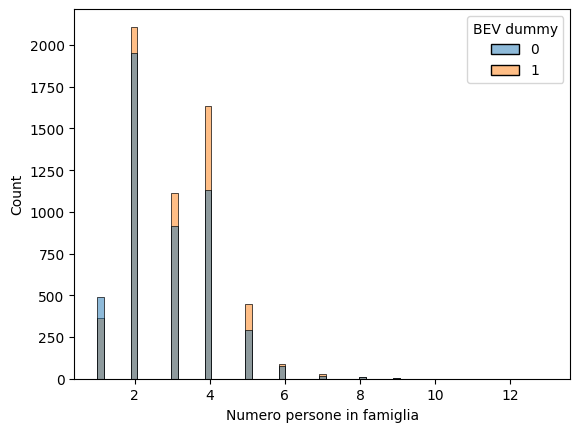

In [ ]:
famiglia_mediano =round(data_originale['Numero persone in famiglia'].median(),0)
famiglia_medio = round(data_originale['Numero persone in famiglia'].mean(),2)
famiglia_std = round(data_originale['Numero persone in famiglia'].std(),2)

print("La media è di:", famiglia_medio, ", la mediana è di:", famiglia_mediano, "e la devianza standard è di:", famiglia_std)
print()
percentili = data_originale['Numero persone in famiglia'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)
print()
sns.histplot(data=data, x="Numero persone in famiglia", hue= "BEV dummy")
plt.show()

In [ ]:
bins = [0, 1.1, 2.1, 3.1, 4.1, float('inf')]
labels = ['Sigle', 'Coppie', 'Famiglie con 1 figlio', 'Famiglie con 2 figli', 'Famiglie con 3 o più di 3 figli']

data_eda_1['Numero persone in famiglia categoriale'] = pd.cut(data_originale['Numero persone in famiglia'], bins=bins, labels=labels, right=False)

print(data_eda_1[['Numero persone in famiglia', 'Numero persone in famiglia categoriale']].head())
#data_eda_1.drop(columns=['Numero persone in famiglia'], inplace=True)

   Numero persone in famiglia Numero persone in famiglia categoriale
0                         2.0                                 Coppie
1                         3.0                  Famiglie con 1 figlio
2                         2.0                                 Coppie
3                         2.0                                 Coppie
4                         3.0                  Famiglie con 1 figlio


In [ ]:
famiglia_counts = data_eda_1['Numero persone in famiglia categoriale'].value_counts()

print(famiglia_counts)

Numero persone in famiglia categoriale
Coppie                             4059
Famiglie con 2 figli               2767
Famiglie con 1 figlio              2025
Famiglie con 3 o più di 3 figli     983
Sigle                               854
Name: count, dtype: int64


### 6.1.3 Numero auto in famiglia

La media è di: 2.52 , la mediana è di: 2.0 e la devianza standard è di: 0.92

0.00    1.0
0.25    2.0
0.50    2.0
0.75    3.0
1.00    5.0
Name: Numero di auto in famiglia, dtype: float64



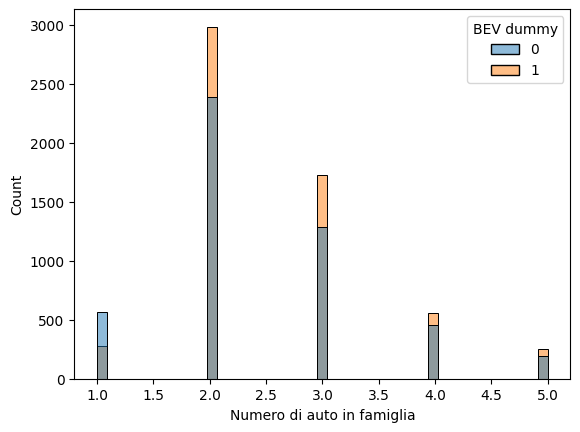

In [ ]:
autfam_mediano =round(data_originale['Numero di auto in famiglia'].median(),0)
autfam_medio = round(data_originale['Numero di auto in famiglia'].mean(),2)
autfam_std = round(data_originale['Numero di auto in famiglia'].std(),2)

print("La media è di:", autfam_medio, ", la mediana è di:", autfam_mediano, "e la devianza standard è di:", autfam_std)
print()
percentili = data_originale['Numero di auto in famiglia'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)
print()
sns.histplot(data=data, x="Numero di auto in famiglia", hue= "BEV dummy")
plt.show()

In [ ]:
bins = [0, 1.1, 2.1, 3.1, float('inf')]
labels = ['Un Auto', 'Due Auto', 'Tre Auto', 'Più di quattro Auto']

data_eda_1['Numero di auto in famiglia categoriale'] = pd.cut(data_originale['Numero di auto in famiglia'], bins=bins, labels=labels, right=False)

print(data_eda_1[['Numero di auto in famiglia', 'Numero di auto in famiglia categoriale']].head())
#data_eda_1.drop(columns=['Numero di auto in famiglia'], inplace=True)

   Numero di auto in famiglia Numero di auto in famiglia categoriale
0                         2.0                               Due Auto
1                         3.0                               Tre Auto
2                         3.0                               Tre Auto
3                         2.0                               Due Auto
4                         3.0                               Tre Auto


In [ ]:
famiglia_counts = data_eda_1['Numero di auto in famiglia categoriale'].value_counts()

print(famiglia_counts)

Numero di auto in famiglia categoriale
Due Auto               5377
Tre Auto               3006
Più di quattro Auto    1464
Un Auto                 841
Name: count, dtype: int64


## 6.2. Variabile sensibilità ambientale

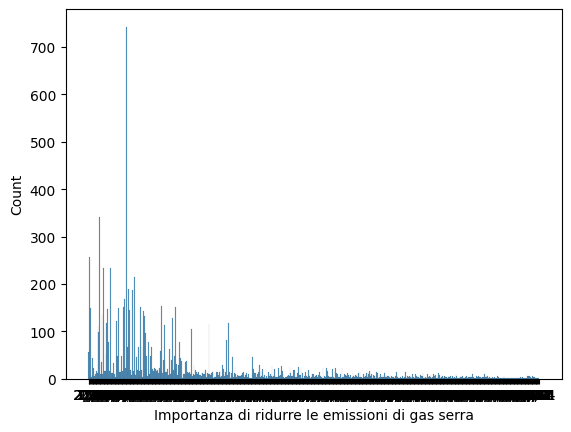

In [ ]:
sns.histplot(data=data, x="Importanza di ridurre le emissioni di gas serra")
plt.show()

In [ ]:
emiss_1 = -3
emiss_2 = -1.5
emiss_3 = 0
emiss_4= 1.5
emiss_5 = 3

punto1_emi = emiss_1
punto2_emi = (emiss_2 - emiss_1)/2+emiss_1
punto3_emi = (emiss_3 - emiss_2)/2+emiss_2
punto4_emi = (emiss_4 - emiss_3)/2+emiss_3
punto5_emi = (emiss_5 - emiss_4)/2+emiss_4
punto6_emi = emiss_5

Classe_emi_1 = [punto1_emi, punto2_emi]
Classe_emi_2 = [punto2_emi, punto3_emi]
Classe_emi_3 = [punto3_emi, punto4_emi]
Classe_emi_4 = [punto4_emi, punto5_emi]
Classe_emi_5 = [punto5_emi, punto6_emi]

print("importanza per le emissioni: molto basso:", [round(x,2) for x in Classe_emi_1])
print("importanza per le emissioni: basso:", [round(x,2) for x in Classe_emi_2])
print("importanza per le emissioni: medio:", [round(x,2) for x in Classe_emi_3])
print("importanza per le emissioni: alto:", [round(x,2) for x in Classe_emi_4])
print("importanza per le emissioni: molto alto:", [round(x,2) for x in Classe_emi_5])

importanza per le emissioni: molto basso: [-3, -2.25]
importanza per le emissioni: basso: [-2.25, -0.75]
importanza per le emissioni: medio: [-0.75, 0.75]
importanza per le emissioni: alto: [0.75, 2.25]
importanza per le emissioni: molto alto: [2.25, 3]


In [ ]:
bins = [punto1_emi, punto2_emi, punto3_emi, punto4_emi, punto5_emi, float('inf')]
labels = ['Molto basso', 'Basso', 'Medio', 'Alto', 'Molto alto']

data_eda_1['Sensibilità ambientale categoriale'] = pd.cut(data_originale['Importanza di ridurre le emissioni di gas serra'], bins=bins, labels=labels, right=False)

print(data_eda_1[['Importanza di ridurre le emissioni di gas serra', 'Sensibilità ambientale categoriale']].head())
#data_eda_2.drop(columns=['Importanza di ridurre le emissioni di gas serra'], inplace=True)

   Importanza di ridurre le emissioni di gas serra  \
0                                             2.52   
1                                             2.76   
2                                             2.60   
3                                             1.23   
4                                             1.08   

  Sensibilità ambientale categoriale  
0                         Molto alto  
1                         Molto alto  
2                         Molto alto  
3                               Alto  
4                               Alto  


In [ ]:
emi_counts = data_eda_1['Sensibilità ambientale categoriale'].value_counts()

print(emi_counts)

Sensibilità ambientale categoriale
Molto alto     6187
Alto           2019
Medio          1380
Molto basso     689
Basso           413
Name: count, dtype: int64


## 6.3. Variabili di mobilità e percorrenza

### 6.3.1. Viaggio più lungo

Il viaggio più lungo medio è di: 376.78 , il viaggio più lungo mediano è di: 318.0 e la devianza standard è di: 356.6

0.00       0.210
0.25     175.495
0.50     317.870
0.75     434.305
1.00    4865.700
Name: Viaggio più lungo negli ultimi 12 mesi, dtype: float64



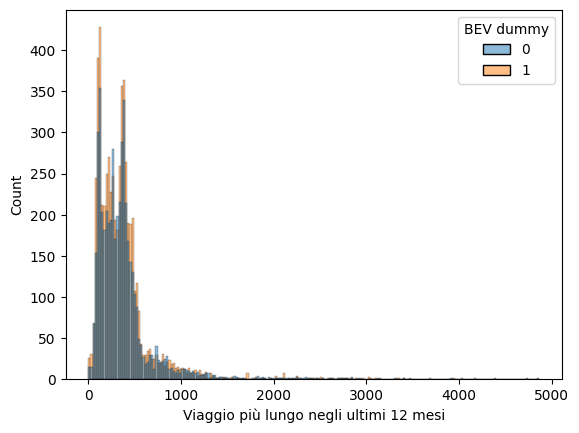

In [ ]:
viaggio_mediano =round(data['Viaggio più lungo negli ultimi 12 mesi'].median(),0)
viaggio_medio = round(data['Viaggio più lungo negli ultimi 12 mesi'].mean(),2)
viaggio_std = round(data['Viaggio più lungo negli ultimi 12 mesi'].std(),2)

print("Il viaggio più lungo medio è di:", viaggio_medio, ", il viaggio più lungo mediano è di:", viaggio_mediano, "e la devianza standard è di:", viaggio_std)
print()
percentili = data['Viaggio più lungo negli ultimi 12 mesi'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)
print()
sns.histplot(data=data, x="Viaggio più lungo negli ultimi 12 mesi", hue= "BEV dummy")
plt.show()

In [ ]:
bins = [0, 175, 350, 550, float('inf')]
labels = ['Viaggio: meno di 175', 'Viaggio: tra 175 e 350', 'Viaggio: tra 350 e 550', 'Viaggio: più di 550']

data_eda_1['Viaggio lungo categoriale'] = pd.cut(data_originale['Viaggio più lungo negli ultimi 12 mesi'], bins=bins, labels=labels, right=False)

print(data_eda_1[['Viaggio lungo categoriale', 'Viaggio più lungo negli ultimi 12 mesi']].head())
#data_eda_2.drop(columns=['Viaggio più lungo negli ultimi 12 mesi'], inplace=True)

  Viaggio lungo categoriale  Viaggio più lungo negli ultimi 12 mesi
0    Viaggio: tra 350 e 550                                  483.14
1       Viaggio: più di 550                                  568.09
2    Viaggio: tra 175 e 350                                  255.16
3    Viaggio: tra 175 e 350                                  312.78
4      Viaggio: meno di 175                                  125.79


In [ ]:
viaggilunghi_counts = data_eda_1['Viaggio lungo categoriale'].value_counts()

print(viaggilunghi_counts)

Viaggio lungo categoriale
Viaggio: tra 350 e 550    3345
Viaggio: tra 175 e 350    3292
Viaggio: meno di 175      2669
Viaggio: più di 550       1382
Name: count, dtype: int64


### 6.3.2 Numero viaggi lunghi

0.00    0.000000e+00
0.25    0.000000e+00
0.50    1.000000e+00
0.75    3.000000e+00
1.00    2.222222e+10
Name: Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi, dtype: float64


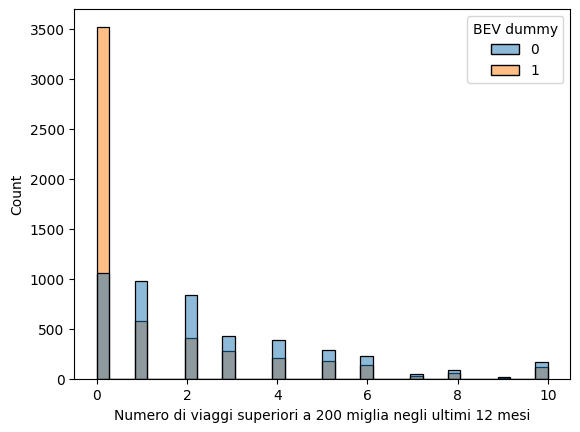

In [ ]:
percentili = data['Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)

sns.histplot(data=data[data["Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"] <= 10],
             x="Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi",
             hue="BEV dummy")
plt.show()

In [ ]:
bins = [0.0, 0.1, 1.1, 2.1, float('inf')]
labels = ['Chi non ne fa viaggi lunghi', 'Un viaggio lungo all anno', '2 viaggi lunghi all anno', '3 o più viaggi lunghi']

data_eda_1["Numero viaggi lunghi all'anno categoriale"] = pd.cut(data_originale['Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'], bins=bins, labels=labels, right=False)

print(data_eda_1[["Numero viaggi lunghi all'anno categoriale", 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi']].head())
#data_eda_2.drop(columns=['Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi'], inplace=True)

  Numero viaggi lunghi all'anno categoriale  \
0                 Un viaggio lungo all anno   
1                 Un viaggio lungo all anno   
2                 Un viaggio lungo all anno   
3                 Un viaggio lungo all anno   
4               Chi non ne fa viaggi lunghi   

   Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi  
0                                                  1             
1                                                  1             
2                                                  1             
3                                                  1             
4                                                  0             


In [ ]:
nviaggi_counts = data_eda_1["Numero viaggi lunghi all'anno categoriale"].value_counts()

print(nviaggi_counts)

Numero viaggi lunghi all'anno categoriale
Un viaggio lungo all anno      4299
Chi non ne fa viaggi lunghi    3132
3 o più viaggi lunghi          2413
2 viaggi lunghi all anno        844
Name: count, dtype: int64


### 6.3.3. Distanza casa lavoro

0.00       0.00
0.25       6.43
0.50      14.13
0.75      24.55
1.00    2381.91
Name: Distanza casa-lavoro, dtype: float64


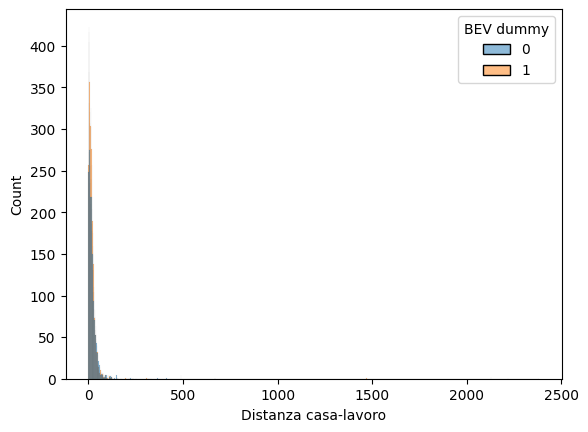

In [ ]:
percentili = data['Distanza casa-lavoro'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)
sns.histplot(data=data, x="Distanza casa-lavoro", hue= "BEV dummy")
plt.show()

In [ ]:
bins = [0.0, 6.5, 15, 25, 45, float('inf')]
labels = ['Casa-Lavoro: meno di 6,5 miglia', 'Casa-Lavoro: tra 6,5 e 15 miglia', 'Casa-Lavoro: tra 15 e 25 miglia', 'Casa-Lavoro: tra 25 e 45 miglia', 'Casa-Lavoro: più di 45 miglia']

data_eda_1['Distanza casa-lavoro categoriale'] = pd.cut(data_originale['Distanza casa-lavoro'], bins=bins, labels=labels, right=False)

print(data_eda_1[['Distanza casa-lavoro categoriale', 'Distanza casa-lavoro']].head())
#data_eda_2.drop(columns=['Distanza casa-lavoro'], inplace=True)

   Distanza casa-lavoro categoriale  Distanza casa-lavoro
0   Casa-Lavoro: meno di 6,5 miglia                  0.01
1  Casa-Lavoro: tra 6,5 e 15 miglia                 10.69
2   Casa-Lavoro: tra 15 e 25 miglia                 17.63
3   Casa-Lavoro: meno di 6,5 miglia                  3.53
4   Casa-Lavoro: tra 25 e 45 miglia                 28.05


In [ ]:
dist_counts = data_eda_1['Distanza casa-lavoro categoriale'].value_counts()

print(dist_counts)

Distanza casa-lavoro categoriale
Casa-Lavoro: tra 6,5 e 15 miglia    2938
Casa-Lavoro: meno di 6,5 miglia     2697
Casa-Lavoro: tra 15 e 25 miglia     2454
Casa-Lavoro: tra 25 e 45 miglia     1933
Casa-Lavoro: più di 45 miglia        666
Name: count, dtype: int64


### 6.3.4. VMT

Il VMT medio è di: 14282.45 , il VMT mediano è di: 11558.0 e la devianza standard è di: 15964.56

0.00         6.72000
0.25      8391.00000
0.50     11557.89474
0.75     15960.00000
1.00    378000.00000
Name: VMT annuo, dtype: float64



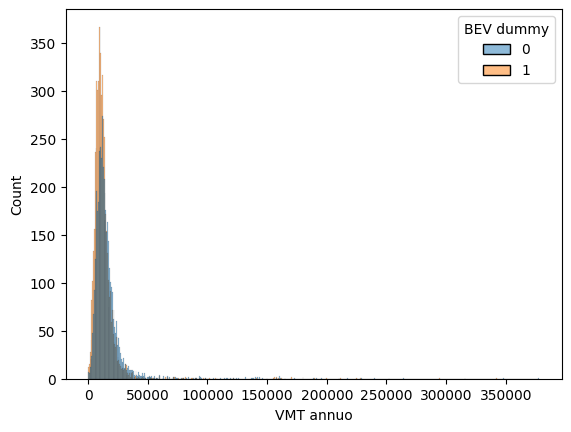

In [ ]:
data['VMT annuo'] = pd.to_numeric(data['VMT annuo'].str.replace(',', '.'), errors='coerce')

VMT_mediano =round(data['VMT annuo'].median(),0)
VMT_medio = round(data['VMT annuo'].mean(),2)
VMT_std = round(data['VMT annuo'].std(),2)

print("Il VMT medio è di:", VMT_medio, ", il VMT mediano è di:", VMT_mediano, "e la devianza standard è di:", VMT_std)
print()
percentili = data['VMT annuo'].quantile([0, 0.25, 0.5, 0.75, 1])
print(percentili)
print()
sns.histplot(data=data, x="VMT annuo", hue= "BEV dummy")
plt.show()

In [ ]:
vmt_1 = 6.720000
vmt_2 = 8391.000000
vmt_3 = 11557
vmt_4 = 15960
vmt_5 = 378000

punto1_vmt = vmt_1
punto2_vmt = (vmt_2 - vmt_1)/2+vmt_1
punto3_vmt = (vmt_3 - vmt_2)/2+vmt_2
punto4_vmt = (vmt_4 - vmt_3)/2+vmt_3
punto5_vmt = (vmt_5 - vmt_4)/2+vmt_4
punto6_vmt = vmt_5

Classe_vmt_1 = [punto1_vmt, punto2_vmt]
Classe_vmt_2 = [punto2_vmt, punto3_vmt]
Classe_vmt_3 = [punto3_vmt, punto4_vmt]
Classe_vmt_4 = [punto4_vmt, punto5_vmt]
Classe_vmt_5 = [punto5_vmt, punto6_vmt]

print("VMT molto basso:", [round(x,0) for x in Classe_vmt_1])
print("VMT basso:", [round(x,0) for x in Classe_vmt_2])
print("VMT medio:", [round(x,0) for x in Classe_vmt_3])
print("VMT alto:", [round(x,0) for x in Classe_vmt_4])
print("VMT molto alto:", [round(x,0) for x in Classe_vmt_5])

VMT molto basso: [7.0, 4199.0]
VMT basso: [4199.0, 9974.0]
VMT medio: [9974.0, 13758.0]
VMT alto: [13758.0, 196980.0]
VMT molto alto: [196980.0, 378000]


In [ ]:
bins = [0, punto2_vmt, punto3_vmt, punto4_vmt, punto5_vmt, float('inf')]
labels = ['VMT Molto basso', 'VMT Basso', 'VMT Medio', 'VMT Alto', 'VMT Molto alto']

data_eda_1['VMT categoriale'] = pd.cut(data_originale['VMT annuo'], bins=bins, labels=labels, right=False)

print(data_eda_1[['VMT annuo', 'VMT categoriale']].head())
#data_eda_2.drop(columns=['VMT annuo'], inplace=True)


   VMT annuo VMT categoriale
0      14622        VMT Alto
1       9197       VMT Basso
2       5082       VMT Basso
3      13025       VMT Medio
4      18000        VMT Alto


In [ ]:
vmt_counts = data_eda_1['VMT categoriale'].value_counts()

print(vmt_counts)

VMT categoriale
VMT Alto           3726
VMT Basso          3532
VMT Medio          3007
VMT Molto basso     407
VMT Molto alto       16
Name: count, dtype: int64


## 6.4. Variabili dipendente

In [ ]:
data_eda_1['BEV dummy'] = data_originale['BEV dummy'].replace({0: 'No', 1: 'Si'})


## 6.5. Resoconto

In [ ]:
#data_eda_1 = data_eda_1.drop(columns=['Reddito familiare'], errors='ignore')
data_eda_1.head()

,Genere,Classe d'età,Classe Reddito Familiare,Livello di istruzione,Casa di proprietà,Casa Indipendente,Numero persone in famiglia,Numero di auto in famiglia,Importanza di ridurre le emissioni di gas serra,Tipologia di auto precedente,...,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,Distanza casa-lavoro,VMT annuo,Numero persone in famiglia categoriale,Numero di auto in famiglia categoriale,VMT categoriale,Viaggio lungo categoriale,Numero viaggi lunghi all'anno categoriale,Distanza casa-lavoro categoriale,Sensibilità ambientale categoriale
0,Maschio,65-74,Molto alta,Laurea 1L,Si,Si,2.0,2.0,2.52,PHEV,...,1,0.01,14622,Coppie,Due Auto,VMT Alto,Viaggio: tra 350 e 550,Un viaggio lungo all anno,"Casa-Lavoro: meno di 6,5 miglia",Molto alto
1,Maschio,65-74,Molto alta,Laurea 2L o Dottorato,Si,Si,3.0,3.0,2.76,HEV,...,1,10.69,9197,Famiglie con 1 figlio,Tre Auto,VMT Basso,Viaggio: più di 550,Un viaggio lungo all anno,"Casa-Lavoro: tra 6,5 e 15 miglia",Molto alto
2,Maschio,55-64,Media,Diploma o Qualifica professionale,Si,Si,2.0,3.0,2.60,PHEV,...,1,17.63,5082,Coppie,Tre Auto,VMT Basso,Viaggio: tra 175 e 350,Un viaggio lungo all anno,Casa-Lavoro: tra 15 e 25 miglia,Molto alto
3,Maschio,75-79,Alta,Laurea 2L o Dottorato,Si,Si,2.0,2.0,1.23,HEV,...,1,3.53,13025,Coppie,Due Auto,VMT Medio,Viaggio: tra 175 e 350,Un viaggio lungo all anno,"Casa-Lavoro: meno di 6,5 miglia",Alto
4,Maschio,45-54,Estremamente alta,Diploma o Qualifica professionale,Si,Si,3.0,3.0,1.08,HEV,...,0,28.05,18000,Famiglie con 1 figlio,Tre Auto,VMT Alto,Viaggio: meno di 175,Chi non ne fa viaggi lunghi,Casa-Lavoro: tra 25 e 45 miglia,Alto


In [ ]:
#data_eda_1.to_csv('data_eda_1.csv', encoding = 'utf-8-sig')
#files.download('data_eda_1.csv')

In [ ]:
print(", ".join([f'"{col}"' for col in data_eda_1.columns]))

"Genere", "Classe d'età", "Classe Reddito Familiare", "Livello di istruzione", "Casa di proprietà", "Casa Indipendente", "Numero persone in famiglia", "Numero di auto in famiglia", "Importanza di ridurre le emissioni di gas serra", "Tipologia di auto precedente", "Auto attuale", "Tipologia di auto attuale", "BEV dummy", "Viaggio più lungo negli ultimi 12 mesi", "Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi", "Distanza casa-lavoro", "VMT annuo", "Numero persone in famiglia categoriale", "Numero di auto in famiglia categoriale", "VMT categoriale", "Viaggio lungo categoriale", "Numero viaggi lunghi all'anno categoriale", "Distanza casa-lavoro categoriale", "Sensibilità ambientale categoriale"


### download

In [ ]:
data_eda_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 20 columns):
 #   Column                                                        Non-Null Count  Dtype   
---  ------                                                        --------------  -----   
 0   Genere                                                        10688 non-null  object  
 1   Classe d'età                                                  10688 non-null  object  
 2   Reddito familiare                                             10688 non-null  int64   
 3   Classe Reddito Familiare                                      10688 non-null  object  
 4   Livello di istruzione                                         10688 non-null  object  
 5   Casa di proprietà                                             10688 non-null  object  
 6   Casa Indipendente                                             10688 non-null  object  
 7   Numero persone in famiglia                                

In [ ]:
#data_eda_1 = data_eda_1[['Numero persone in famiglia, categoriale','Numero di auto in famiglia, categoriale','Casa di proprietà','Casa Indipendente']]

# **7. Cluster**
L'analisi dei cluster è parte integrante delle analisi EDA (FAMD, MCA, PCA e Cluster), tutte realizzate interamente con R. Tuttavia, per l'analisi dei cluster, i risultati ottenuti in R sono stati utilizzati per creare un nuovo dataset, che è stato successivamente analizzato e confrontato con il modello di cluster sviluppato in Python. Inoltre, per l'analisi dei cluster, sono stati esplorati diversi algoritmi in Python, tra cui K-means, K-Prototypes e l'analisi gerarchica, utilizzata sia in Python che in R.

In [ ]:
!pip install kmodes

from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.metrics import silhouette_score

from scipy.cluster.hierarchy import dendrogram, linkage

%matplotlib inline

## 7.1. Algoritmo: K-MODE

### 7.1.1. Preparazione cluster



```
data_BEV_2 = data_eda_2[data_eda_2['BEV dummy'] == 'Si']
data_BEV_2.drop(columns=['Auto attuale','BEV dummy', 'Tipologia di auto attuale'], inplace=True)
data_BEV_2.head()

data_BEV = data_eda_2[data_eda_2['BEV dummy'] == 'Si']
data_BEV.drop(columns=['Auto attuale','BEV dummy', 'Tipologia di auto attuale'], inplace=True)
data_BEV.head()
```



In [ ]:
data_kmode_orig = data_eda_1[data_eda_1['BEV dummy'] == 'Si']
age_mapping = {
    "<25": " <35",
    "25-34": " <35",
    "35-44": "35-44",
    "45-54": "45-64",
    "55-64": "45-64",
    "65-74": ">65",
    "75-79": ">65",
    ">80": ">65"
}

data_kmode_orig["Classe d'età_"] = data_kmode_orig["Classe d'età"].map(age_mapping)

data_kmode = data_kmode_orig.drop(columns=["Viaggio più lungo negli ultimi 12 mesi", "Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi", "Distanza casa-lavoro",
                                      "VMT annuo", "Auto attuale", "Tipologia di auto attuale", "BEV dummy", "Importanza di ridurre le emissioni di gas serra",
                                      "Numero persone in famiglia", "Numero di auto in famiglia","Classe d'età"])

#"Genere", "Classe d'età", "Classe Reddito Familiare", "Livello di istruzione", "Casa di proprietà", "Casa Indipendente", "Numero persone in famiglia", "Numero di auto in famiglia",
#"Importanza di ridurre le emissioni di gas serra", "Tipologia di auto precedente", "Auto attuale", "Tipologia di auto attuale", "BEV dummy",
#"Viaggio più lungo negli ultimi 12 mesi", "Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi", "Distanza casa-lavoro", "VMT annuo",
#"Numero persone in famiglia categoriale", "Numero di auto in famiglia categoriale", "VMT categoriale", "Viaggio lungo categoriale", "Numero viaggi lunghi all'anno categoriale",
#"Distanza casa-lavoro categoriale", "Sensibilità ambientale categoriale"

<ipython-input-46-8b740b528c79>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_orig["Classe d'età_"] = data_kmode_orig["Classe d'età"].map(age_mapping)


In [ ]:
print(", ".join([f'"{col}"' for col in data_kmode.columns]))

"Genere", "Classe Reddito Familiare", "Livello di istruzione", "Casa di proprietà", "Casa Indipendente", "Tipologia di auto precedente", "Numero persone in famiglia categoriale", "Numero di auto in famiglia categoriale", "VMT categoriale", "Viaggio lungo categoriale", "Numero viaggi lunghi all'anno categoriale", "Distanza casa-lavoro categoriale", "Sensibilità ambientale categoriale", "Classe d'età_"


In [ ]:
data_kmode_reduced = data_kmode.drop(columns = ["Casa di proprietà", "Casa Indipendente", "Tipologia di auto precedente", "Sensibilità ambientale categoriale"])

In [ ]:
data_kmode.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5796 entries, 284 to 10687
Data columns (total 14 columns):
 #   Column                                     Non-Null Count  Dtype   
---  ------                                     --------------  -----   
 0   Genere                                     5796 non-null   object  
 1   Classe Reddito Familiare                   5796 non-null   object  
 2   Livello di istruzione                      5796 non-null   object  
 3   Casa di proprietà                          5796 non-null   object  
 4   Casa Indipendente                          5796 non-null   object  
 5   Tipologia di auto precedente               5796 non-null   object  
 6   Numero persone in famiglia categoriale     5796 non-null   category
 7   Numero di auto in famiglia categoriale     5796 non-null   category
 8   VMT categoriale                            5796 non-null   category
 9   Viaggio lungo categoriale                  5796 non-null   category
 10  Numero viaggi 

In [ ]:
#data_kmode1 = data_kmode.copy()

cost = []
import numpy as np
K = range(1,11)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1, random_state=42)
    kmode.fit_predict(data_kmode)
    cost.append(kmode.cost_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 37916.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 37916.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 37916.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 37916.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 37916.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 1195, cost: 34161.0
Run 1, iteration: 2/100, moves: 676, cost: 34161.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 1516, cost: 34521.0
Init: initializing

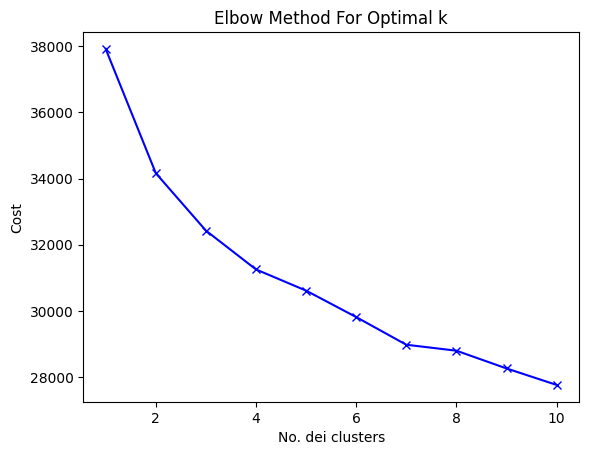

In [ ]:
plt.plot(K, cost, 'bx-')
plt.xlabel('No. dei clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

In [ ]:
nclus1 = list(range(1, 11))
cost = cost # Assuming 'cost' is defined in your existing code

df_cost1 = pd.DataFrame({'N Cluster': nclus1, 'Cost Value': cost})
df_cost1

,N Cluster,Cost Value
0,1,37916.0
1,2,34161.0
2,3,32427.0
3,4,31253.0
4,5,30613.0
5,6,29814.0
6,7,28978.0
7,8,28798.0
8,9,28262.0
9,10,27764.0




```
categorical_features = data_kmode.select_dtypes(include=['object', 'category']).columns
le = LabelEncoder()
for feature in categorical_features:
    if pd.api.types.is_numeric_dtype(data_kmode[feature]):
        continue

    data_kmode[feature] = le.fit_transform(data_kmode[feature].astype(str)) # Convert to string to handle mixed types


n_clusters_range = range(2, 11)
silhouette_scores = []
inertia_values = []

for n_clusters in n_clusters_range:
    kmode = KModes(n_clusters=n_clusters)
    kmode.fit(data_kmode) # data_BEV should now contain only numerical data
    labels = kmode.labels_
    silhouette_avg = silhouette_score(data_kmode, labels)
    inertia = kmode.inertia_
    silhouette_scores.append(silhouette_avg)
    inertia_values.append(inertia)



plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.plot(n_clusters_range, inertia_values, marker='o')
plt.xlabel('Numeri di Cluster')
plt.ylabel('Inerzia')
plt.title('Inerzia')

plt.subplot(1, 2, 2)
plt.plot(n_clusters_range, silhouette_scores, marker='o')
plt.xlabel('Numeri di Cluster')
plt.ylabel('Silhouette Score')
plt.title('Silhouette)')

plt.tight_layout()
plt.show()



```



### 7.1.2. Analisi 4 Cluster: *con dataset e calcoli da R*

In [ ]:
data_kmode_r = pd.read_csv("/content/drive/MyDrive/Tesi/Dataset/data_kmode_R.csv", sep=",")
data_kmode_r.drop(columns=['BEV.dummy', 'Tipologia.di.auto.attuale', 'Classe.d.età'], inplace=True)

print("\nDistribuzione dei cluster:\n")
print(data_kmode_r['cluster'].value_counts())


Distribuzione dei cluster:

cluster
4    1615
3    1473
1    1438
2    1270
Name: count, dtype: int64


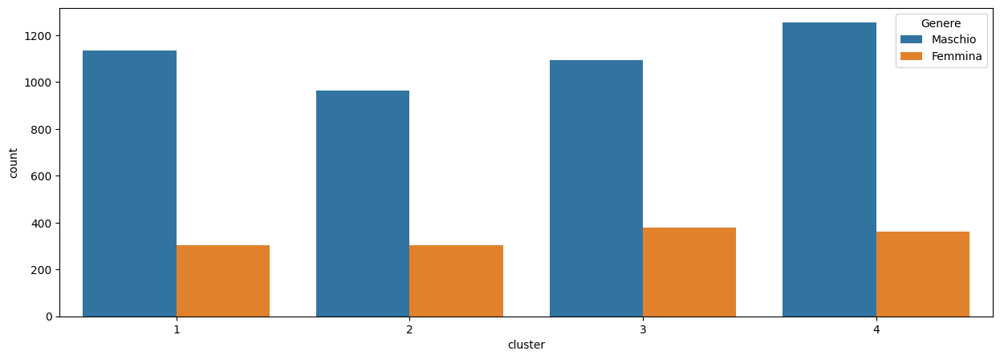

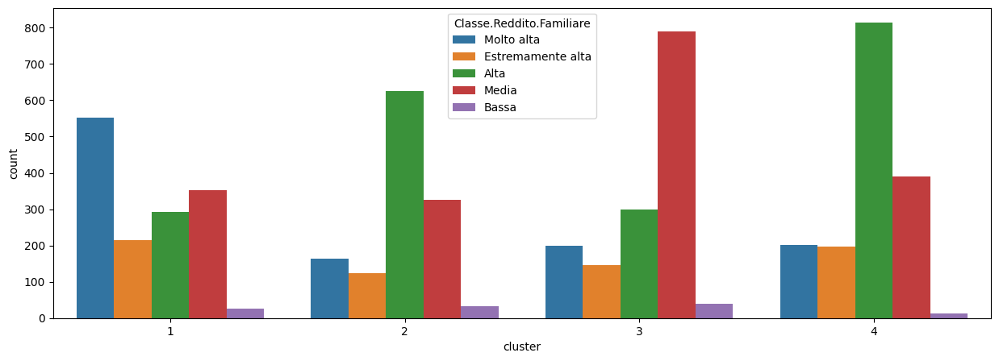

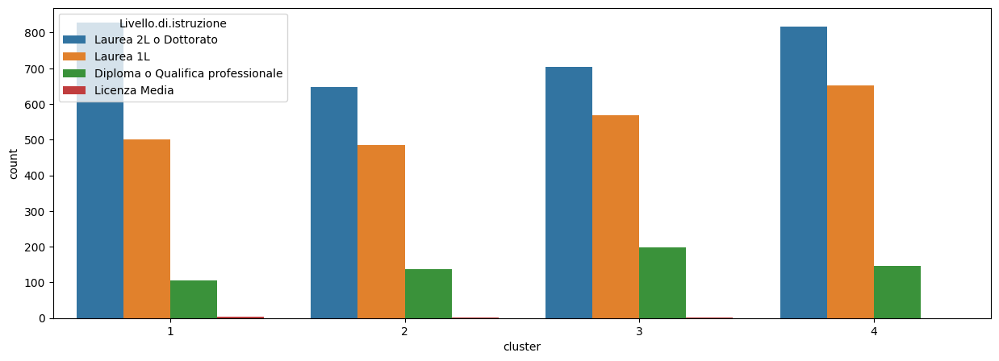

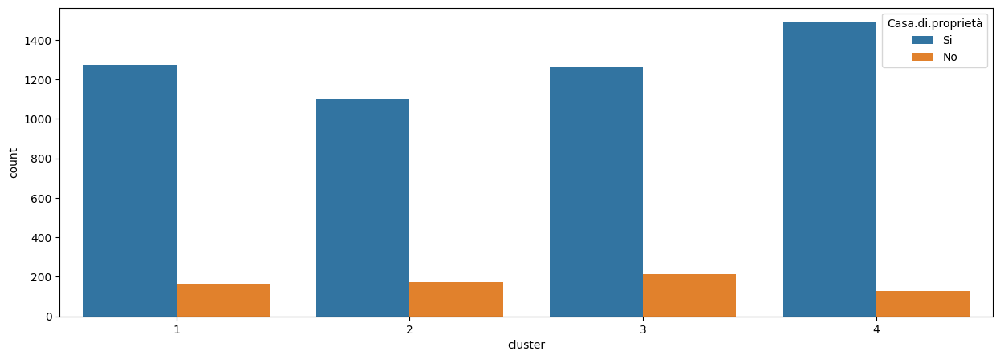

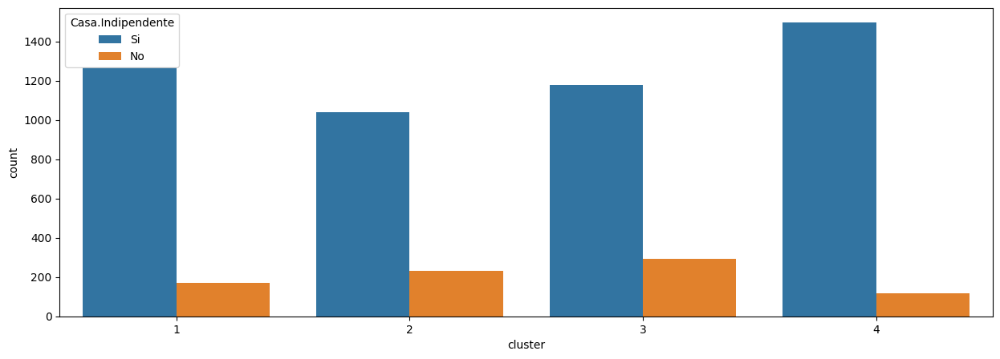

...

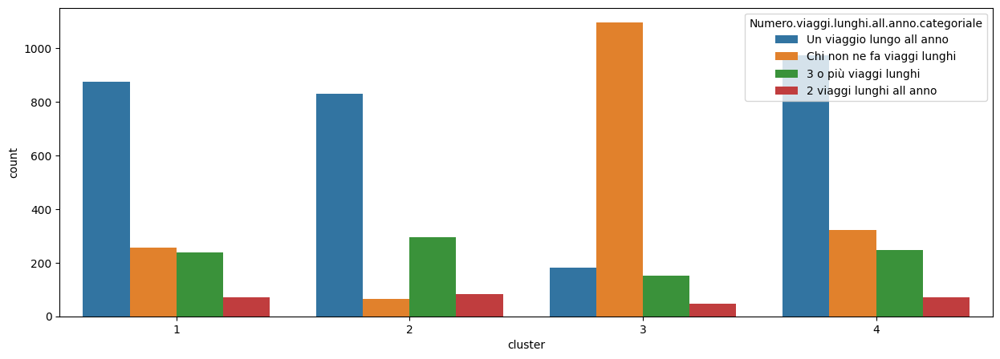

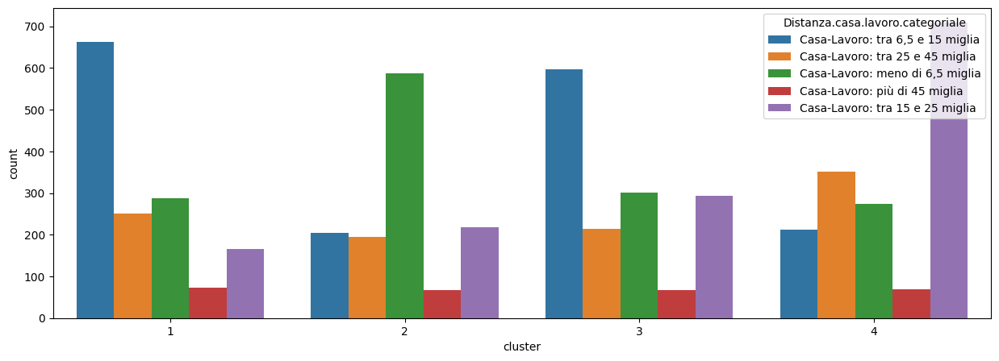

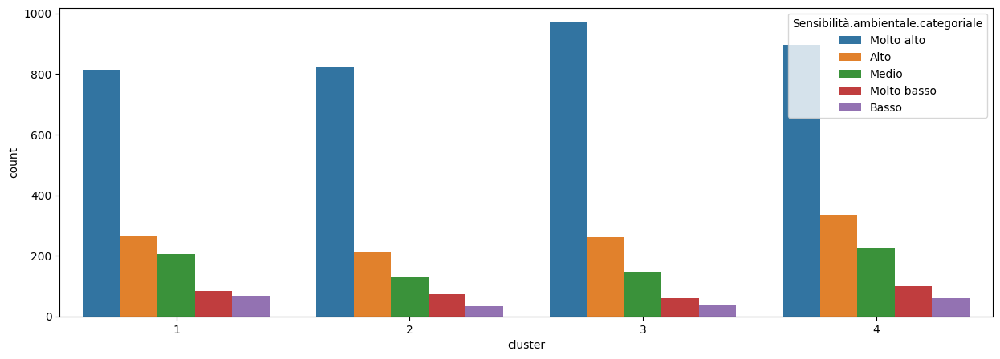

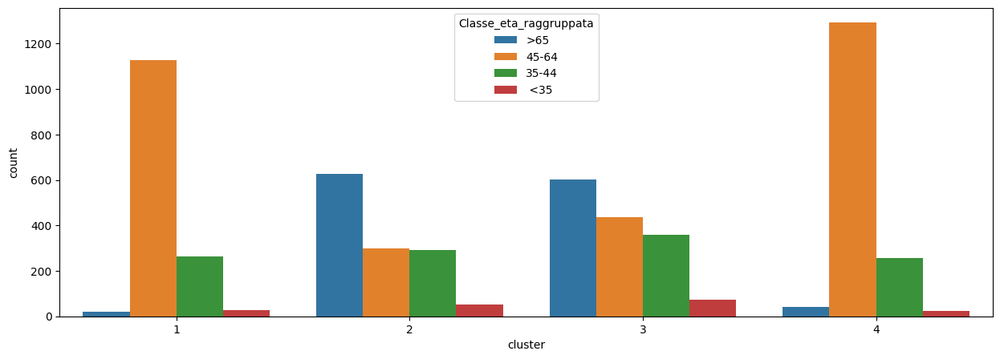

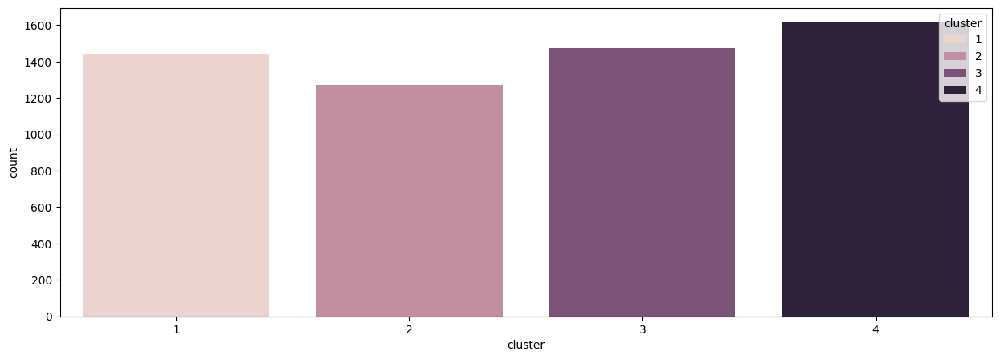

In [ ]:
all_features = data_kmode_r.columns.tolist()

#cluster_0_data = data_BEV[data_BEV['Cluster'] == 2]

for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='cluster',hue=col, data = data_kmode_r)
    plt.show()

In [ ]:
data_kmode_r1= data_kmode_r[data_kmode_r['cluster'] == 1]
data_kmode_r1.drop(columns=['cluster'], inplace=True)

data_kmode_r2= data_kmode_r[data_kmode_r['cluster'] == 2]
data_kmode_r2.drop(columns=['cluster'], inplace=True)

data_kmode_r3= data_kmode_r[data_kmode_r['cluster'] == 3]
data_kmode_r3.drop(columns=['cluster'], inplace=True)

data_kmode_r4= data_kmode_r[data_kmode_r['cluster'] == 4]
data_kmode_r4.drop(columns=['cluster'], inplace=True)

<ipython-input-65-0efdf1c19fa2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_r1.drop(columns=['cluster'], inplace=True)
<ipython-input-65-0efdf1c19fa2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_r2.drop(columns=['cluster'], inplace=True)
<ipython-input-65-0efdf1c19fa2>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_r3.drop(columns=['cluster'], inplace=True)
<ipython-input-65-0efdf1c19fa2>:11

In [ ]:
print(", ".join([f'"{col}"' for col in data_kmode_r1.columns]))

"Genere", "Classe.Reddito.Familiare", "Livello.di.istruzione", "Casa.di.proprietà", "Casa.Indipendente", "Tipologia.di.auto.precedente", "Numero.persone.in.famiglia..categoriale", "Numero.persone.in.famiglia.categoriale", "Numero.di.auto.in.famiglia.categoriale", "VMT.categoriale", "Viaggio.lungo.categoriale", "Numero.viaggi.lunghi.all.anno.categoriale", "Distanza.casa.lavoro.categoriale", "Sensibilità.ambientale.categoriale", "Classe_eta_raggruppata"


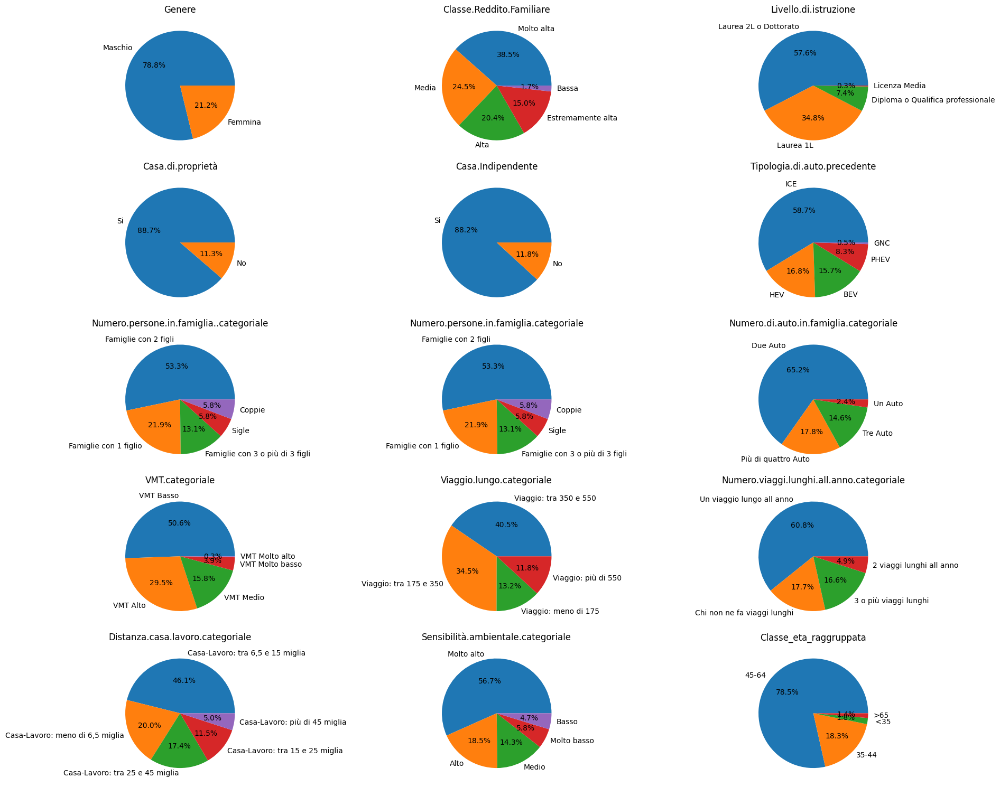

In [ ]:
num_plots = len(data_kmode_r1.columns)
rows = (num_plots + 2) // 3  # Added +2 to ensure enough subplots and rounded up
cols = 3  # Adjust if needed

fig, axes = plt.subplots(rows, cols, figsize=(20, 15))  # Adjust figsize as needed

for i, feature in enumerate(data_kmode_r1.columns):
    row = i // cols
    col = i % cols
    ax = axes[row, col]

    # Count the occurrences of each value in the feature
    value_counts = data_kmode_r1[feature].value_counts()
    ax.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%')
    ax.set_title(feature)

# Hide any unused subplots
for j in range(i + 1, rows * cols):
    row = j // cols
    col = j % cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

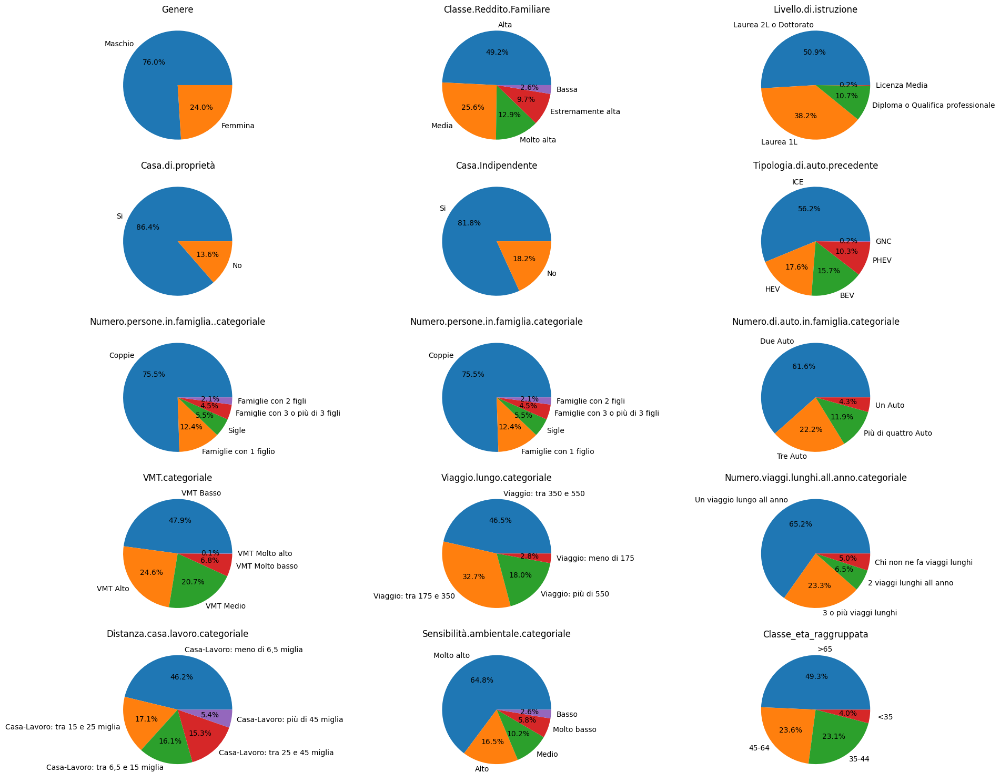

In [ ]:
num_plots = len(data_kmode_r2.columns)
rows = (num_plots + 2) // 3  # Added +2 to ensure enough subplots and rounded up
cols = 3  # Adjust if needed

fig, axes = plt.subplots(rows, cols, figsize=(20, 15))  # Adjust figsize as needed

for i, feature in enumerate(data_kmode_r2.columns):
    row = i // cols
    col = i % cols
    ax = axes[row, col]

    # Count the occurrences of each value in the feature
    value_counts = data_kmode_r2[feature].value_counts()
    ax.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%')
    ax.set_title(feature)

# Hide any unused subplots
for j in range(i + 1, rows * cols):
    row = j // cols
    col = j % cols
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

### 7.1.3. Analisi 4 Cluster

In [ ]:
data_kmode.drop(columns=['Cluster'], inplace=True)

In [ ]:
kmode = KModes(n_clusters=4, init = "random", n_init = 5, verbose=1, random_state=367889)
clusters = kmode.fit_predict(data_kmode)
data_kmode.insert(0, "Cluster", clusters, True)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2131, cost: 31327.0
Run 1, iteration: 2/100, moves: 889, cost: 31027.0
Run 1, iteration: 3/100, moves: 289, cost: 31027.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 2176, cost: 30884.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 2087, cost: 31521.0
Run 3, iteration: 2/100, moves: 190, cost: 31521.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 1659, cost: 31504.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 1858, cost: 32701.0
Run 5, iteration: 2/100, moves: 62, cost: 32701.0
Best run was number 2


In [ ]:
data_kmode

,Genere,Classe Reddito Familiare,Livello di istruzione,Casa di proprietà,Casa Indipendente,Tipologia di auto precedente,Numero persone in famiglia categoriale,Numero di auto in famiglia categoriale,VMT categoriale,Viaggio lungo categoriale,Numero viaggi lunghi all'anno categoriale,Distanza casa-lavoro categoriale,Sensibilità ambientale categoriale,Classe d'età_
284,Maschio,Estremamente alta,Laurea 2L o Dottorato,Si,Si,HEV,Coppie,Tre Auto,VMT Basso,Viaggio: tra 175 e 350,Un viaggio lungo all anno,Casa-Lavoro: tra 15 e 25 miglia,Molto alto,>65
286,Maschio,Media,Laurea 1L,Si,Si,ICE,Coppie,Tre Auto,VMT Medio,Viaggio: più di 550,Un viaggio lungo all anno,Casa-Lavoro: tra 15 e 25 miglia,Molto basso,45-64
287,Maschio,Molto alta,Laurea 2L o Dottorato,Si,Si,ICE,Famiglie con 1 figlio,Più di quattro Auto,VMT Basso,Viaggio: più di 550,Un viaggio lungo all anno,"Casa-Lavoro: tra 6,5 e 15 miglia",Molto alto,>65
289,Maschio,Alta,Laurea 2L o Dottorato,Si,Si,HEV,Coppie,Due Auto,VMT Basso,Viaggio: meno di 175,Chi non ne fa viaggi lunghi,"Casa-Lavoro: meno di 6,5 miglia",Alto,45-64
290,Maschio,Molto alta,Laurea 1L,Si,Si,ICE,Famiglie con 3 o più di 3 figli,Due Auto,VMT Alto,Viaggio: tra 350 e 550,Un viaggio lungo all anno,Casa-Lavoro: tra 25 e 45 miglia,Molto alto,45-64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10679,Maschio,Molto alta,Laurea 2L o Dottorato,Si,Si,HEV,Famiglie con 1 figlio,Due Auto,VMT Basso,Viaggio: tra 350 e 550,Un viaggio lungo all anno,"Casa-Lavoro: meno di 6,5 miglia",Molto alto,45-64
10680,Maschio,Media,Laurea 1L,Si,Si,ICE,Famiglie con 2 figli,Due Auto,VMT Alto,Viaggio: tra 175 e 350,Un viaggio lungo all anno,Casa-Lavoro: tra 25 e 45 miglia,Molto alto,35-44
10682,Maschio,Alta,Diploma o Qualifica professionale,No,No,PHEV,Coppie,Due Auto,VMT Basso,Viaggio: meno di 175,Chi non ne fa viaggi lunghi,Casa-Lavoro: tra 25 e 45 miglia,Molto alto,<35
10686,Femmina,Molto alta,Laurea 1L,Si,Si,BEV,Famiglie con 2 figli,Due Auto,VMT Medio,Viaggio: tra 175 e 350,2 viaggi lunghi all anno,Casa-Lavoro: tra 15 e 25 miglia,Medio,45-64


In [ ]:
print("\nDistribuzione dei cluster:\n")
print(data_kmode['Cluster'].value_counts())


Distribuzione dei cluster:

Cluster
0    1772
1    1654
3    1374
2     996
Name: count, dtype: int64


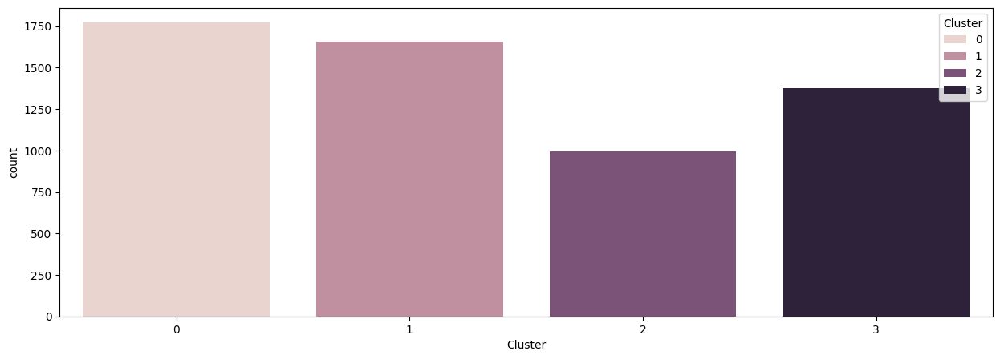

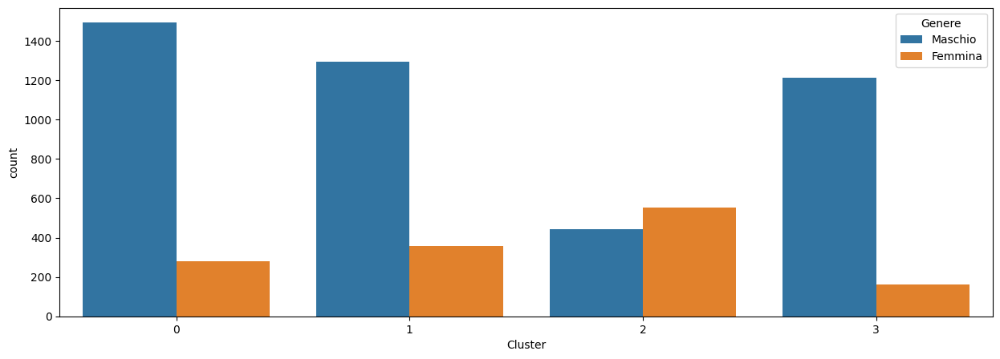

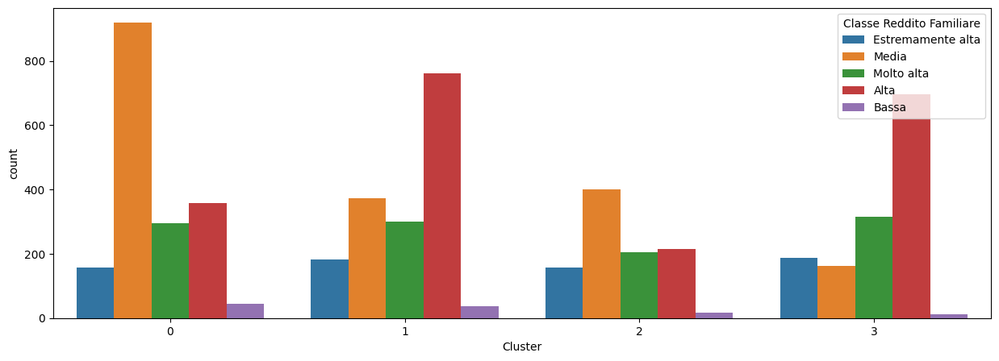

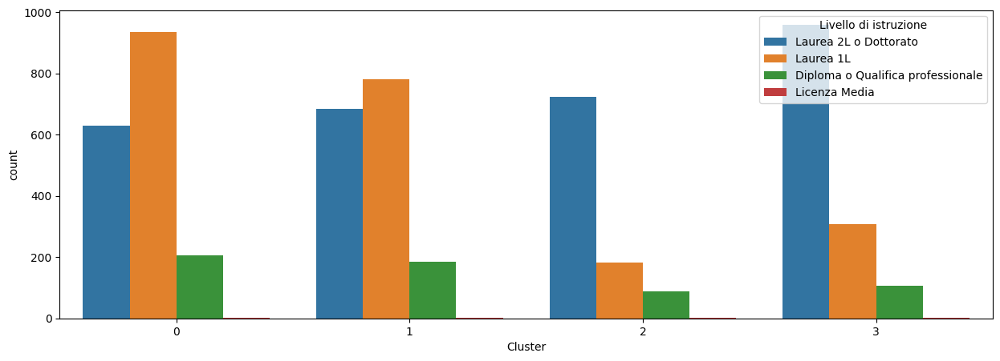

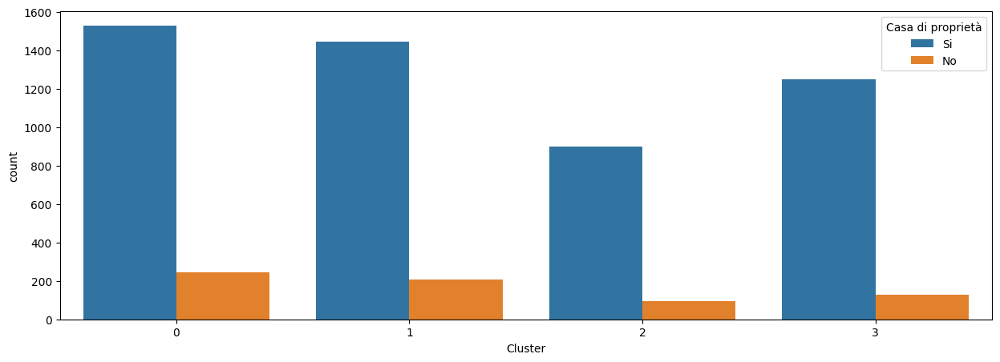

...

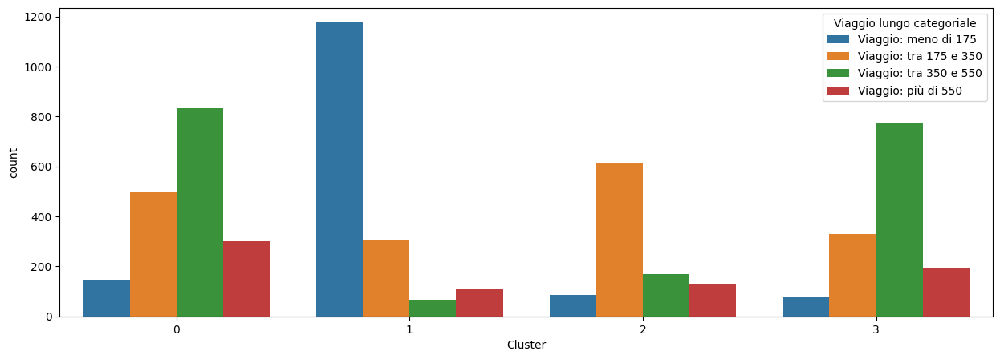

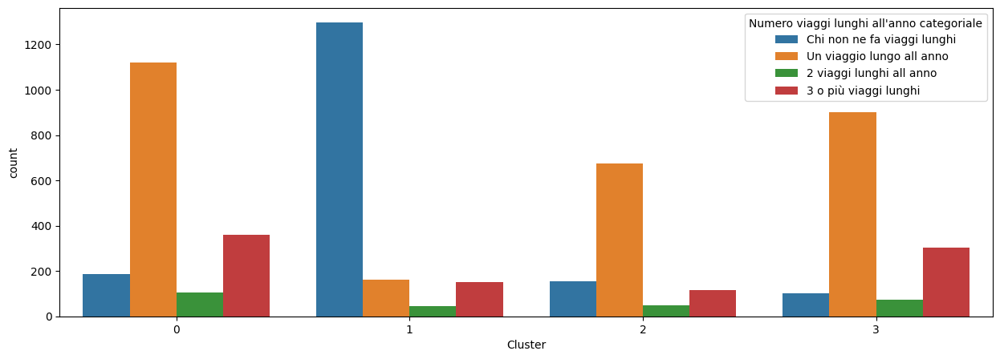

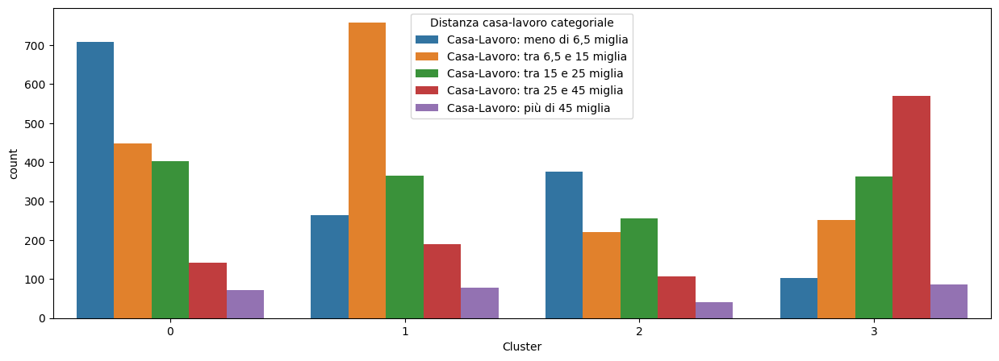

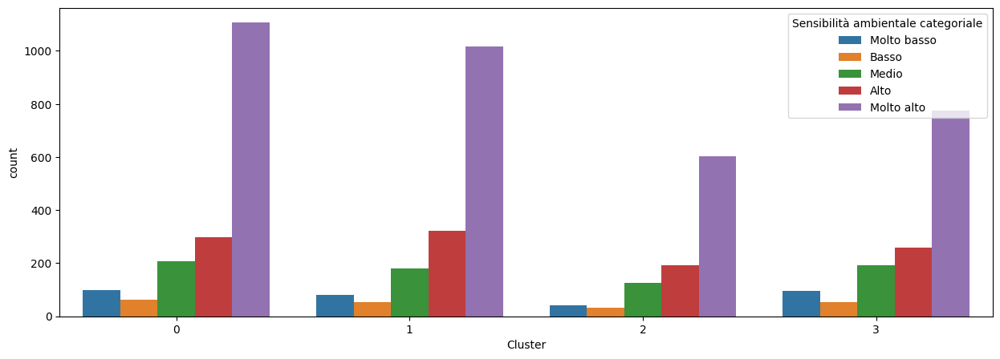

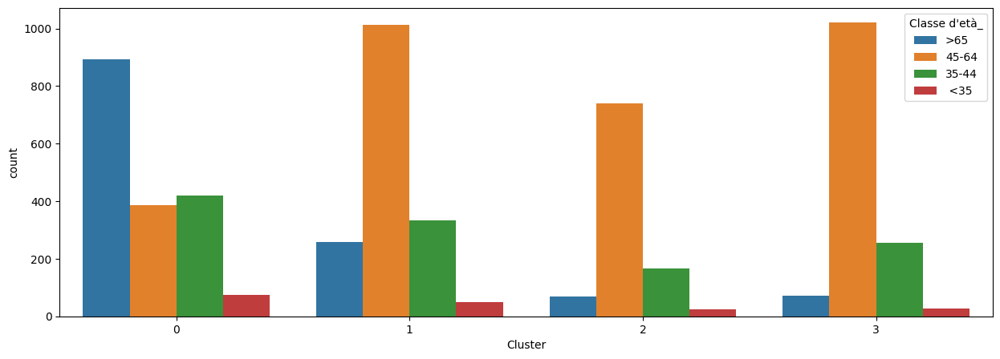

In [ ]:
all_features = data_kmode.columns.tolist()
#cluster_0_data = data_BEV[data_BEV['Cluster'] == 2]
for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='Cluster',hue=col, data = data_kmode)
    plt.show()

In [ ]:
data_kmode1= data_kmode[data_kmode['Cluster'] == 0]
data_kmode1.drop(columns=['Cluster'], inplace=True)

data_kmode2= data_kmode[data_kmode['Cluster'] == 1]
data_kmode2.drop(columns=['Cluster'], inplace=True)

data_kmode3= data_kmode[data_kmode['Cluster'] == 2]
data_kmode3.drop(columns=['Cluster'], inplace=True)

data_kmode4= data_kmode[data_kmode['Cluster'] == 3]
data_kmode4.drop(columns=['Cluster'], inplace=True)

<ipython-input-70-616f40d6d01e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode1.drop(columns=['Cluster'], inplace=True)
<ipython-input-70-616f40d6d01e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode2.drop(columns=['Cluster'], inplace=True)
<ipython-input-70-616f40d6d01e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode3.drop(columns=['Cluster'], inplace=True)
<ipython-input-70-616f40d6d01e>:11: Sett

### 7.1.4. Confronto: Risultati Rython vs R

In [ ]:
print("R:")
print(", ".join([f'"{col}"' for col in data_kmode_r1.columns]))
print()
print("Phyton:")
print(", ".join([f'"{col}"' for col in data_kmode1.columns]))

R:
"Genere", "Classe.Reddito.Familiare", "Livello.di.istruzione", "Casa.di.proprietà", "Casa.Indipendente", "Tipologia.di.auto.precedente", "Numero.persone.in.famiglia..categoriale", "Numero.persone.in.famiglia.categoriale", "Numero.di.auto.in.famiglia.categoriale", "VMT.categoriale", "Viaggio.lungo.categoriale", "Numero.viaggi.lunghi.all.anno.categoriale", "Distanza.casa.lavoro.categoriale", "Sensibilità.ambientale.categoriale", "Classe_eta_raggruppata"

Phyton:
"Genere", "Classe Reddito Familiare", "Livello di istruzione", "Casa di proprietà", "Casa Indipendente", "Tipologia di auto precedente", "Numero persone in famiglia categoriale", "Numero di auto in famiglia categoriale", "VMT categoriale", "Viaggio lungo categoriale", "Numero viaggi lunghi all'anno categoriale", "Distanza casa-lavoro categoriale", "Sensibilità ambientale categoriale", "Classe d'età_"


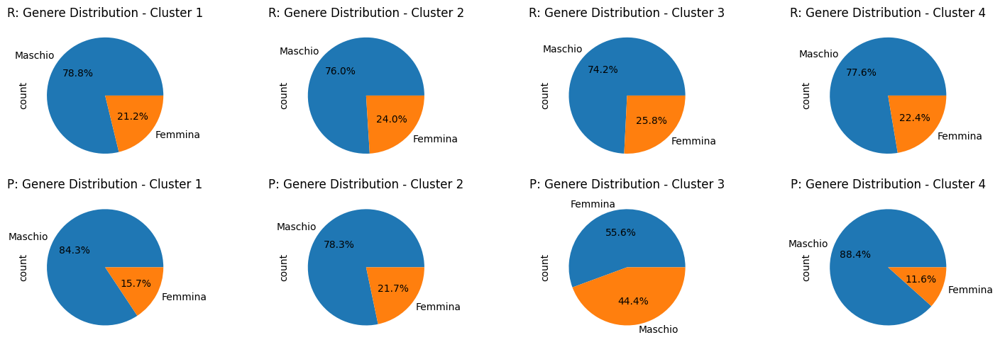

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Genere Distribution - Cluster 1')
data_kmode_r2['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Genere Distribution - Cluster 2') # Changed axes[1] to axes[0, 1]
data_kmode_r3['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Genere Distribution - Cluster 3') # Changed axes[2] to axes[0, 2]
data_kmode_r4['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Genere Distribution - Cluster 4') # Changed axes[2] to axes[0, 3]

data_kmode1['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Genere Distribution - Cluster 1') # Changed axes[0] to axes[1, 0]
data_kmode2['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Genere Distribution - Cluster 2') # Changed axes[1] to axes[1, 1]
data_kmode3['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Genere Distribution - Cluster 3') # Changed axes[2] to axes[1, 2]
data_kmode4['Genere'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Genere Distribution - Cluster 4') # Changed axes[2] to axes[1, 3]
plt.tight_layout()
plt.show()

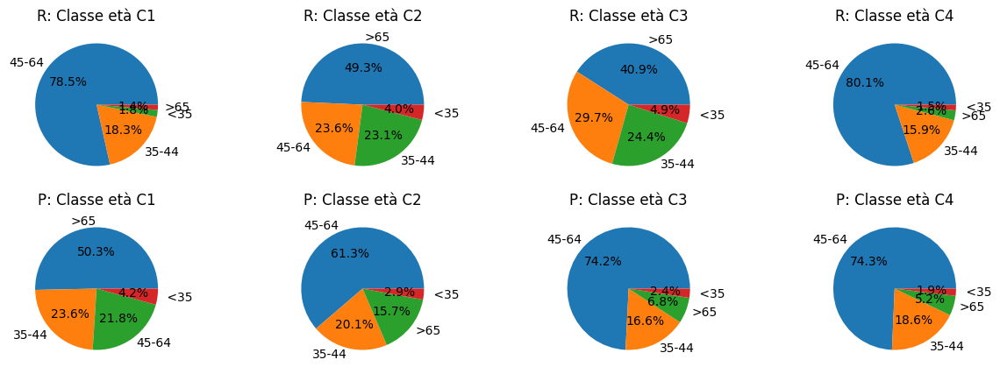

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

data_kmode_r1['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Classe età C1').set_ylabel('')
data_kmode_r2['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Classe età C2').set_ylabel('')
data_kmode_r3['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Classe età C3').set_ylabel('')
data_kmode_r4['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Classe età C4').set_ylabel('')

data_kmode1["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Classe età C1').set_ylabel('')
data_kmode2["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Classe età C2').set_ylabel('')
data_kmode3["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Classe età C3').set_ylabel('')
data_kmode4["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Classe età C4').set_ylabel('')

plt.show()

plt.tight_layout()
plt.show()

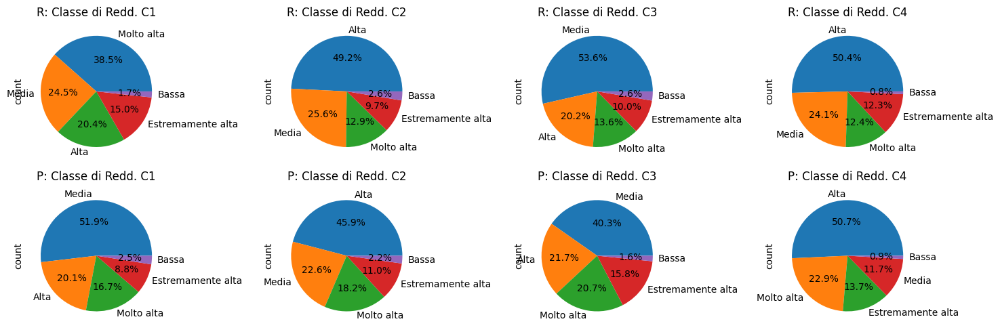

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Classe di Redd. C1')
data_kmode_r2['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Classe di Redd. C2')
data_kmode_r3['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Classe di Redd. C3')
data_kmode_r4['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Classe di Redd. C4')

data_kmode1['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Classe di Redd. C1')
data_kmode2['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Classe di Redd. C2')
data_kmode3['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Classe di Redd. C3')
data_kmode4['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Classe di Redd. C4')
plt.tight_layout()
plt.show()

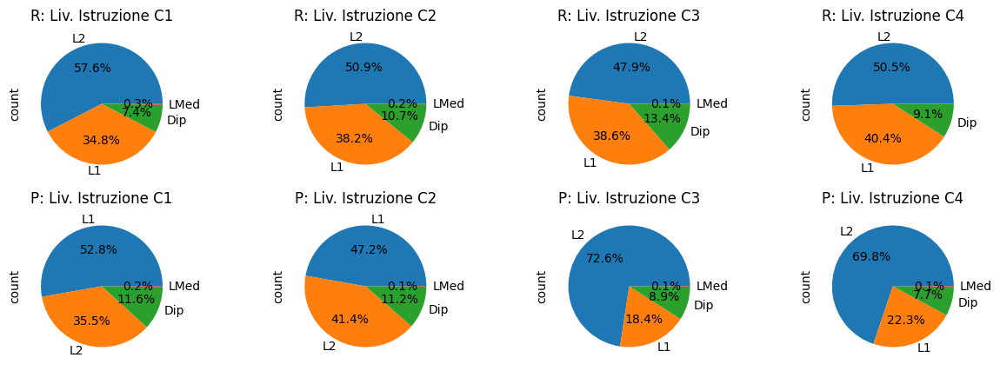

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))


label_mapping = {
    'Laurea 2L o Dottorato': 'L2',
    'Laurea 1L': 'L1',
    'Licenza Media': 'LMed',
    'Diploma o Qualifica professionale': 'Dip'
}

def plot_pie_with_short_labels_R(data, ax, title):
    data_pie = data['Livello.di.istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_R(data_kmode_r1, axes[0, 0], 'R: Liv. Istruzione C1')
plot_pie_with_short_labels_R(data_kmode_r2, axes[0, 1], 'R: Liv. Istruzione C2')
plot_pie_with_short_labels_R(data_kmode_r3, axes[0, 2], 'R: Liv. Istruzione C3')
plot_pie_with_short_labels_R(data_kmode_r4, axes[0, 3], 'R: Liv. Istruzione C4')


def plot_pie_with_short_labels_P(data, ax, title):
    data_pie = data['Livello di istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_P(data_kmode1, axes[1, 0], 'P: Liv. Istruzione C1')
plot_pie_with_short_labels_P(data_kmode2, axes[1, 1], 'P: Liv. Istruzione C2')
plot_pie_with_short_labels_P(data_kmode3, axes[1, 2], 'P: Liv. Istruzione C3')
plot_pie_with_short_labels_P(data_kmode4, axes[1, 3], 'P: Liv. Istruzione C4')

plt.show()

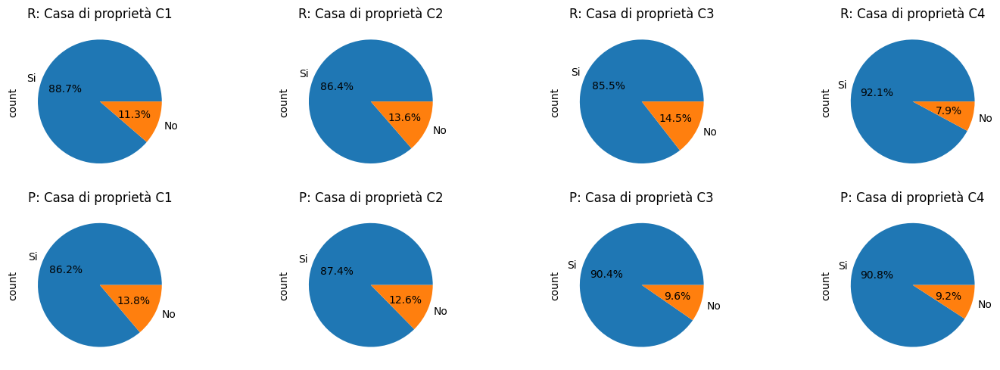

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Casa.di.proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Casa di proprietà C1')
data_kmode_r2['Casa.di.proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Casa di proprietà C2')
data_kmode_r3['Casa.di.proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Casa di proprietà C3')
data_kmode_r4['Casa.di.proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Casa di proprietà C4')

data_kmode1['Casa di proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Casa di proprietà C1')
data_kmode2['Casa di proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Casa di proprietà C2')
data_kmode3['Casa di proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Casa di proprietà C3')
data_kmode4['Casa di proprietà'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Casa di proprietà C4')
plt.tight_layout()
plt.show()

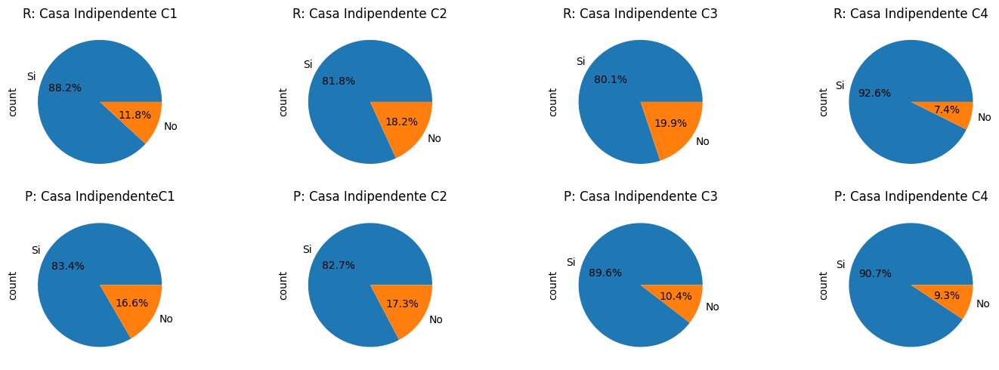

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Casa.Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Casa Indipendente C1')
data_kmode_r2['Casa.Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Casa Indipendente C2')
data_kmode_r3['Casa.Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Casa Indipendente C3')
data_kmode_r4['Casa.Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Casa Indipendente C4')

data_kmode1['Casa Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Casa IndipendenteC1')
data_kmode2['Casa Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Casa Indipendente C2')
data_kmode3['Casa Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Casa Indipendente C3')
data_kmode4['Casa Indipendente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Casa Indipendente C4')
plt.tight_layout()
plt.show()

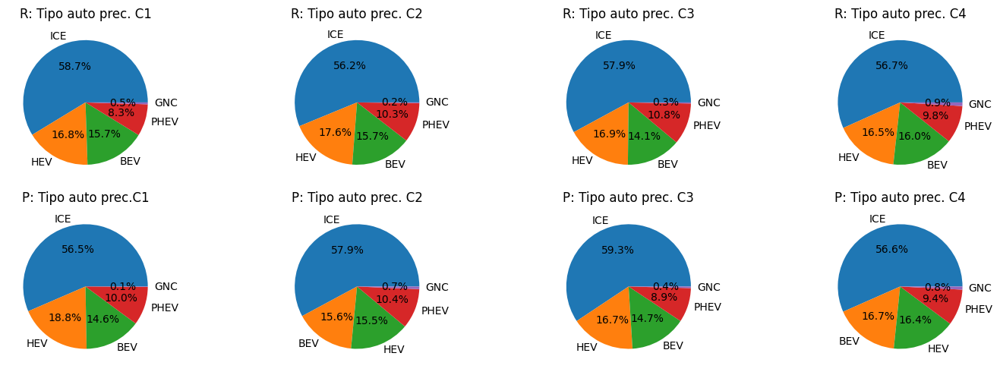

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Tipologia.di.auto.precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Tipo auto prec. C1').set_ylabel('')
data_kmode_r2['Tipologia.di.auto.precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Tipo auto prec. C2').set_ylabel('')
data_kmode_r3['Tipologia.di.auto.precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Tipo auto prec. C3').set_ylabel('')
data_kmode_r4['Tipologia.di.auto.precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Tipo auto prec. C4').set_ylabel('')

data_kmode1['Tipologia di auto precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Tipo auto prec.C1').set_ylabel('')
data_kmode2['Tipologia di auto precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Tipo auto prec. C2').set_ylabel('')
data_kmode3['Tipologia di auto precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Tipo auto prec. C3').set_ylabel('')
data_kmode4['Tipologia di auto precedente'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Tipo auto prec. C4').set_ylabel('')
plt.tight_layout()
plt.show()

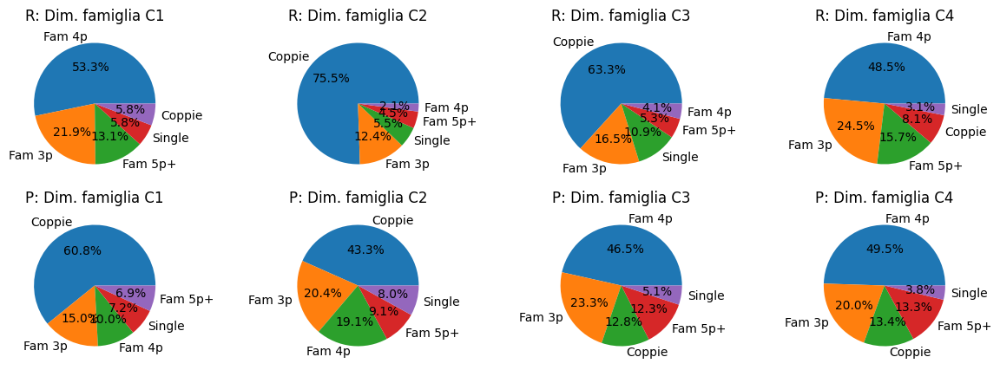

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping2 = {
    'Sigle': 'Single',
    'Coppie': 'Coppie',
    'Famiglie con 1 figlio': 'Fam 3p',
    'Famiglie con 2 figli': 'Fam 4p',
    'Famiglie con 3 o più di 3 figli': 'Fam 5p+',
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.persone.in.famiglia..categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Dim. famiglia C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Dim. famiglia C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Dim. famiglia C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Dim. famiglia C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero persone in famiglia categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Dim. famiglia C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Dim. famiglia C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Dim. famiglia C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Dim. famiglia C4')

plt.show()

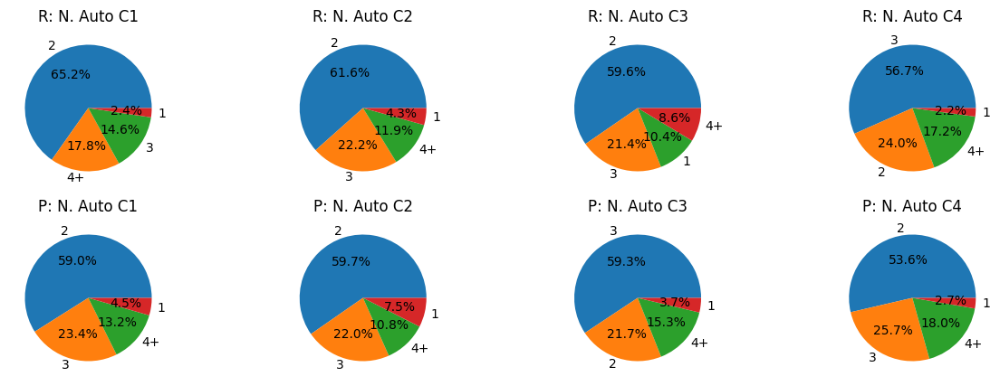

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping3 = {
    'Un Auto': '1',
    'Due Auto': '2',
    'Tre Auto': '3',
    'Più di quattro Auto': '4+'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.di.auto.in.famiglia.categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: N. Auto C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: N. Auto C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: N. Auto C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: N. Auto C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero di auto in famiglia categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: N. Auto C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: N. Auto C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: N. Auto C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: N. Auto C4')

plt.show()

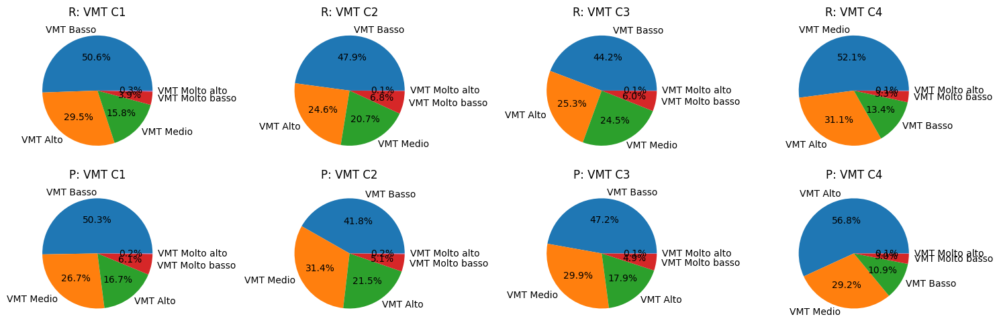

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: VMT C1').set_ylabel('')
data_kmode_r2['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: VMT C2').set_ylabel('')
data_kmode_r3['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: VMT C3').set_ylabel('')
data_kmode_r4['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: VMT C4').set_ylabel('')

data_kmode1['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: VMT C1').set_ylabel('')
data_kmode2['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: VMT C2').set_ylabel('')
data_kmode3['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: VMT C3').set_ylabel('')
data_kmode4['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: VMT C4').set_ylabel('')
plt.tight_layout()
plt.show()

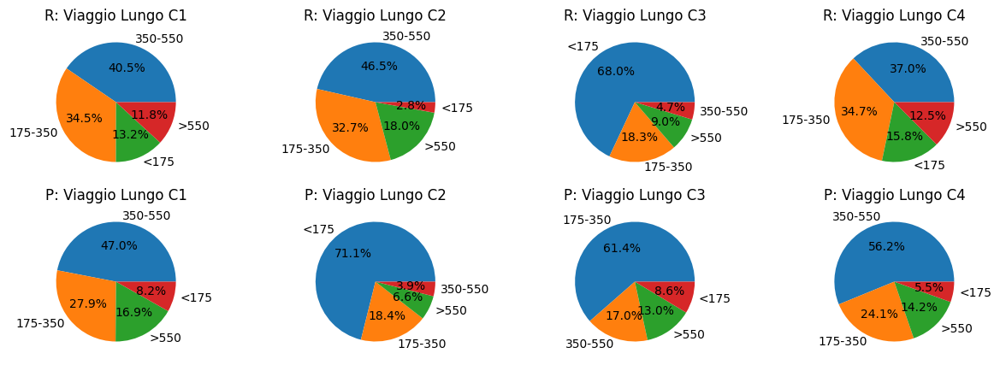

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping4 = {
    'Viaggio: meno di 175': '<175',
    'Viaggio: tra 175 e 350': '175-350',
    'Viaggio: tra 350 e 550': '350-550',
    'Viaggio: più di 550': '>550'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Viaggio.lungo.categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Viaggio Lungo C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Viaggio Lungo C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Viaggio Lungo C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Viaggio Lungo C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Viaggio lungo categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Viaggio Lungo C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Viaggio Lungo C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Viaggio Lungo C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Viaggio Lungo C4')

plt.show()

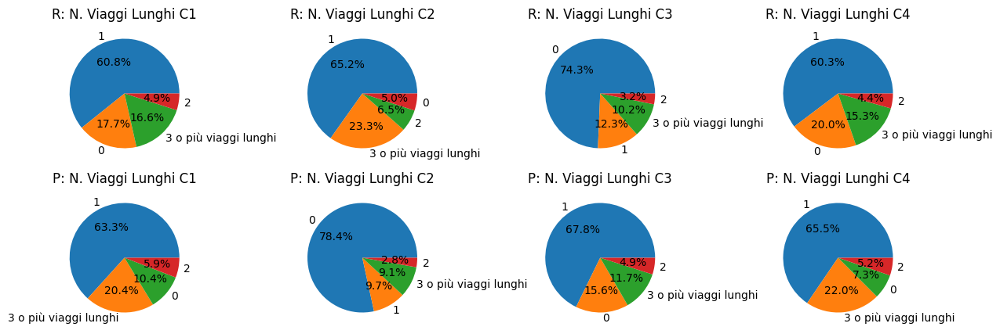

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping5 = {
    'Chi non ne fa viaggi lunghi': '0',
    'Un viaggio lungo all anno': '1',
    '2 viaggi lunghi all anno': '2',
    '3 o più viaggi lunghi0': '3+'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.viaggi.lunghi.all.anno.categoriale'].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: N. Viaggi Lunghi C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Numero viaggi lunghi all'anno categoriale"].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: N. Viaggi Lunghi C4')

plt.show()

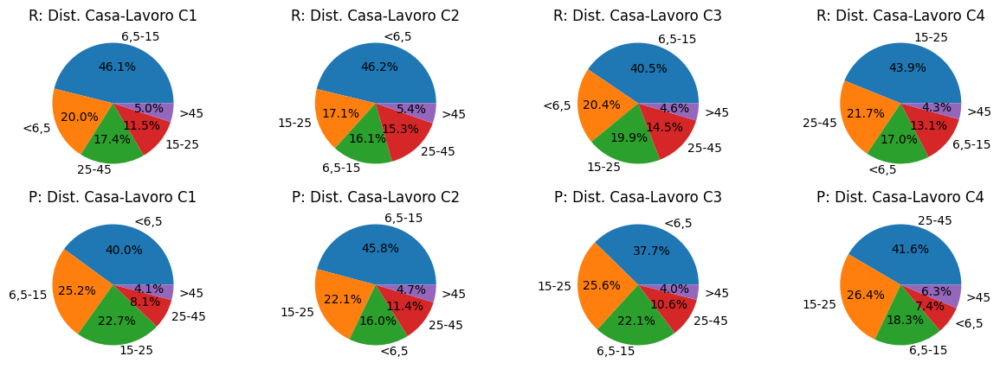

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping6 = {
    'Casa-Lavoro: meno di 6,5 miglia': '<6,5',
    'Casa-Lavoro: tra 6,5 e 15 miglia': '6,5-15',
    'Casa-Lavoro: tra 15 e 25 miglia': '15-25',
    'Casa-Lavoro: tra 25 e 45 miglia': '25-45',
    'Casa-Lavoro: più di 45 miglia': '>45'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Distanza.casa.lavoro.categoriale'].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Dist. Casa-Lavoro C4')

def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Distanza casa-lavoro categoriale"].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Dist. Casa-Lavoro C4')

plt.show()

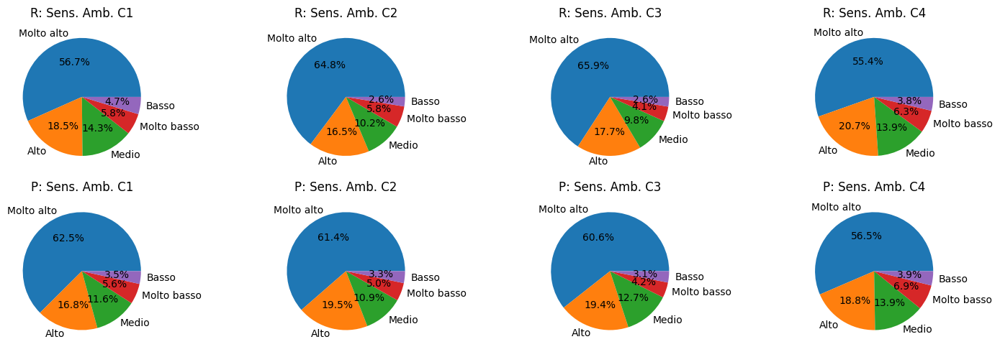

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Sensibilità.ambientale.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Sens. Amb. C1').set_ylabel('')
data_kmode_r2['Sensibilità.ambientale.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Sens. Amb. C2').set_ylabel('')
data_kmode_r3['Sensibilità.ambientale.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Sens. Amb. C3').set_ylabel('')
data_kmode_r4['Sensibilità.ambientale.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Sens. Amb. C4').set_ylabel('')

data_kmode1['Sensibilità ambientale categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Sens. Amb. C1').set_ylabel('')
data_kmode2['Sensibilità ambientale categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Sens. Amb. C2').set_ylabel('')
data_kmode3['Sensibilità ambientale categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Sens. Amb. C3').set_ylabel('')
data_kmode4['Sensibilità ambientale categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Sens. Amb. C4').set_ylabel('')
plt.tight_layout()
plt.show()

### 7.1.5. Confronto var significativi

In [ ]:
print("R:")
print(", ".join([f'"{col}"' for col in data_kmode_r1.columns]))
print()
print("Phyton:")
print(", ".join([f'"{col}"' for col in data_kmode1.columns]))

R:
"Genere", "Classe.Reddito.Familiare", "Livello.di.istruzione", "Casa.di.proprietà", "Casa.Indipendente", "Tipologia.di.auto.precedente", "Numero.persone.in.famiglia..categoriale", "Numero.persone.in.famiglia.categoriale", "Numero.di.auto.in.famiglia.categoriale", "VMT.categoriale", "Viaggio.lungo.categoriale", "Numero.viaggi.lunghi.all.anno.categoriale", "Distanza.casa.lavoro.categoriale", "Sensibilità.ambientale.categoriale", "Classe_eta_raggruppata"

Phyton:
"Genere", "Classe Reddito Familiare", "Livello di istruzione", "Casa di proprietà", "Casa Indipendente", "Tipologia di auto precedente", "Numero persone in famiglia categoriale", "Numero di auto in famiglia categoriale", "VMT categoriale", "Viaggio lungo categoriale", "Numero viaggi lunghi all'anno categoriale", "Distanza casa-lavoro categoriale", "Sensibilità ambientale categoriale", "Classe d'età_"


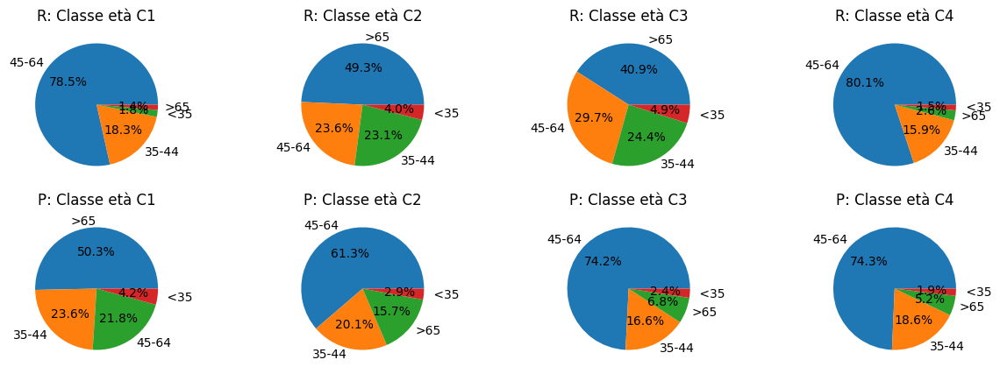

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

data_kmode_r1['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Classe età C1').set_ylabel('')
data_kmode_r2['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Classe età C2').set_ylabel('')
data_kmode_r3['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Classe età C3').set_ylabel('')
data_kmode_r4['Classe_eta_raggruppata'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Classe età C4').set_ylabel('')

data_kmode1["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Classe età C1').set_ylabel('')
data_kmode2["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Classe età C2').set_ylabel('')
data_kmode3["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Classe età C3').set_ylabel('')
data_kmode4["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Classe età C4').set_ylabel('')

plt.show()

plt.tight_layout()
plt.show()

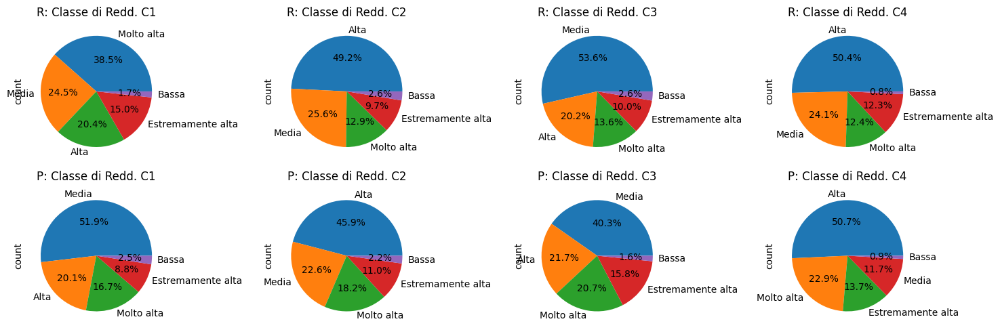

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: Classe di Redd. C1')
data_kmode_r2['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: Classe di Redd. C2')
data_kmode_r3['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: Classe di Redd. C3')
data_kmode_r4['Classe.Reddito.Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: Classe di Redd. C4')

data_kmode1['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: Classe di Redd. C1')
data_kmode2['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: Classe di Redd. C2')
data_kmode3['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: Classe di Redd. C3')
data_kmode4['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: Classe di Redd. C4')
plt.tight_layout()
plt.show()

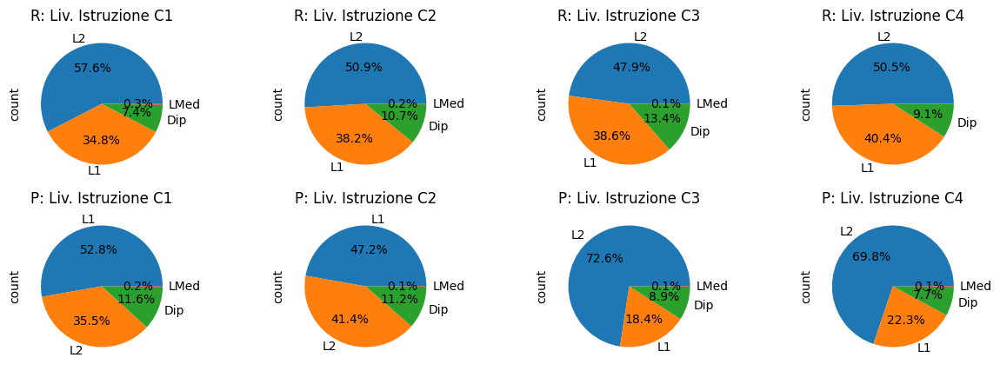

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))


label_mapping = {
    'Laurea 2L o Dottorato': 'L2',
    'Laurea 1L': 'L1',
    'Licenza Media': 'LMed',
    'Diploma o Qualifica professionale': 'Dip'
}

def plot_pie_with_short_labels_R(data, ax, title):
    data_pie = data['Livello.di.istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_R(data_kmode_r1, axes[0, 0], 'R: Liv. Istruzione C1')
plot_pie_with_short_labels_R(data_kmode_r2, axes[0, 1], 'R: Liv. Istruzione C2')
plot_pie_with_short_labels_R(data_kmode_r3, axes[0, 2], 'R: Liv. Istruzione C3')
plot_pie_with_short_labels_R(data_kmode_r4, axes[0, 3], 'R: Liv. Istruzione C4')


def plot_pie_with_short_labels_P(data, ax, title):
    data_pie = data['Livello di istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_P(data_kmode1, axes[1, 0], 'P: Liv. Istruzione C1')
plot_pie_with_short_labels_P(data_kmode2, axes[1, 1], 'P: Liv. Istruzione C2')
plot_pie_with_short_labels_P(data_kmode3, axes[1, 2], 'P: Liv. Istruzione C3')
plot_pie_with_short_labels_P(data_kmode4, axes[1, 3], 'P: Liv. Istruzione C4')

plt.show()

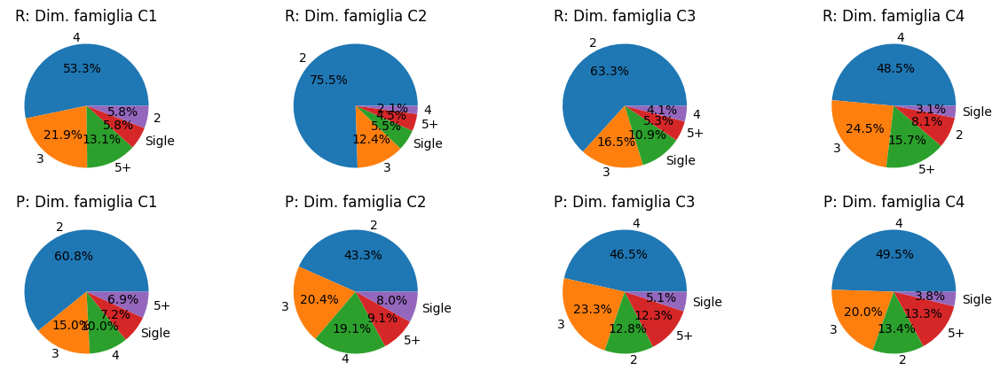

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping2 = {
    'Single': '1',
    'Coppie': '2',
    'Famiglie con 1 figlio': '3',
    'Famiglie con 2 figli': '4',
    'Famiglie con 3 o più di 3 figli': '5+'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.persone.in.famiglia.categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Dim. famiglia C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Dim. famiglia C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Dim. famiglia C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Dim. famiglia C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero persone in famiglia categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Dim. famiglia C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Dim. famiglia C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Dim. famiglia C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Dim. famiglia C4')

plt.show()

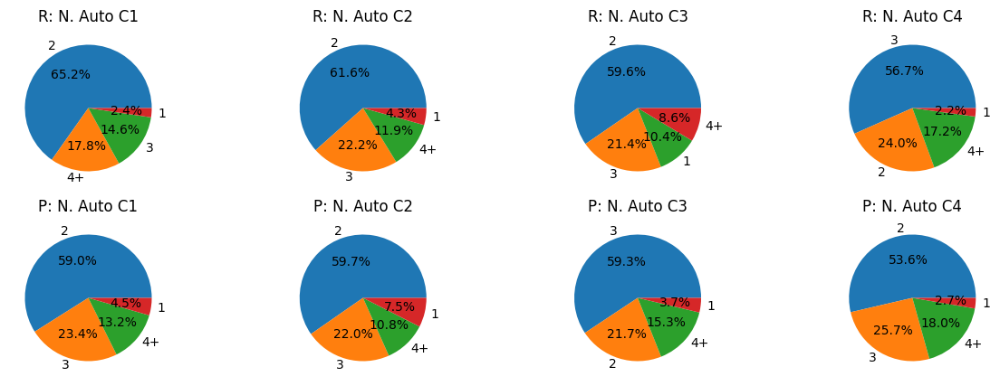

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping3 = {
    'Un Auto': '1',
    'Due Auto': '2',
    'Tre Auto': '3',
    'Più di quattro Auto': '4+'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.di.auto.in.famiglia.categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: N. Auto C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: N. Auto C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: N. Auto C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: N. Auto C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero di auto in famiglia categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: N. Auto C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: N. Auto C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: N. Auto C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: N. Auto C4')

plt.show()

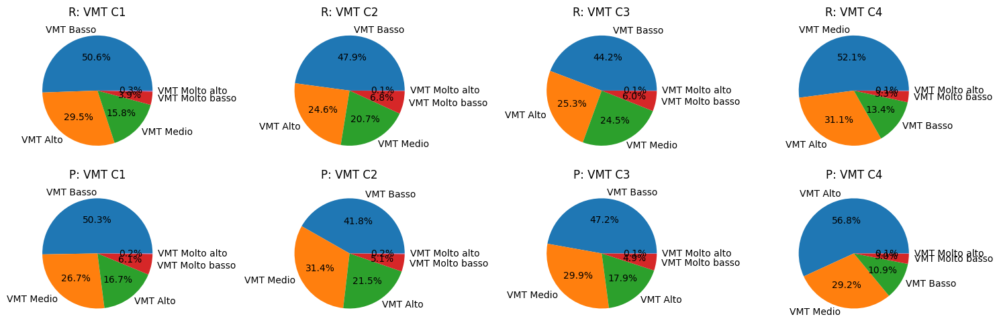

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode_r1['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='R: VMT C1').set_ylabel('')
data_kmode_r2['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='R: VMT C2').set_ylabel('')
data_kmode_r3['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='R: VMT C3').set_ylabel('')
data_kmode_r4['VMT.categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='R: VMT C4').set_ylabel('')

data_kmode1['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='P: VMT C1').set_ylabel('')
data_kmode2['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='P: VMT C2').set_ylabel('')
data_kmode3['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='P: VMT C3').set_ylabel('')
data_kmode4['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='P: VMT C4').set_ylabel('')
plt.tight_layout()
plt.show()

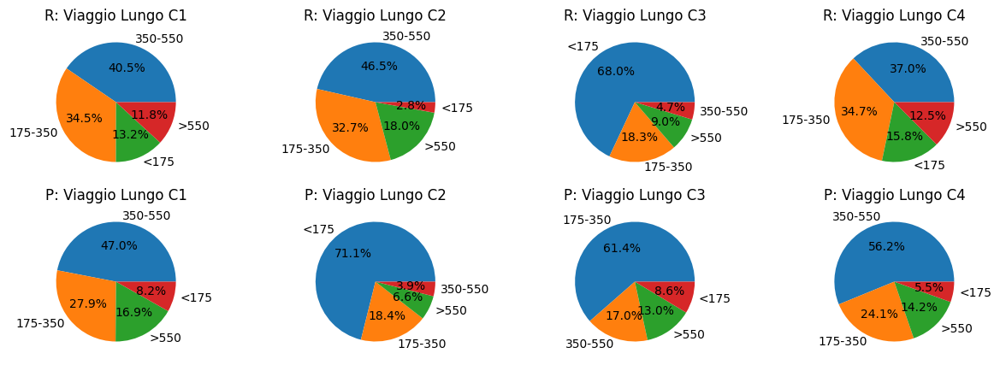

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping4 = {
    'Viaggio: meno di 175': '<175',
    'Viaggio: tra 175 e 350': '175-350',
    'Viaggio: tra 350 e 550': '350-550',
    'Viaggio: più di 550': '>550'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Viaggio.lungo.categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Viaggio Lungo C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Viaggio Lungo C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Viaggio Lungo C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Viaggio Lungo C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Viaggio lungo categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Viaggio Lungo C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Viaggio Lungo C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Viaggio Lungo C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Viaggio Lungo C4')

plt.show()

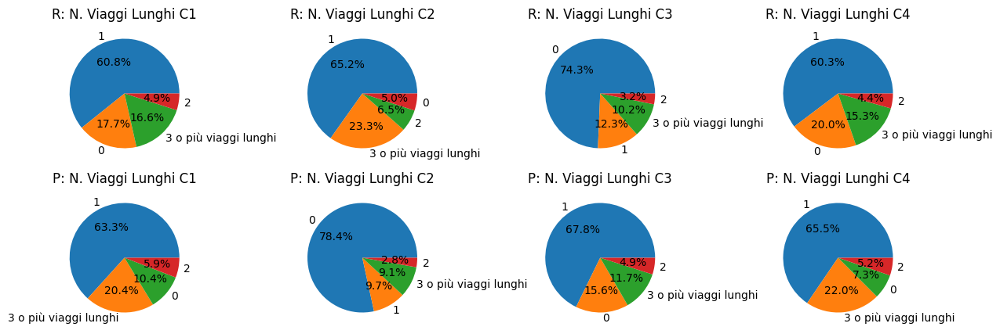

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping5 = {
    'Chi non ne fa viaggi lunghi': '0',
    'Un viaggio lungo all anno': '1',
    '2 viaggi lunghi all anno': '2',
    '3 o più viaggi lunghi0': '3+'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Numero.viaggi.lunghi.all.anno.categoriale'].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: N. Viaggi Lunghi C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Numero viaggi lunghi all'anno categoriale"].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: N. Viaggi Lunghi C4')

plt.show()

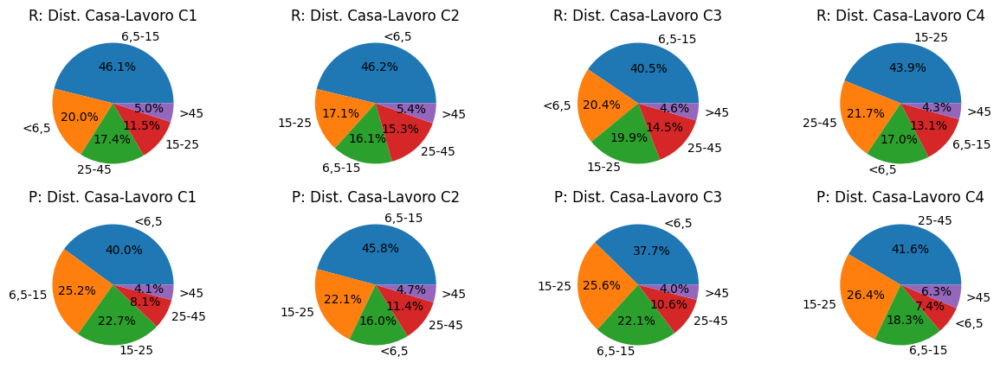

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping6 = {
    'Casa-Lavoro: meno di 6,5 miglia': '<6,5',
    'Casa-Lavoro: tra 6,5 e 15 miglia': '6,5-15',
    'Casa-Lavoro: tra 15 e 25 miglia': '15-25',
    'Casa-Lavoro: tra 25 e 45 miglia': '25-45',
    'Casa-Lavoro: più di 45 miglia': '>45'
}

def plot_pie_with_short_labels_R2(data, ax, title):
    data_pie = data['Distanza.casa.lavoro.categoriale'].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_R2(data_kmode_r1, axes[0, 0], 'R: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_R2(data_kmode_r2, axes[0, 1], 'R: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_R2(data_kmode_r3, axes[0, 2], 'R: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_R2(data_kmode_r4, axes[0, 3], 'R: Dist. Casa-Lavoro C4')

def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Distanza casa-lavoro categoriale"].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[1, 0], 'P: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[1, 1], 'P: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[1, 2], 'P: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[1, 3], 'P: Dist. Casa-Lavoro C4')

plt.show()

### 7.1.7. Prova 4 Cluster reduced

#### *7.1.7.1 Grafici*

In [ ]:
#data_kmode.drop(columns=['Cluster', 'Cluster'], inplace=True)

In [ ]:
kmode = KModes(n_clusters=4, init = "random", n_init = 5, verbose=1, random_state =42)
clusters = kmode.fit_predict(data_kmode_reduced)
data_kmode_reduced.insert(0, "Cluster", clusters, True)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 1257, cost: 25213.0
Run 1, iteration: 2/100, moves: 91, cost: 25213.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 1293, cost: 24963.0
Run 2, iteration: 2/100, moves: 360, cost: 24963.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 1381, cost: 25809.0
Run 3, iteration: 2/100, moves: 366, cost: 25809.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 1570, cost: 25659.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 1140, cost: 24687.0
Run 5, iteration: 2/100, moves: 1, cost: 24687.0
Best run was number 5


In [ ]:
print("\nDistribuzione dei cluster:\n")
print(data_kmode_reduced['Cluster'].value_counts())


Distribuzione dei cluster:

Cluster
0    1708
2    1680
1    1674
3     734
Name: count, dtype: int64


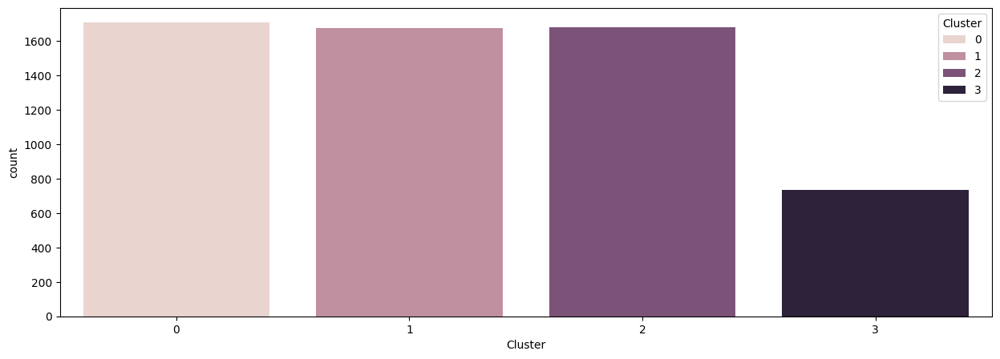

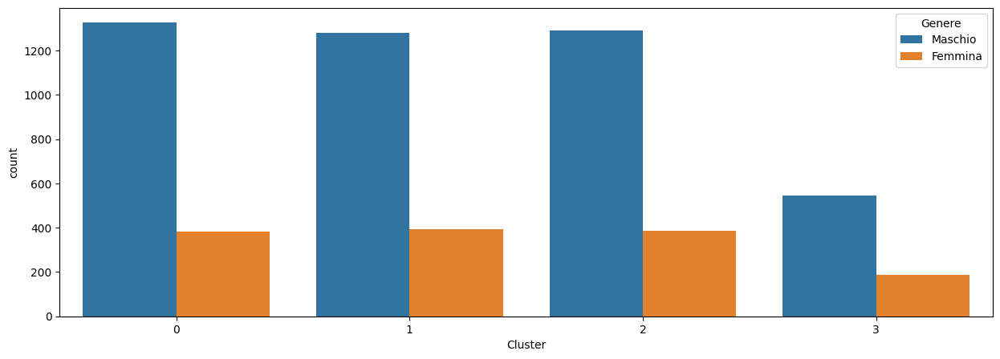

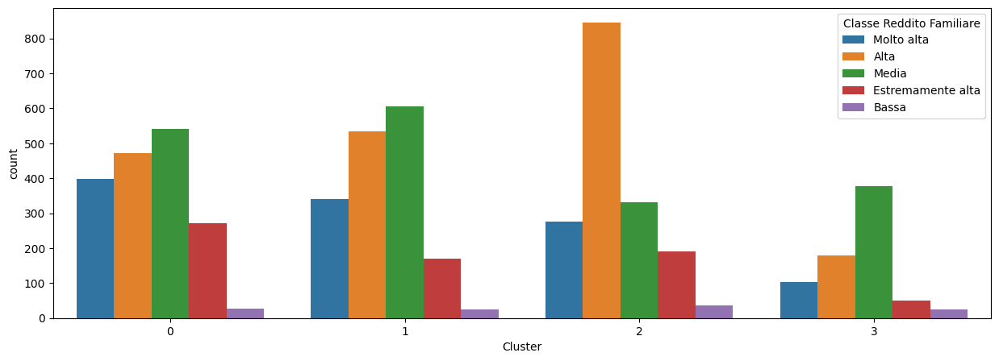

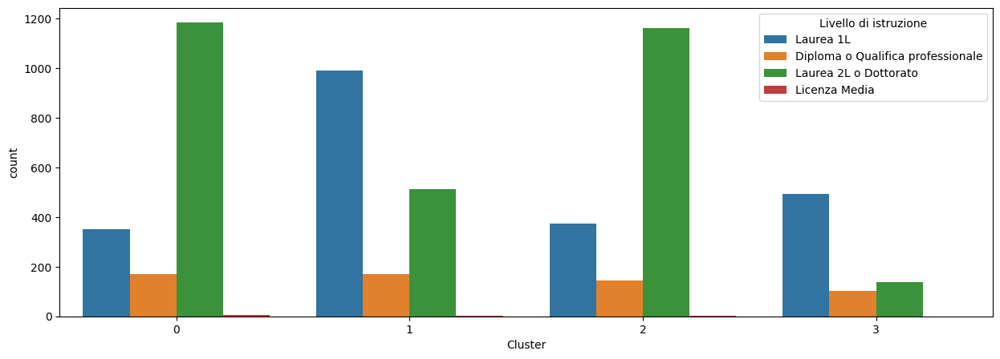

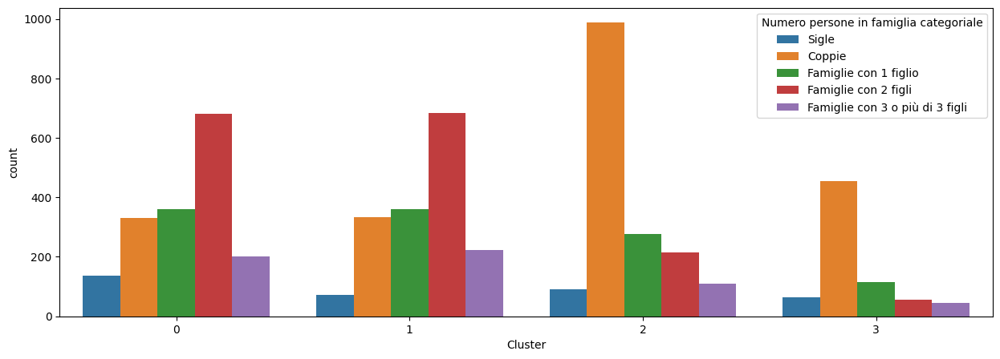

...

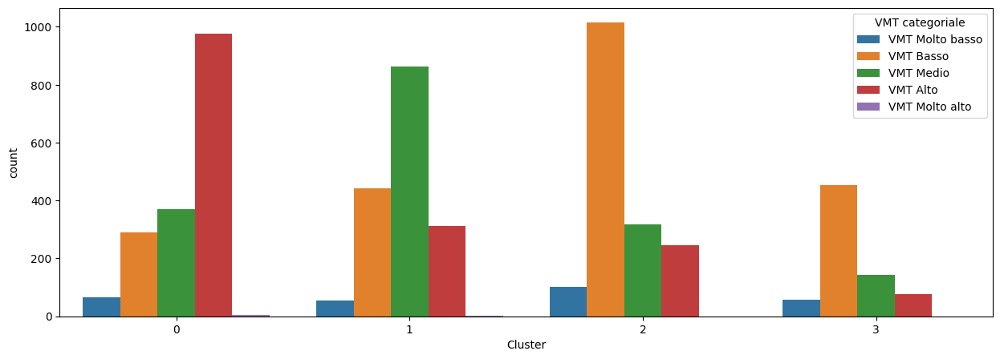

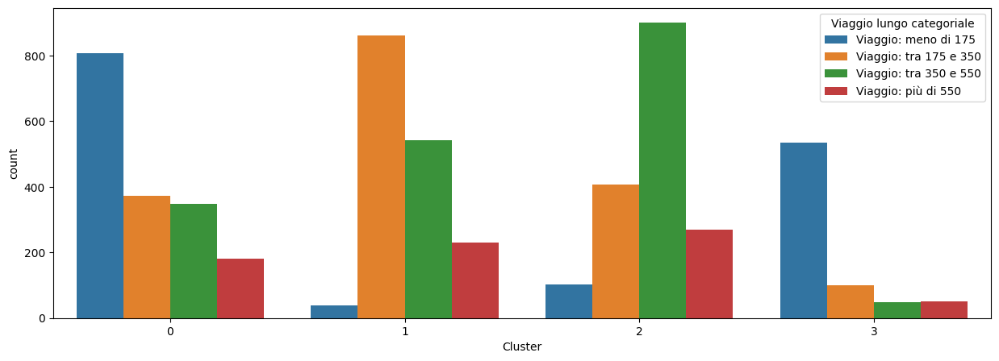

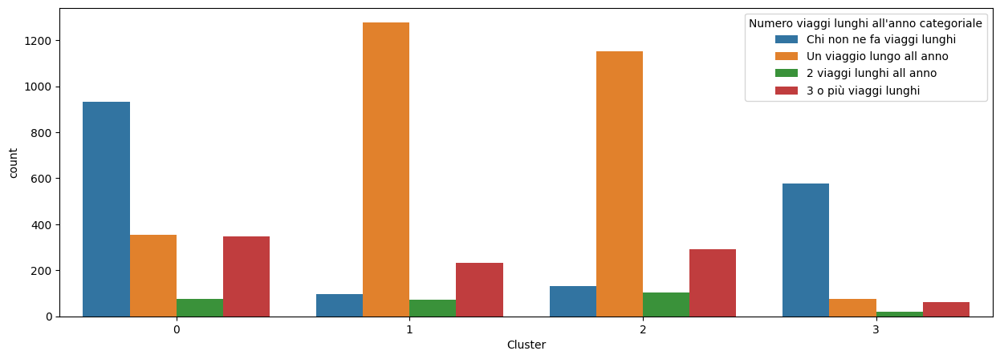

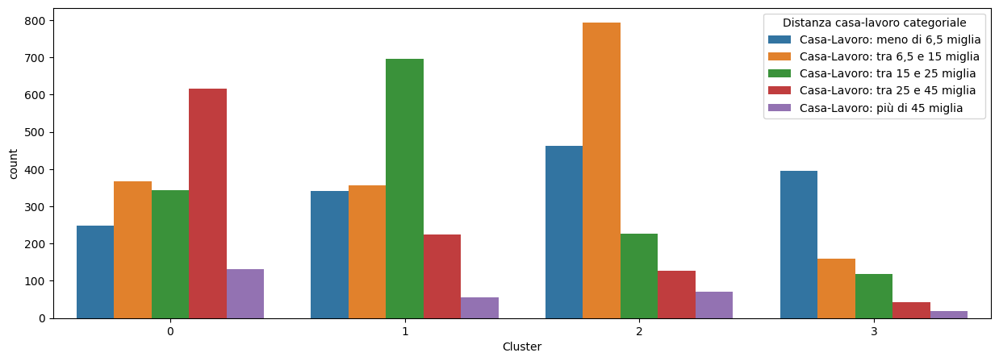

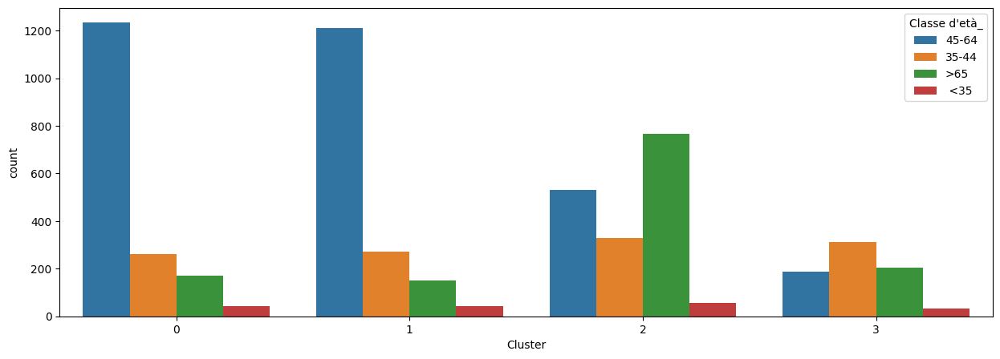

In [ ]:
all_features = data_kmode_reduced.columns.tolist()
#cluster_0_data = data_BEV[data_BEV['Cluster'] == 2]
for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='Cluster',hue=col, data = data_kmode_reduced)
    plt.show()

#### *7.1.7.2 Confronto tra il modello completo e reduced*

In [ ]:
data_kmode_red1= data_kmode_reduced[data_kmode_reduced['Cluster'] == 0]
data_kmode_red1.drop(columns=['Cluster'], inplace=True)

data_kmode_red2= data_kmode_reduced[data_kmode_reduced['Cluster'] == 1]
data_kmode_red2.drop(columns=['Cluster'], inplace=True)

data_kmode_red3= data_kmode_reduced[data_kmode_reduced['Cluster'] == 2]
data_kmode_red3.drop(columns=['Cluster'], inplace=True)

data_kmode_red4= data_kmode_reduced[data_kmode_reduced['Cluster'] == 3]
data_kmode_red4.drop(columns=['Cluster'], inplace=True)

<ipython-input-100-f427b85c3a18>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_red1.drop(columns=['Cluster'], inplace=True)
<ipython-input-100-f427b85c3a18>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_red2.drop(columns=['Cluster'], inplace=True)
<ipython-input-100-f427b85c3a18>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_kmode_red3.drop(columns=['Cluster'], inplace=True)
<ipython-input-100-f427b8

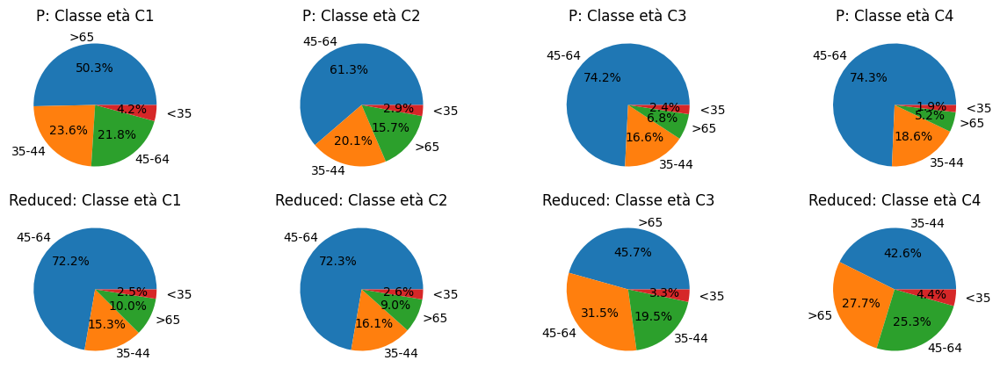

<Figure size 640x480 with 0 Axes>

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

data_kmode1["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='P: Classe età C1').set_ylabel('')
data_kmode2["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='P: Classe età C2').set_ylabel('')
data_kmode3["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='P: Classe età C3').set_ylabel('')
data_kmode4["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='P: Classe età C4').set_ylabel('')

data_kmode_red1["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='Reduced: Classe età C1').set_ylabel('')
data_kmode_red2["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='Reduced: Classe età C2').set_ylabel('')
data_kmode_red3["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='Reduced: Classe età C3').set_ylabel('')
data_kmode_red4["Classe d'età_"].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='Reduced: Classe età C4').set_ylabel('')

plt.show()

plt.tight_layout()
plt.show()

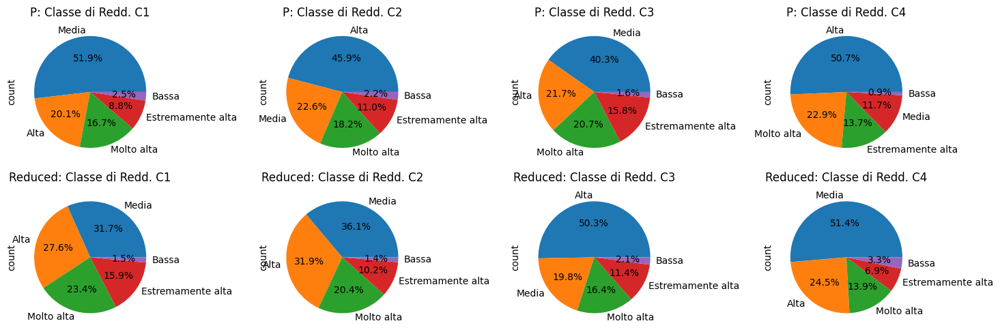

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

data_kmode1['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='P: Classe di Redd. C1')
data_kmode2['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='P: Classe di Redd. C2')
data_kmode3['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='P: Classe di Redd. C3')
data_kmode4['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='P: Classe di Redd. C4')

data_kmode_red1['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='Reduced: Classe di Redd. C1')
data_kmode_red2['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='Reduced: Classe di Redd. C2')
data_kmode_red3['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='Reduced: Classe di Redd. C3')
data_kmode_red4['Classe Reddito Familiare'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='Reduced: Classe di Redd. C4')

plt.tight_layout()
plt.show()

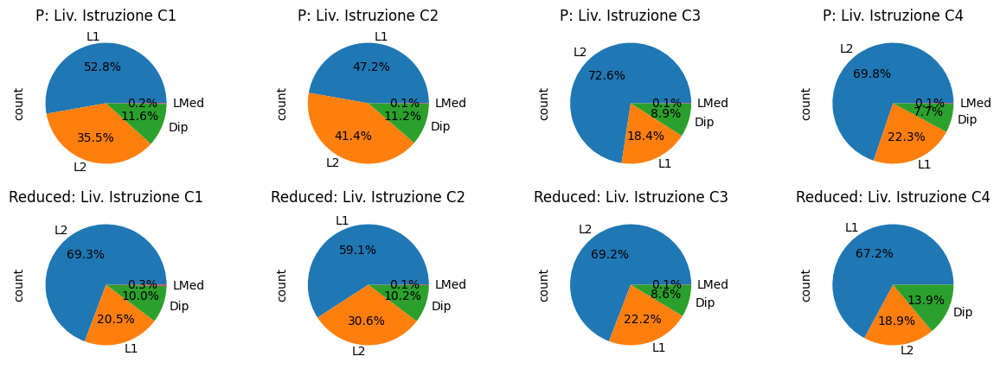

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))


label_mapping = {
    'Laurea 2L o Dottorato': 'L2',
    'Laurea 1L': 'L1',
    'Licenza Media': 'LMed',
    'Diploma o Qualifica professionale': 'Dip'
}

def plot_pie_with_short_labels_red(data, ax, title):
    data_pie = data['Livello di istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_red(data_kmode_red1, axes[1, 0], 'Reduced: Liv. Istruzione C1')
plot_pie_with_short_labels_red(data_kmode_red2, axes[1, 1], 'Reduced: Liv. Istruzione C2')
plot_pie_with_short_labels_red(data_kmode_red3, axes[1, 2], 'Reduced: Liv. Istruzione C3')
plot_pie_with_short_labels_red(data_kmode_red4, axes[1, 3], 'Reduced: Liv. Istruzione C4')


def plot_pie_with_short_labels_P(data, ax, title):
    data_pie = data['Livello di istruzione'].value_counts().rename(index=label_mapping)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)

plot_pie_with_short_labels_P(data_kmode1, axes[0, 0], 'P: Liv. Istruzione C1')
plot_pie_with_short_labels_P(data_kmode2, axes[0, 1], 'P: Liv. Istruzione C2')
plot_pie_with_short_labels_P(data_kmode3, axes[0, 2], 'P: Liv. Istruzione C3')
plot_pie_with_short_labels_P(data_kmode4, axes[0, 3], 'P: Liv. Istruzione C4')

plt.show()

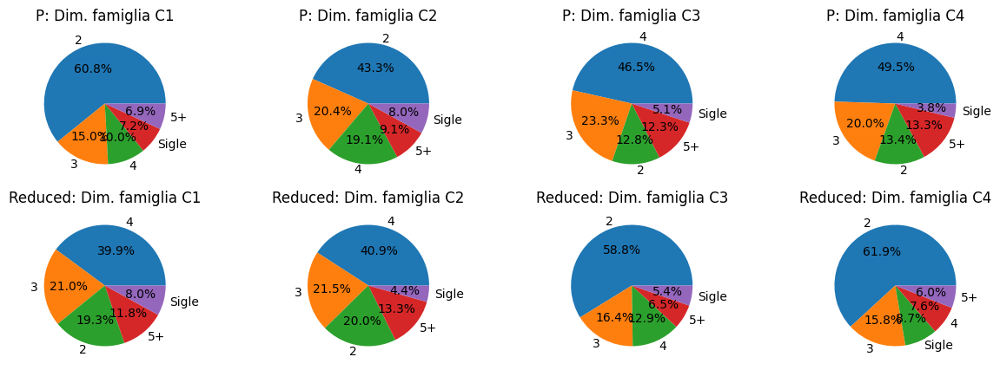

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping2 = {
    'Single': '1',
    'Coppie': '2',
    'Famiglie con 1 figlio': '3',
    'Famiglie con 2 figli': '4',
    'Famiglie con 3 o più di 3 figli': '5+'
}

def plot_pie_with_short_labels_RED(data, ax, title):
    data_pie = data['Numero persone in famiglia categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_RED(data_kmode_red1, axes[1, 0], 'Reduced: Dim. famiglia C1')
plot_pie_with_short_labels_RED(data_kmode_red2, axes[1, 1], 'Reduced: Dim. famiglia C2')
plot_pie_with_short_labels_RED(data_kmode_red3, axes[1, 2], 'Reduced: Dim. famiglia C3')
plot_pie_with_short_labels_RED(data_kmode_red4, axes[1, 3], 'Reduced: Dim. famiglia C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero persone in famiglia categoriale'].value_counts().rename(index=label_mapping2)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[0, 0], 'P: Dim. famiglia C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[0, 1], 'P: Dim. famiglia C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[0, 2], 'P: Dim. famiglia C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[0, 3], 'P: Dim. famiglia C4')

plt.show()

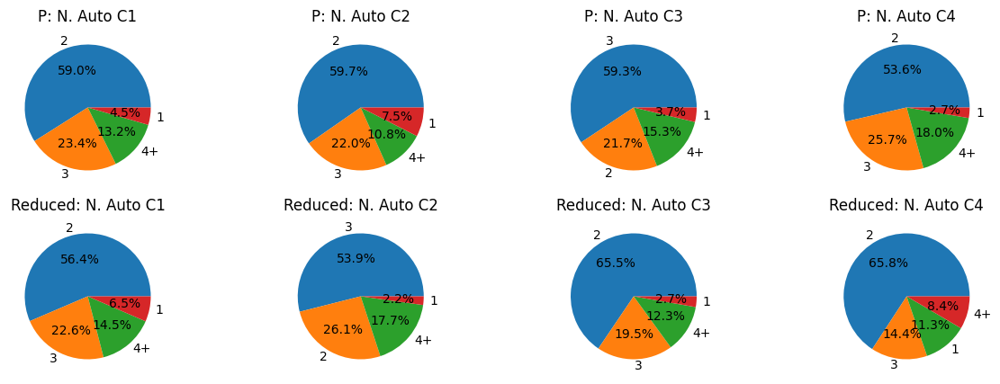

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping3 = {
    'Un Auto': '1',
    'Due Auto': '2',
    'Tre Auto': '3',
    'Più di quattro Auto': '4+'
}

def plot_pie_with_short_labels_red(data, ax, title):
    data_pie = data['Numero di auto in famiglia categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_red(data_kmode_red1, axes[1, 0], 'Reduced: N. Auto C1')
plot_pie_with_short_labels_red(data_kmode_red2, axes[1, 1], 'Reduced: N. Auto C2')
plot_pie_with_short_labels_red(data_kmode_red3, axes[1, 2], 'Reduced: N. Auto C3')
plot_pie_with_short_labels_red(data_kmode_red4, axes[1, 3], 'Reduced: N. Auto C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Numero di auto in famiglia categoriale'].value_counts().rename(index=label_mapping3)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[0, 0], 'P: N. Auto C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[0, 1], 'P: N. Auto C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[0, 2], 'P: N. Auto C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[0, 3], 'P: N. Auto C4')

plt.show()

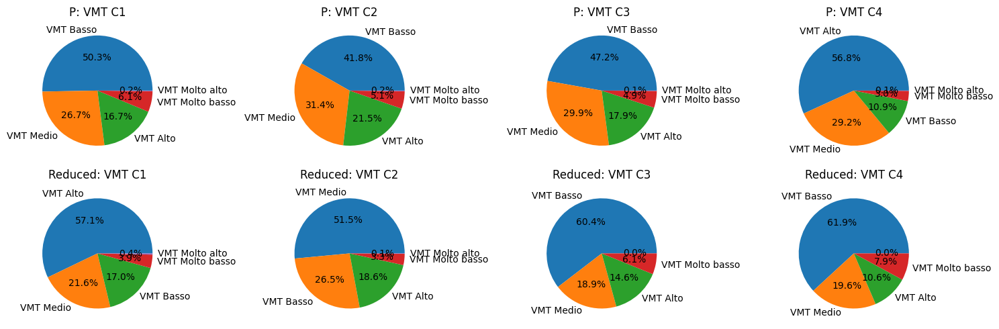

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))
data_kmode1['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 0], title='P: VMT C1').set_ylabel('')
data_kmode2['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 1], title='P: VMT C2').set_ylabel('')
data_kmode3['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 2], title='P: VMT C3').set_ylabel('')
data_kmode4['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[0, 3], title='P: VMT C4').set_ylabel('')

data_kmode_red1['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 0], title='Reduced: VMT C1').set_ylabel('')
data_kmode_red2['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 1], title='Reduced: VMT C2').set_ylabel('')
data_kmode_red3['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 2], title='Reduced: VMT C3').set_ylabel('')
data_kmode_red4['VMT categoriale'].value_counts().plot.pie(autopct='%1.1f%%', ax=axes[1, 3], title='Reduced: VMT C4').set_ylabel('')


plt.tight_layout()
plt.show()

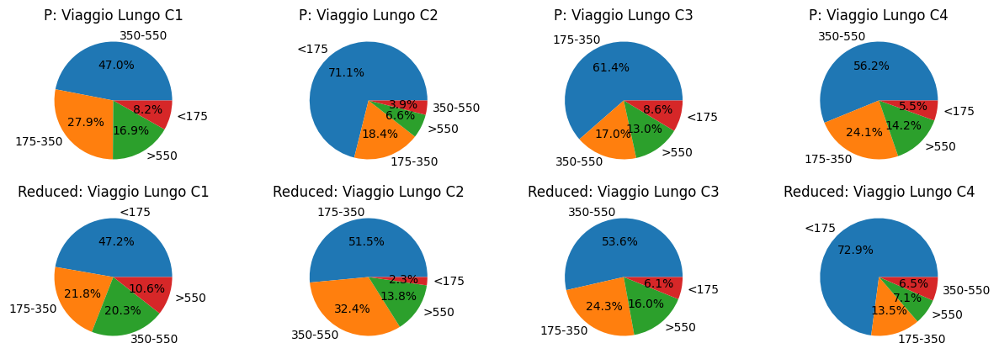

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping4 = {
    'Viaggio: meno di 175': '<175',
    'Viaggio: tra 175 e 350': '175-350',
    'Viaggio: tra 350 e 550': '350-550',
    'Viaggio: più di 550': '>550'
}

def plot_pie_with_short_labels_red(data, ax, title):
    data_pie = data['Viaggio lungo categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_red(data_kmode_red1, axes[1, 0], 'Reduced: Viaggio Lungo C1')
plot_pie_with_short_labels_red(data_kmode_red2, axes[1, 1], 'Reduced: Viaggio Lungo C2')
plot_pie_with_short_labels_red(data_kmode_red3, axes[1, 2], 'Reduced: Viaggio Lungo C3')
plot_pie_with_short_labels_red(data_kmode_red4, axes[1, 3], 'Reduced: Viaggio Lungo C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data['Viaggio lungo categoriale'].value_counts().rename(index=label_mapping4)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[0, 0], 'P: Viaggio Lungo C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[0, 1], 'P: Viaggio Lungo C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[0, 2], 'P: Viaggio Lungo C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[0, 3], 'P: Viaggio Lungo C4')

plt.show()

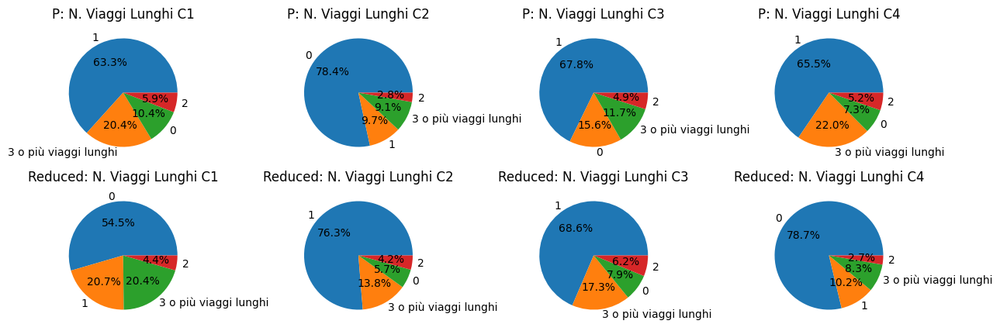

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping5 = {
    'Chi non ne fa viaggi lunghi': '0',
    'Un viaggio lungo all anno': '1',
    '2 viaggi lunghi all anno': '2',
    '3 o più viaggi lunghi0': '3+'
}

def plot_pie_with_short_labels_red(data, ax, title):
    data_pie = data["Numero viaggi lunghi all'anno categoriale"].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_red(data_kmode_red1, axes[1, 0], 'Reduced: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_red(data_kmode_red2, axes[1, 1], 'Reduced: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_red(data_kmode_red3, axes[1, 2], 'Reduced: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_red(data_kmode_red4, axes[1, 3], 'Reduced: N. Viaggi Lunghi C4')


def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Numero viaggi lunghi all'anno categoriale"].value_counts().rename(index=label_mapping5)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[0, 0], 'P: N. Viaggi Lunghi C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[0, 1], 'P: N. Viaggi Lunghi C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[0, 2], 'P: N. Viaggi Lunghi C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[0, 3], 'P: N. Viaggi Lunghi C4')

plt.show()

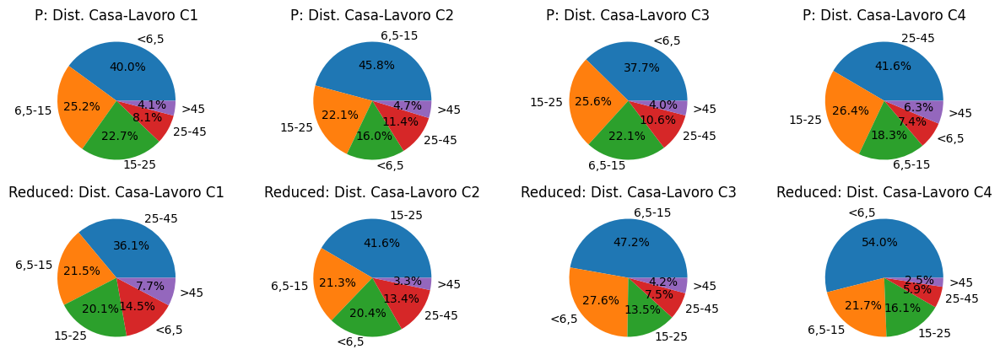

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 5))

label_mapping6 = {
    'Casa-Lavoro: meno di 6,5 miglia': '<6,5',
    'Casa-Lavoro: tra 6,5 e 15 miglia': '6,5-15',
    'Casa-Lavoro: tra 15 e 25 miglia': '15-25',
    'Casa-Lavoro: tra 25 e 45 miglia': '25-45',
    'Casa-Lavoro: più di 45 miglia': '>45'
}

def plot_pie_with_short_labels_red(data, ax, title):
    data_pie = data["Distanza casa-lavoro categoriale"].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_red(data_kmode_red1, axes[1, 0], 'Reduced: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_red(data_kmode_red2, axes[1, 1], 'Reduced: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_red(data_kmode_red3, axes[1, 2], 'Reduced: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_red(data_kmode_red4, axes[1, 3], 'Reduced: Dist. Casa-Lavoro C4')

def plot_pie_with_short_labels_P2(data, ax, title):
    data_pie = data["Distanza casa-lavoro categoriale"].value_counts().rename(index=label_mapping6)
    data_pie.plot.pie(autopct='%1.1f%%', ax=ax, title=title)
    ax.set_ylabel('')

plot_pie_with_short_labels_P2(data_kmode1, axes[0, 0], 'P: Dist. Casa-Lavoro C1')
plot_pie_with_short_labels_P2(data_kmode2, axes[0, 1], 'P: Dist. Casa-Lavoro C2')
plot_pie_with_short_labels_P2(data_kmode3, axes[0, 2], 'P: Dist. Casa-Lavoro C3')
plot_pie_with_short_labels_P2(data_kmode4, axes[0, 3], 'P: Dist. Casa-Lavoro C4')

plt.show()

## 7.2. Algoritmo: K-MEANS

In [ ]:
data_kmeans = pd.read_csv("/content/drive/MyDrive/Tesi/data_con_cluster.csv", sep=",")
data_kmeans_2 = pd.read_csv("/content/drive/MyDrive/Tesi/data_con_cluster2.csv", sep=",")
data_kmeans_org = pd.read_csv("/content/drive/MyDrive/Tesi/data_con_clusterorg.csv", sep=",")

In [ ]:
data_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5796 entries, 0 to 5795
Data columns (total 43 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        5796 non-null   object 
 1   Genere_dummy                                                  5796 non-null   int64  
 2   Classe.d.età                                                  5796 non-null   object 
 3   Età                                                           5796 non-null   int64  
 4   Reddito.familiare                                             5796 non-null   int64  
 5   Classe.Reddito.Familiare                                      5796 non-null   object 
 6   Livello.di.istruzione                                         5796 non-null   object 
 7   Livello.di.istruzione.num                                     5796 no

In [ ]:
selected_data2 = data_kmeans_2.iloc[:, [0, 2, 13, 33,32, 36, 37,38,39, 42]]


In [ ]:
selected_data = data_kmeans_2.iloc[:, [0, 2, 5,6,8,9,10,11,13, 27,28,29,30,42]]


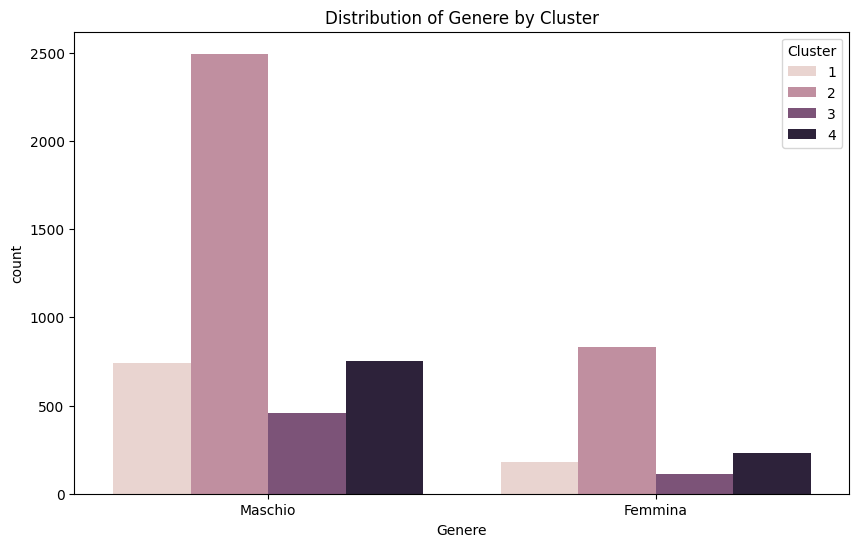

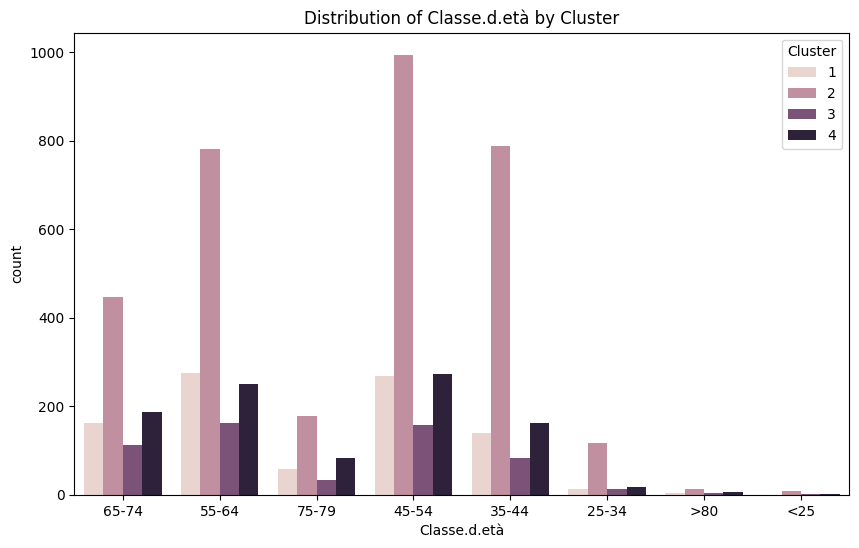

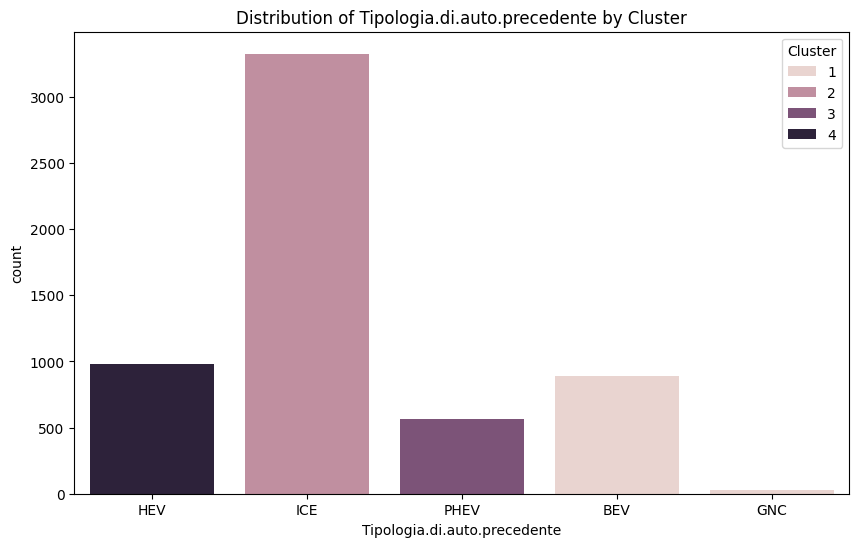

<Figure size 1000x600 with 0 Axes>

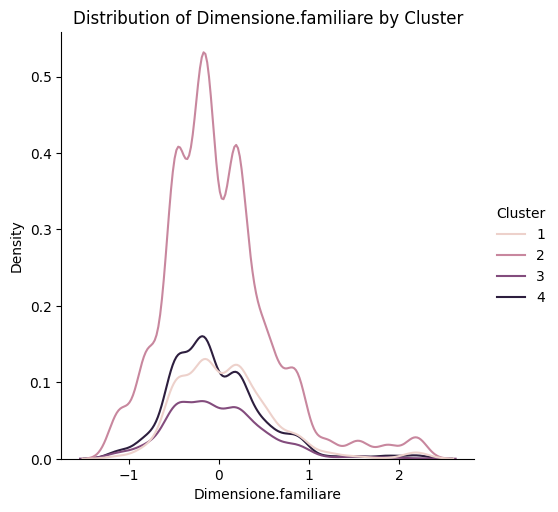

<Figure size 1000x600 with 0 Axes>

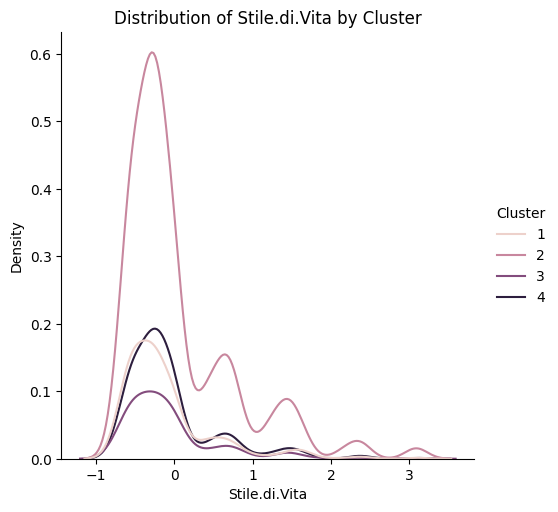

<Figure size 1000x600 with 0 Axes>

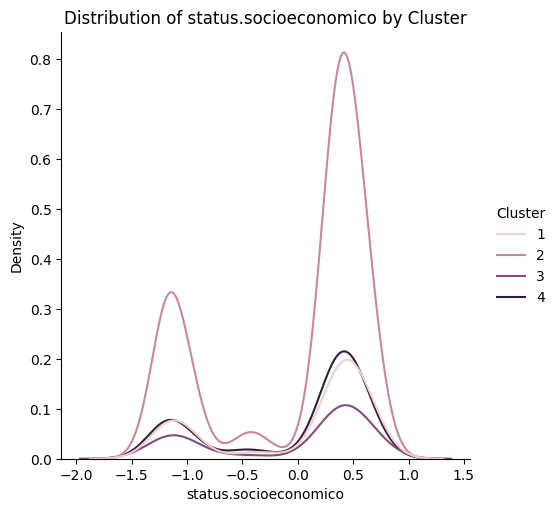

<Figure size 1000x600 with 0 Axes>

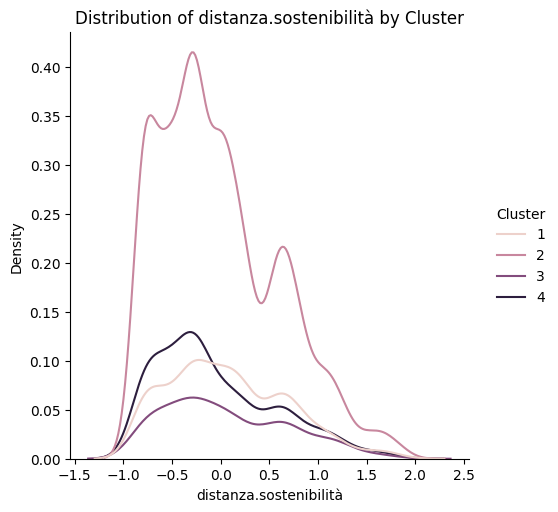

<Figure size 1000x600 with 0 Axes>

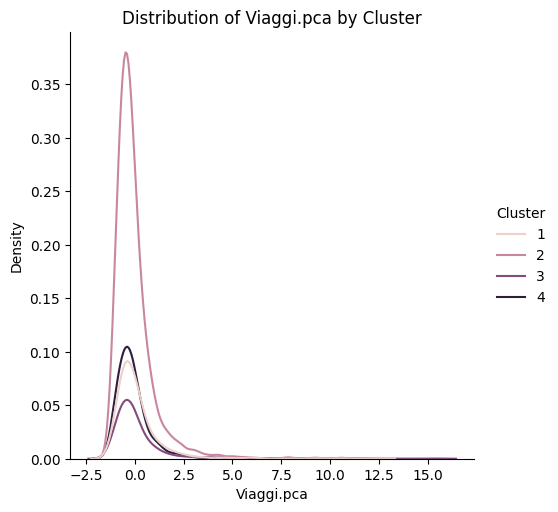

<Figure size 1000x600 with 0 Axes>

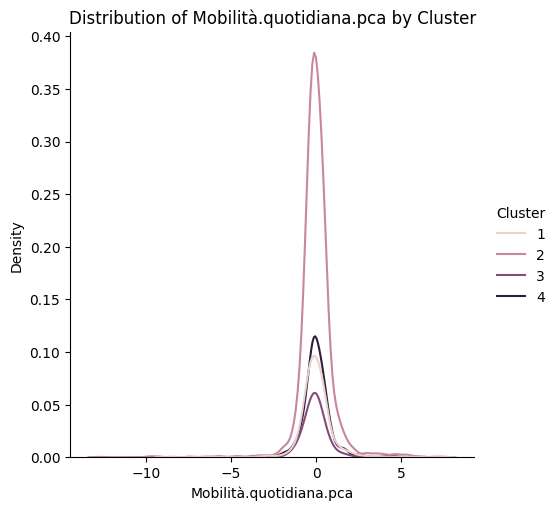

In [ ]:
for col in data_kmeans_2.columns:
  if col != 'Cluster':
    plt.figure(figsize=(10, 6))
    # Check if the column is numeric
    if pd.api.types.is_numeric_dtype(selected_data2[col]):
        sns.displot(data=selected_data2, x=col, hue='Cluster', kind="kde")
    else:
        # For categorical columns, use a different plot type, e.g., countplot
        sns.countplot(data=selected_data2, x=col, hue='Cluster')
    plt.title(f'Distribution of {col} by Cluster')
    plt.show()

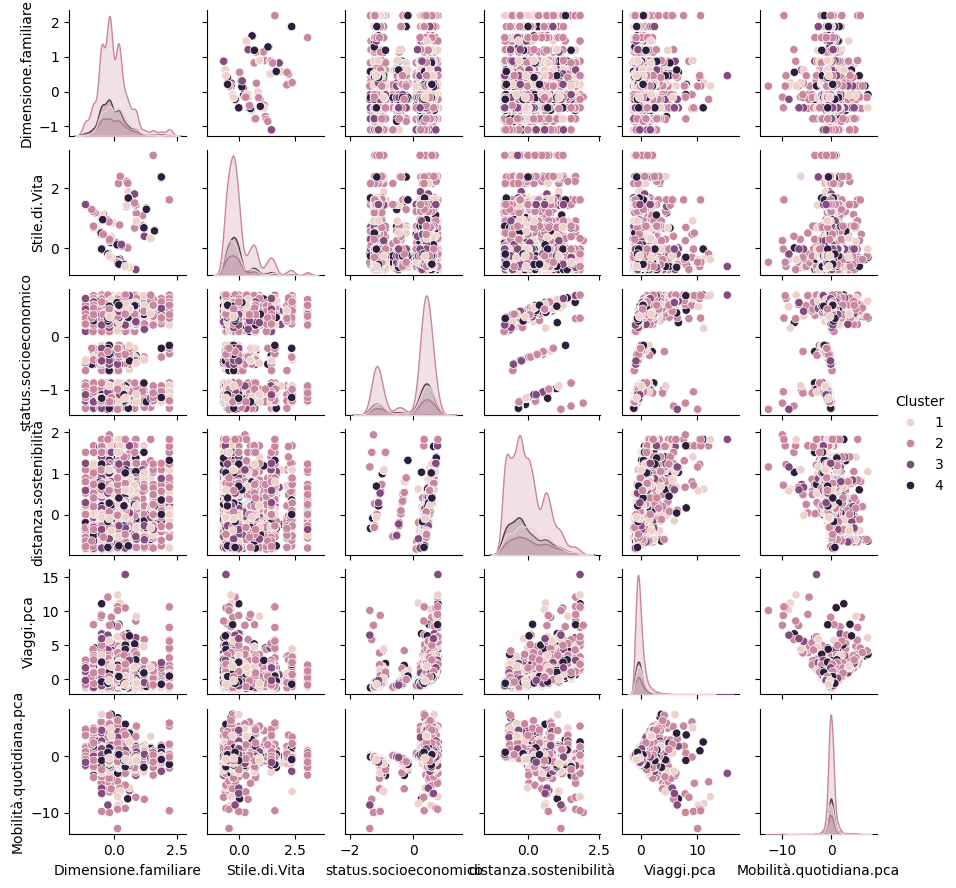

In [ ]:
sns.pairplot(selected_data2, hue='Cluster',height=1.5)

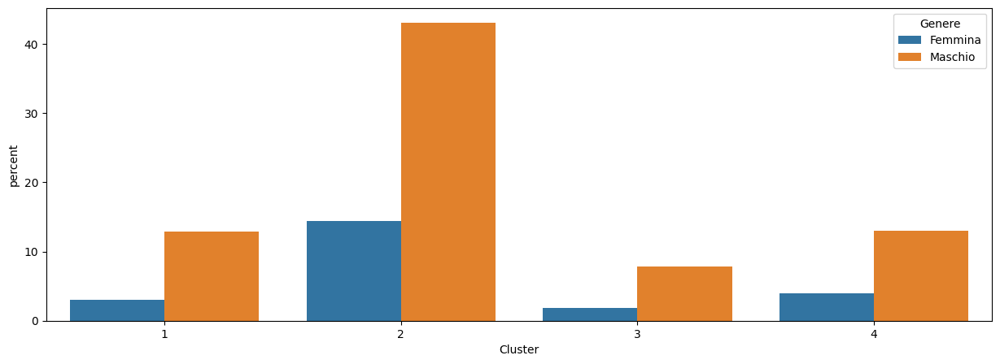

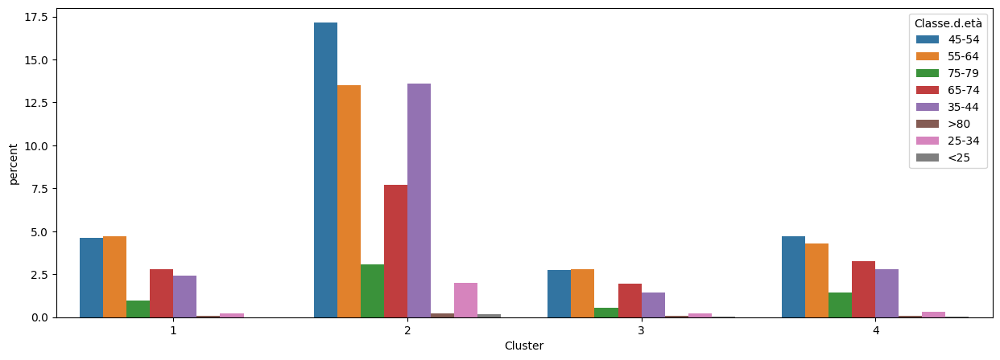

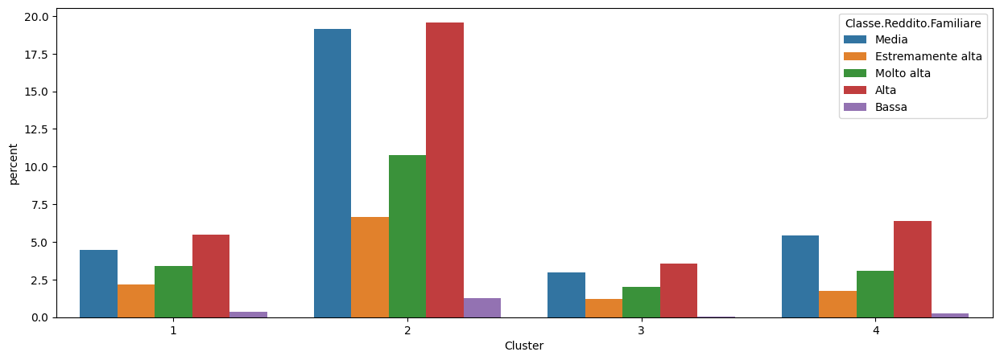

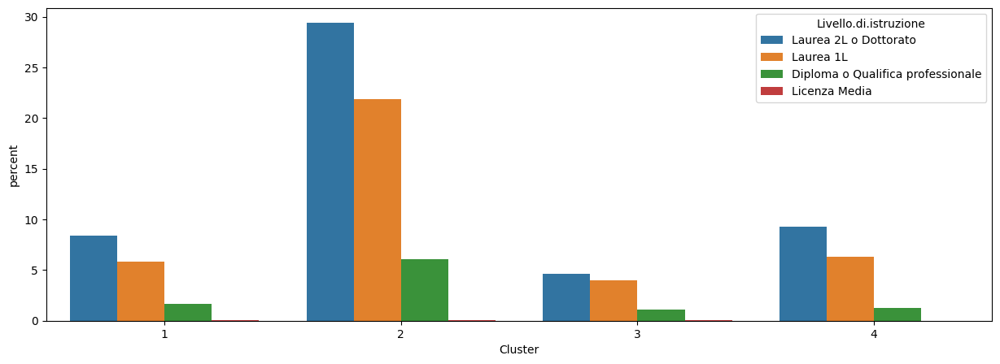

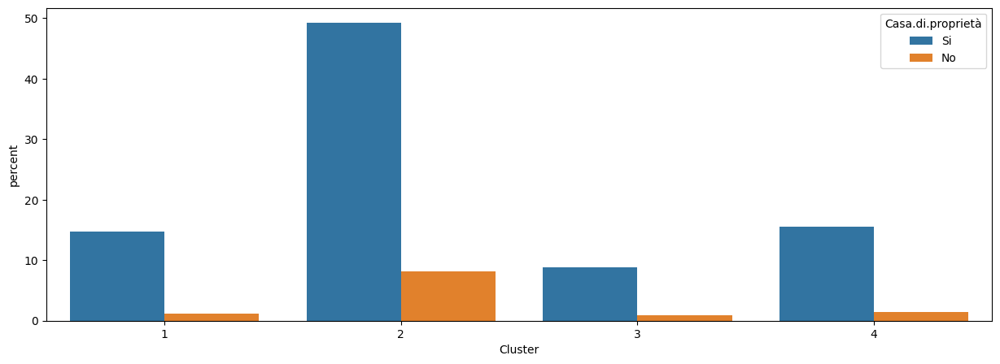

...

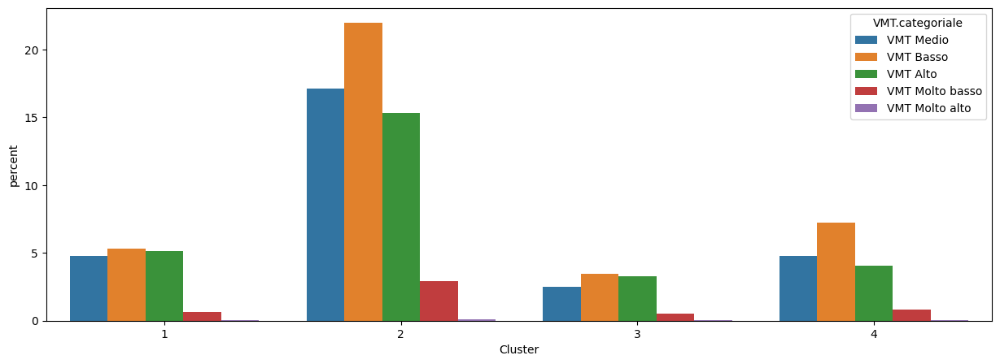

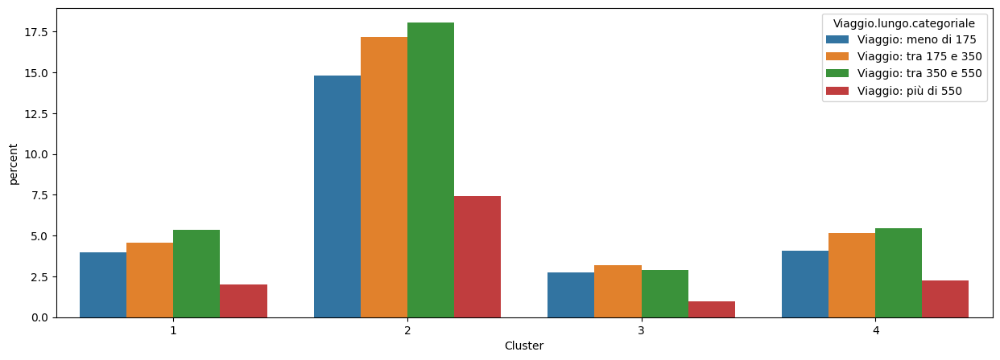

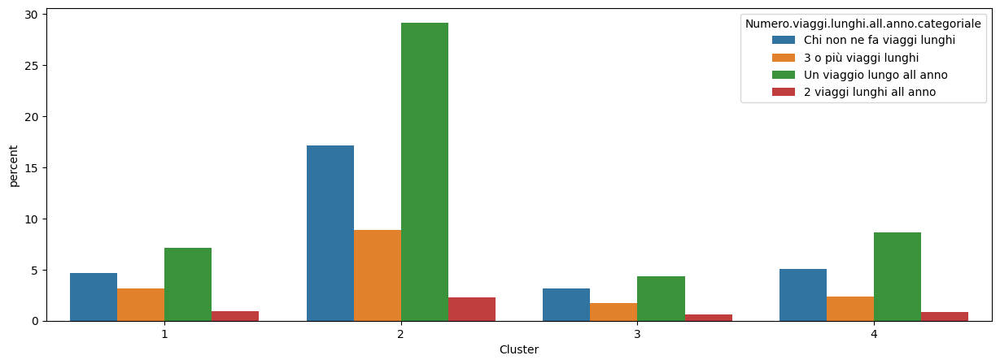

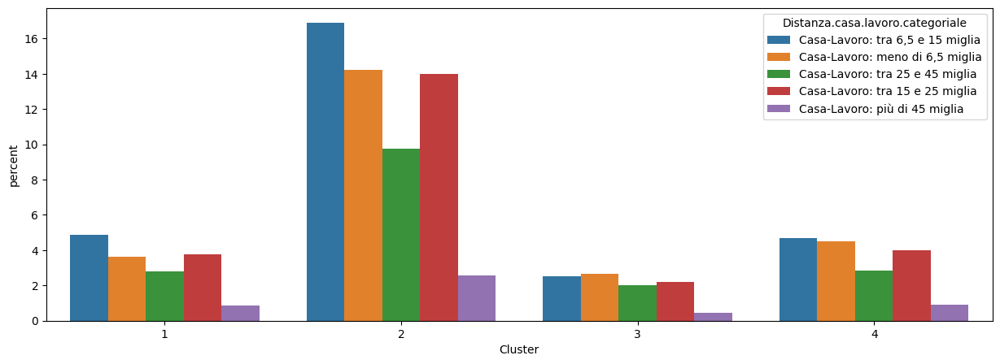

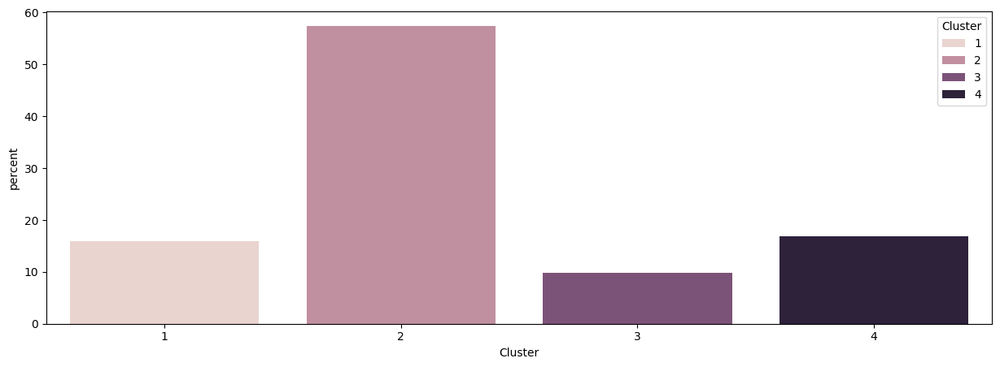

In [ ]:
all_features = selected_data.columns.tolist()

#cluster_0_data = data_BEV[data_BEV['Cluster'] == 2]

for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='Cluster',hue=col, data = selected_data, stat="percent")
    plt.show()

## 7.3. K Prototype

In [ ]:
dataKP = data2.copy()
dataKP = dataKP[dataKP['BEV dummy'] == 1]
dataKP.drop(columns=["BEV dummy", "Tipologia di auto precedente: BEV vs PHEV", "Tipologia di auto precedente: HEV vs PHEV", "Tipologia di auto precedente: GNC vs PHEV",
                     "Tipologia di auto precedente: ICE vs PHEV", "Livello di istruzione: Licenza media vs Laurea 2L o Dottorato", "Livello di istruzione: Diploma o Qualifica professionale vs Laurea 2L o Dottorato",
                     "Livello di istruzione: Laurea 1L vs Laurea 2L o Dottorato", "Classe d'età: <25 vs 35-44", "Classe d'età: 25-34 vs 35-44", "Classe d'età: 45-54 vs 35-44", "Classe d'età: 55-64 vs 35-44",
                     "Classe d'età: 65-74 vs 35-44", "Classe d'età: 75-79 vs 35-44", "Classe d'età: >80 vs 35-44", "Tipologia di auto precedente: BEV vs PHEV", "Tipologia di auto precedente: HEV vs PHEV",
                     "Tipologia di auto precedente: GNC vs PHEV", "Tipologia di auto precedente: ICE vs PHEV", "Classe Reddito Familiare: Bassa vs Media", "Classe Reddito Familiare: Alta vs Media",
                     "Classe Reddito Familiare: Molto alta vs Media", "Classe Reddito Familiare: Estremamente alta vs Media", "Auto attuale", "Reddito familiare"], inplace=True)

dataKP

<ipython-input-130-a1d6a8e65f7f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataKP.drop(columns=["BEV dummy", "Tipologia di auto precedente: BEV vs PHEV", "Tipologia di auto precedente: HEV vs PHEV", "Tipologia di auto precedente: GNC vs PHEV",


,Genere,Classe d'età,Classe Reddito Familiare,Livello di istruzione,Casa di proprietà,Casa Indipendente,Numero persone in famiglia,Numero di auto in famiglia,Importanza di ridurre le emissioni di gas serra,Tipologia di auto precedente,Tipologia di auto attuale,Viaggio più lungo negli ultimi 12 mesi,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,Distanza casa-lavoro,VMT annuo
284,1,65-74,Estremamente alta,Laurea 2L o Dottorato,1,1,2.0,3.0,2.63,HEV,BEV,324.95,1,22.51,5667
286,1,55-64,Media,Laurea 1L,1,1,2.0,3.0,-2.97,ICE,BEV,571.75,1,15.58,10992
287,1,75-79,Molto alta,Laurea 2L o Dottorato,1,1,3.0,5.0,2.87,ICE,BEV,715.41,1,8.35,5684
289,1,55-64,Alta,Laurea 2L o Dottorato,1,1,2.0,2.0,1.58,HEV,BEV,120.40,0,2.19,5714
290,1,45-54,Molto alta,Laurea 1L,1,1,5.0,2.0,2.57,ICE,BEV,407.45,1,40.95,16800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10679,1,45-54,Molto alta,Laurea 2L o Dottorato,1,1,3.0,2.0,2.36,HEV,BEV,492.19,1,2.79,5454
10680,1,35-44,Media,Laurea 1L,1,1,4.0,2.0,2.57,ICE,BEV,305.67,1,35.66,18800
10682,1,25-34,Alta,Diploma o Qualifica professionale,0,0,2.0,2.0,2.74,PHEV,BEV,99.00,0,44.72,9129
10686,0,55-64,Molto alta,Laurea 1L,1,1,4.0,2.0,0.03,BEV,BEV,227.55,2,17.29,13000


In [ ]:
categorical_features_indices = [dataKP.columns.get_loc(col) for col in dataKP.select_dtypes(include=['object', 'category']).columns]

# Apply KPrototypes with categorical features specified
kproto = KPrototypes(n_clusters=4, init='Cao', n_jobs=-1)  # Use all CPU cores if possible
clusters = kproto.fit_predict(dataKP, categorical=categorical_features_indices)
dataKP.insert(0, "Cluster", clusters, True)

In [ ]:
dataKP.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5796 entries, 284 to 10687
Data columns (total 16 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Cluster                                                       5796 non-null   uint16 
 1   Genere                                                        5796 non-null   int64  
 2   Classe d'età                                                  5796 non-null   object 
 3   Classe Reddito Familiare                                      5796 non-null   object 
 4   Livello di istruzione                                         5796 non-null   object 
 5   Casa di proprietà                                             5796 non-null   int64  
 6   Casa Indipendente                                             5796 non-null   int64  
 7   Numero persone in famiglia                                    5796 non-

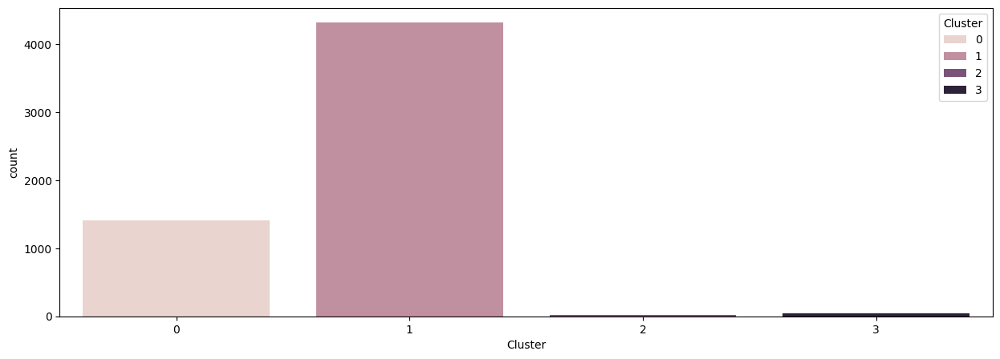

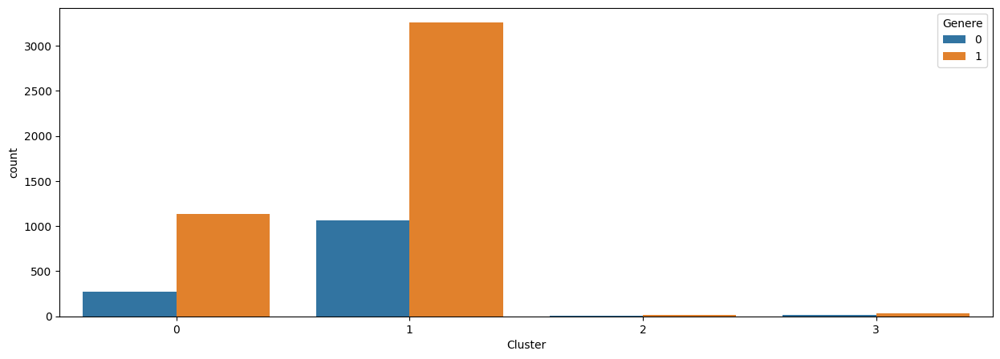

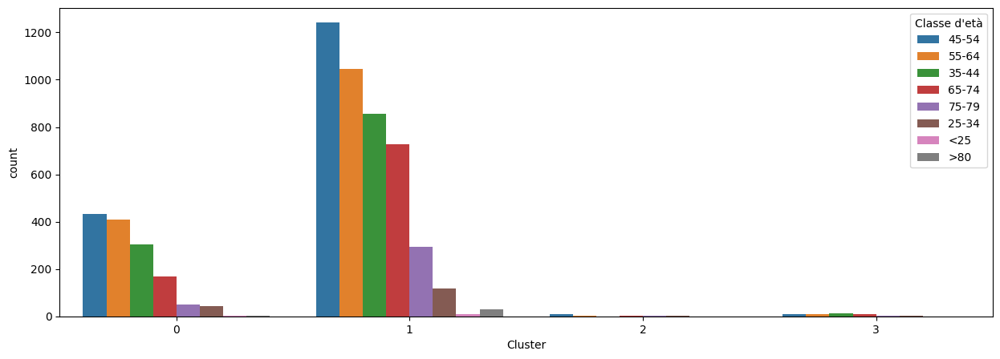

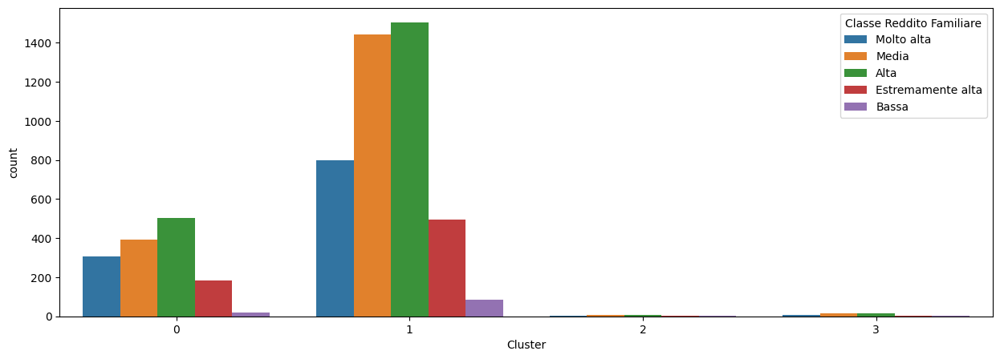

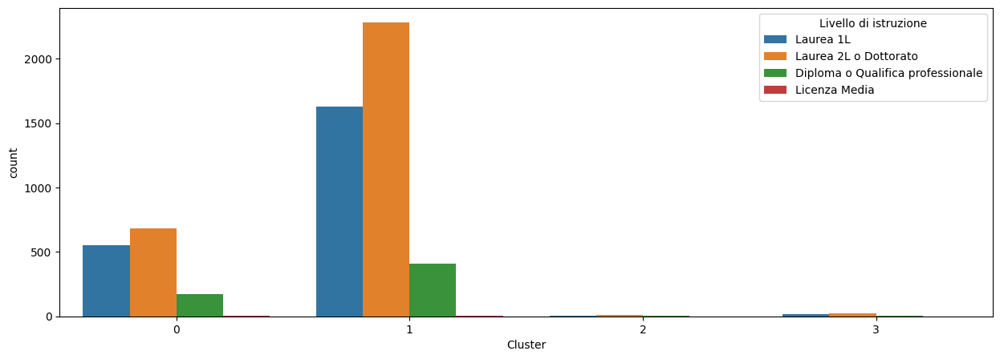

...

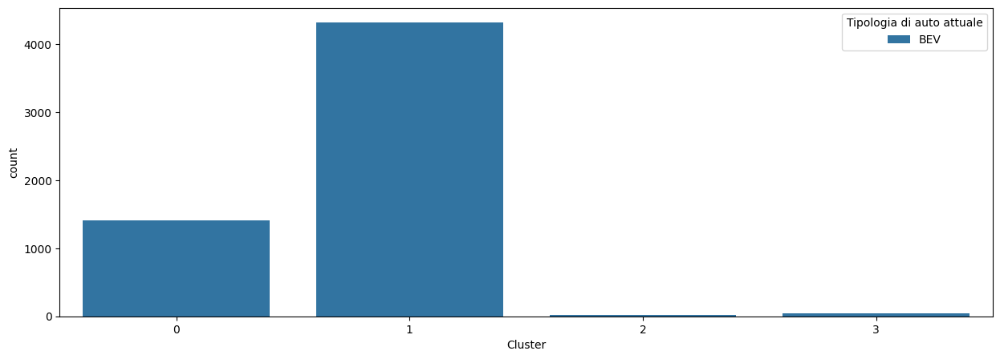

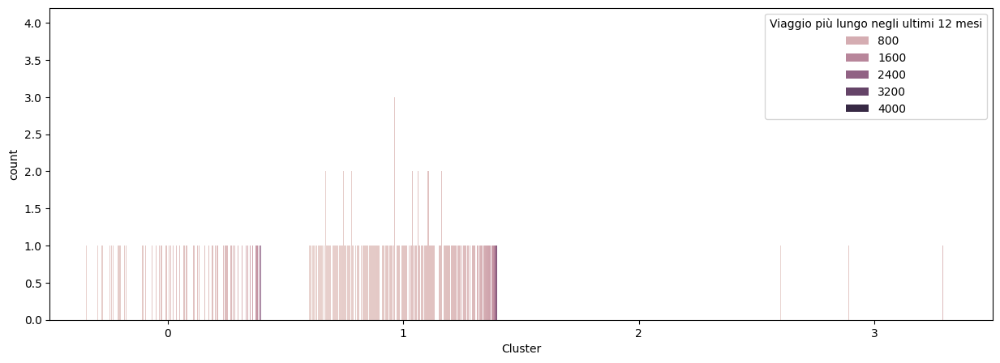

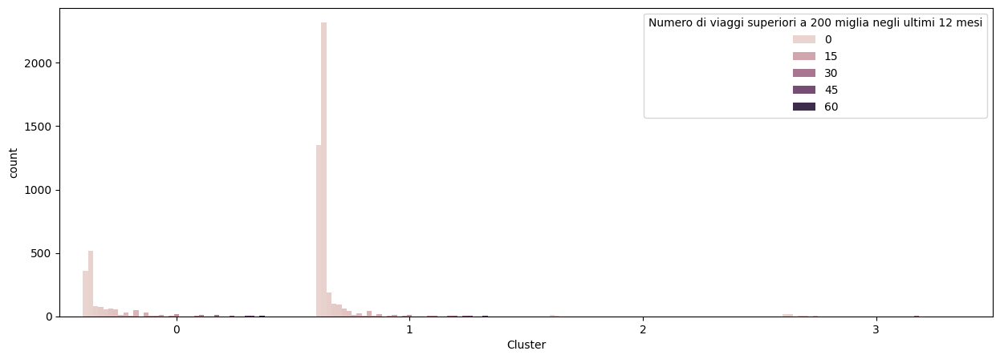

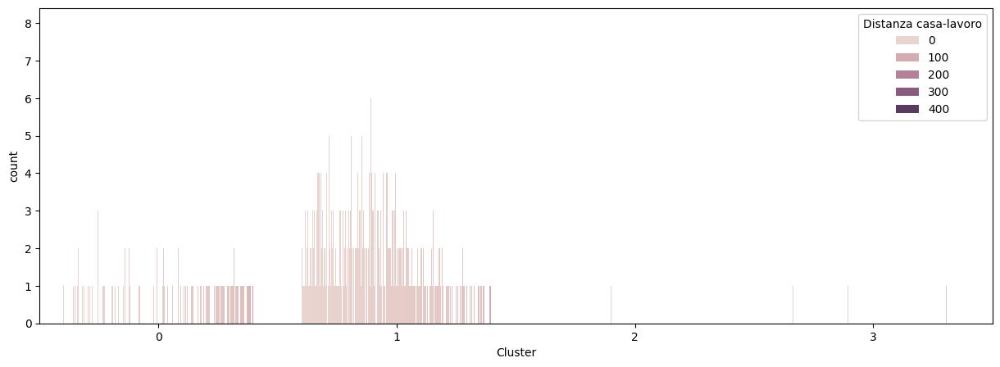

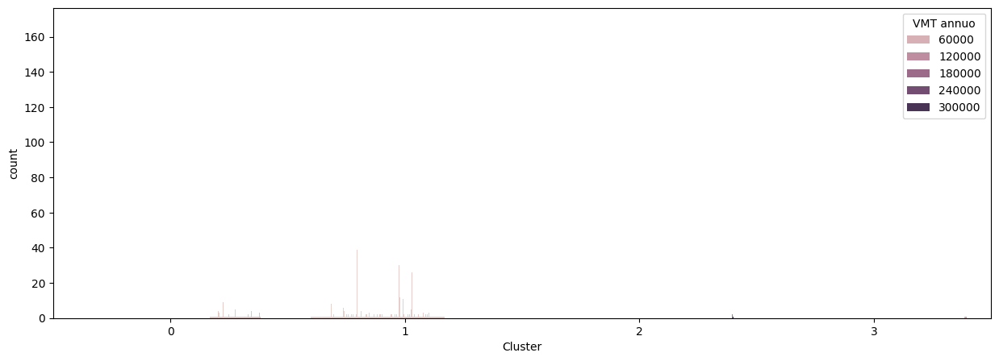

In [ ]:
all_features = dataKP.columns.tolist()
#cluster_0_data = data_BEV[data_BEV['Cluster'] == 2]
for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.countplot(x='Cluster',hue=col, data = dataKP)
    plt.show()

## 7.4. Gerarchico

In [ ]:
data_ricercatore.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10695 entries, 0 to 10694
Data columns (total 36 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere_                                                       10695 non-null  object 
 1   Genere                                                        10695 non-null  int64  
 2   Età                                                           10695 non-null  int64  
 3   Classe d'età                                                  10695 non-null  object 
 4   Classe d'età: <25 vs 45-54                                    10695 non-null  int64  
 5   Classe d'età: 25-34 vs 45-54                                  10695 non-null  int64  
 6   Classe d'età: 35-44 vs 45-54                                  10695 non-null  int64  
 7   Classe d'età: 55-64 vs 45-54                                  10695

In [ ]:
data_ger = data_ricercatore.drop(columns=['Genere_', 'Età', "Classe d'età", 'Reddito familiare', "Classe Reddito Familiare", "Livello di istruzione", "Auto", "Tipologia"])

In [ ]:
data_ger.head()

,Genere,Classe d'età: <25 vs 45-54,Classe d'età: 25-34 vs 45-54,Classe d'età: 35-44 vs 45-54,Classe d'età: 55-64 vs 45-54,Classe d'età: 65-74 vs 45-54,Classe d'età: 75-79 vs 45-54,Classe d'età: >80 vs 45-54,Classe Reddito Familiare: Medio-Bassa vs Media,Classe Reddito Familiare: Medio-Alta vs Media,...,Auto precedente: PHEV,Auto precedente: BEV,Auto precedente: HEV,Auto precedente: GNC,Auto precedente: ICE,Importanza di ridurre le emissioni di gas serra,Viaggio più lungo negli ultimi 12 mesi,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,Distanza casa-lavoro,VMT annuo
0,0,0,0,0,0,1,0,0,0,1,...,1,0,0,0,0,"2,52",483.14,0.0,0.01,14622
1,0,0,0,0,0,1,0,0,0,1,...,0,0,1,0,0,"2,76",568.09,1.0,10.69,"9197,142857"
2,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,"2,6",255.16,0.0,17.63,"5082,352941"
3,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,"1,23",312.78,1.0,3.53,"13025,45455"
4,0,0,0,0,0,0,0,0,0,1,...,0,0,1,0,0,"1,08",125.79,1.0,28.05,18000


In [ ]:
data_BEV_ger = data_ger[data_ger['BEV dummy'] == 1]

In [ ]:
data_BEV_ger.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5802 entries, 284 to 10694
Data columns (total 28 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        5802 non-null   int64  
 1   Classe d'età: <25 vs 45-54                                    5802 non-null   int64  
 2   Classe d'età: 25-34 vs 45-54                                  5802 non-null   int64  
 3   Classe d'età: 35-44 vs 45-54                                  5802 non-null   int64  
 4   Classe d'età: 55-64 vs 45-54                                  5802 non-null   int64  
 5   Classe d'età: 65-74 vs 45-54                                  5802 non-null   int64  
 6   Classe d'età: 75-79 vs 45-54                                  5802 non-null   int64  
 7   Classe d'età: >80 vs 45-54                                    5802 non-

In [ ]:
for column in data_BEV_ger.columns:
    # Check if the column is of object type (likely string)
    if data_BEV_ger[column].dtype == 'object':
        # Attempt to convert the column to numeric, replacing commas with periods
        try:
            data_BEV_ger[column] = pd.to_numeric(data_BEV_ger[column].str.replace(',', '.'))
        except ValueError:
            # If conversion fails for any reason, print a warning and skip the column
            print(f"Warning: Could not convert column '{column}' to numeric. Skipping.")

<ipython-input-35-c55c511c37e3>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_BEV_ger[column] = pd.to_numeric(data_BEV_ger[column].str.replace(',', '.'))


In [ ]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(data_BEV_ger)

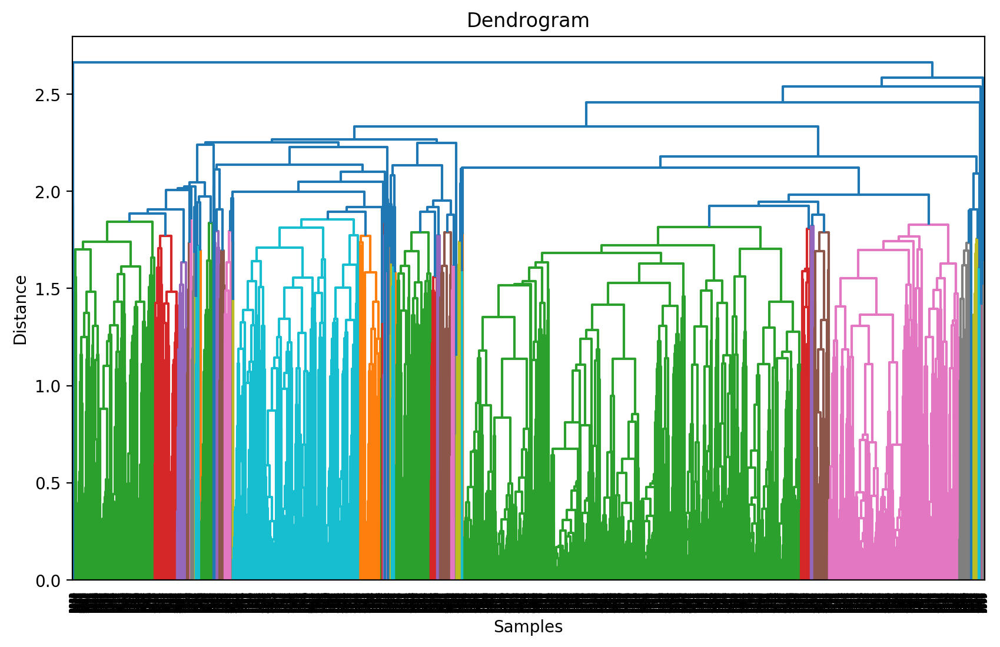

In [ ]:
linked = linkage(X_scaled, method='average')


plt.figure(figsize=(10, 6),dpi=200)
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

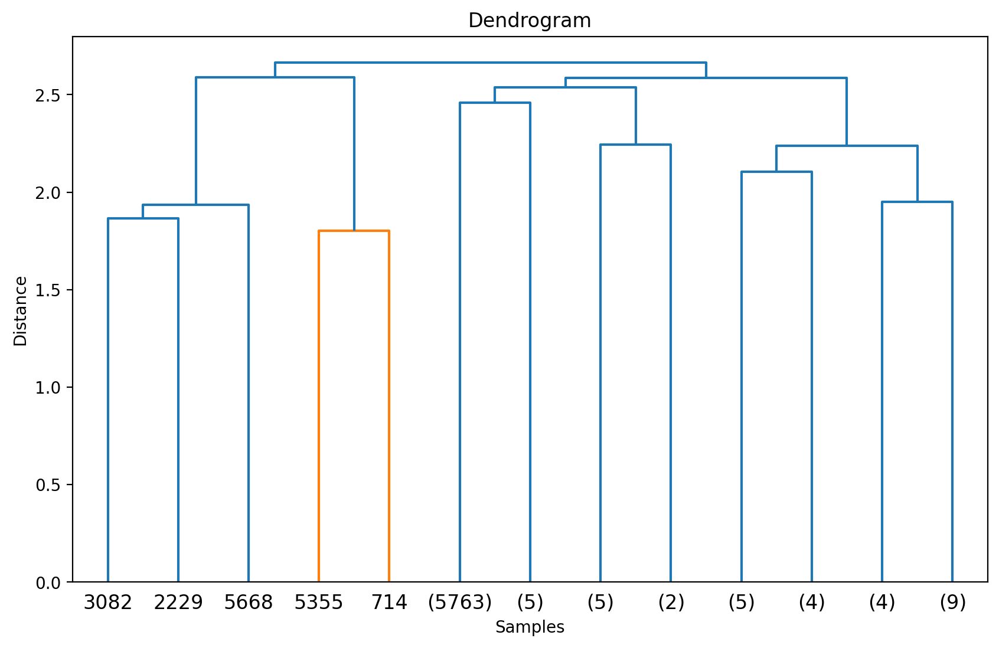

In [ ]:
##Troppo grande! Tronchiamo il dendrogramma
plt.figure(figsize=(10, 6),dpi=200)
dendrogram(linked, orientation='top', distance_sort='descending', truncate_mode='level', p=3, show_leaf_counts=True)
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')
plt.show()

In [ ]:
##Vediamo a quali cluster sono associate le singole osservazioni
print(data_BEV_ger['cluster'])

284      3
286      3
287      3
289      3
290      3
        ..
10686    3
10687    3
10689    1
10693    3
10694    3
Name: cluster, Length: 5802, dtype: int32
